# Imports

In [2]:
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline

In [3]:
from astropy.io import ascii,fits
import pandas as pd
import math
import scipy.optimize as opt
from scipy.interpolate import make_interp_spline
# from scipy import ndimage

In [4]:
from glob import glob
from matplotlib.colors import LogNorm
import csv
import sys
from scipy.ndimage import gaussian_filter1d as gauss_smooth

In [5]:
import os
pwd = os.getcwd()
print(pwd)
os.chdir(pwd + '/../..')
pwd = os.getcwd()
print(pwd)

/Users/evanrootness/M31_GCs_Folder/M31_GCs/notebooks
/Users/evanrootness/M31_GCs_Folder


In [6]:
function_file = pwd +'/M31_GCs/py_scripts/'
function_file
# sys.path.insert(1, '/Users/evanrootness/DS_Projects/EtsyDSProject/py_scripts/')
sys.path.insert(1, '/Users/evanrootness/M31_GCs_Folder/M31_GCs/py_scripts/')
from reduce import *

In [7]:
# Data directories
datadir = pwd + '/data/aug23/'
# datadir = pwd + '/data/aug23-2/'
# datadir = pwd + '/data/aug23-3/'
octdir = pwd + '/data/oct23/'
# octdir = pwd + '/data/oct23-2/'
# octdir = pwd + '/data/oct23-3/'
# octdir = pwd + '/data/oct23-4/'
# octdir = pwd + '/data/oct23-5/'
BD28dir = pwd + '/data/BD+28_4211/'
specdir = pwd + '/data/Spectral Lines/'
wave_cali_dir = pwd + '/data/Wavelength Calibration/'

arcturus_dir = pwd + '/data/Arcturus/aasfiles.blob.core.windows.net/files/archive/cdrom/volume5/volume5/pasp/v107/p1402/'

In [8]:
# constants
c = 2.99792458 * 10 ** (8) # speed of light in m/s

h_beta = 4861.363
h_gamma = 4340.472
h_delta = 4101.734
h_epsilon = 3970.075
magnesium = 5183.604
O_II = 3911.957
He_II = 5411.2
He_II2 = 4685.7
He_II3 = 4540
S_II = 4070
O_III = 4363
O_I = 5577.3387

# Spectral lines not currently in use
# 10832   HeI
# 9532	[SIII]
# 9069	[SIII]
# 8438	P18
# 7751	[ArIII]
# 7323	[OII]
# 7135	[ArIII]
# 7065	HeI
# 7005	[ArV]
# 6678	HeI
# 6584	[NII]
# 6563	Halpha
# 6548 	[NII]
# 6300	[OI]
# 5876	HeI
# 5755	[NII]
# 5411	HeII
# 5007  	[OIII]
# 4959	[OIII]
# 4861 	Hbeta
# 4686	HeII
# 4540	HeII
# 4471	HeI
# 4341 	Hgamma
# 4363	[OIII]
# 4102	Hdelta
# 4070 	[SII]
# 4026	HeI
# 3968	[NeIII]+Hepsilon
# 3889	HeI
# 3869	[NeIII]
# 3835	H9
# 3805	HeI
# 3727	[OII]

In [9]:
poly4_params_aug23 = pd.read_csv(wave_cali_dir + 'aug23params.csv').to_numpy().squeeze()
poly4_params_aug26 = pd.read_csv(wave_cali_dir + 'aug26params.csv').to_numpy().squeeze()
poly4_params_aug27 = pd.read_csv(wave_cali_dir + 'aug27params.csv').to_numpy().squeeze()
poly4_params_oct03 = pd.read_csv(wave_cali_dir + 'oct03params.csv').to_numpy().squeeze()
poly4_params_oct06 = pd.read_csv(wave_cali_dir + 'oct06params.csv').to_numpy().squeeze()

poly4_covar_aug23 = pd.read_csv(wave_cali_dir + 'aug23covar.csv').to_numpy()
poly4_covar_aug26 = pd.read_csv(wave_cali_dir + 'aug26covar.csv').to_numpy()
poly4_covar_aug27 = pd.read_csv(wave_cali_dir + 'aug27covar.csv').to_numpy()
poly4_covar_oct03 = pd.read_csv(wave_cali_dir + 'oct03covar.csv').to_numpy()
poly4_covar_oct06 = pd.read_csv(wave_cali_dir + 'oct06covar.csv').to_numpy()

pixels23ax = pd.read_csv(wave_cali_dir + 'aug23pix.csv').to_numpy().squeeze()
pixels26ax = pd.read_csv(wave_cali_dir + 'aug26pix.csv').to_numpy().squeeze()
pixels27ax = pd.read_csv(wave_cali_dir + 'aug27pix.csv').to_numpy().squeeze()
pixels03ax = pd.read_csv(wave_cali_dir + 'oct03pix.csv').to_numpy().squeeze()
pixels06ax = pd.read_csv(wave_cali_dir + 'oct06pix.csv').to_numpy().squeeze()

wavelengths23ax = pd.read_csv(wave_cali_dir + 'aug23wave.csv').to_numpy().squeeze()
wavelengths26ax = pd.read_csv(wave_cali_dir + 'aug26wave.csv').to_numpy().squeeze()
wavelengths27ax = pd.read_csv(wave_cali_dir + 'aug27wave.csv').to_numpy().squeeze()
wavelengths03ax = pd.read_csv(wave_cali_dir + 'oct03wave.csv').to_numpy().squeeze()
wavelengths06ax = pd.read_csv(wave_cali_dir + 'oct06wave.csv').to_numpy().squeeze()

# Models

In [10]:
def const(x, b):
  return b
def linear_model(x, m, b):
  return m * x + b
def poly2_model(x, a, b, c):
  return a * x ** 2 + b * x + c
def poly3_model(x, a, b, c, d):
  return a * x ** 3 + b * x ** 2 + c * x + d
def poly4_model(x, a, b, c, d, e):
  return a * x ** 4 + b * x ** 3 + c * x ** 2 + d * x + e
def poly5_model(x, a, b, c, d, e, f):
  return a * x ** 5 + b * x ** 4 + c * x ** 3 + d * x ** 2 + e * x + f

In [11]:
def gaussian_model(x, a, sigma, mean, b):
  return (a * np.exp(- (x - mean) ** 2 / (2 * sigma ** 2))) + b
def neg_gauss_model(x, a, sigma, mean, b):
  return -((a * np.exp(- (x - mean) ** 2 / (2 * sigma ** 2)))) + b
def neg_gauss_mx_model(x, a, sigma, mean, b, c):
  return -((a * np.exp(- (x - mean) ** 2 / (2 * sigma ** 2)))) + b * x + c
def neg_gauss_poly2_model(x, a, sigma, mean, b, c, d):
  return -((a * np.exp(- (x - mean) ** 2 / (2 * sigma ** 2)))) + b * x ** 2 + c * x + d

In [12]:
def Lorentzian_const(x, A, sigma, center, c):
  return A * (sigma / ((x - center) ** 2 + sigma ** 2)) + c
def Lorentzian_lin(x, A, sigma, center, c, d):
  return -(A * (sigma / ((x - center) ** 2 + sigma ** 2))) + c * x + d
def Lorentzian_quad(x, A, sigma, center, b, c, d):
  return -(A * (sigma / ((x - center) ** 2 + sigma ** 2))) + b * x ** 2 + c * x + d

In [13]:
magnesium_1 = 5167.3216
magnesium_2 = 5172.684
magnesium_3 = 5183.604

def lines(xmin=0, xmax=10000, labely=-0.2, legend=False):
    h_beta = 4861.363
    h_gamma = 4340.472
    h_delta = 4101.734
    h_epsilon = 3970.075
    magnesium_1 = 5167.3216
    magnesium_2 = 5172.684
    magnesium_3 = 5183.604
    O_II = 3911.957
    He_II = 5411.2
    He_II2 = 4685.7
    He_II3 = 4540
    S_II = 4070
    O_III = 4363
    O_I = 5577.3387
  
    lines = []
    lines.append([5889.95, "Na", 'g'])
    lines.append([5895.92, "Na", 'g'])
    # lines.append([5006.843, "O III", 'r'])
    lines.append([magnesium_1, "Magnesium", 'r'])
    lines.append([magnesium_2, "Magnesium", 'r'])
    lines.append([magnesium_3, "Magnesium", 'r'])
    lines.append([h_beta, "H-beta", 'b'])
    lines.append([He_II3, "He II3", 'c'])
    lines.append([h_gamma, "H-gamma", 'b'])
    lines.append([h_delta, "H-delta", 'b'])
    lines.append([h_epsilon, "H-epsilon", 'b'])
    # lines.append([O_II, "O II", 'r'])
    # lines.append([5448, "TiO", 'y'])
    lines.append([He_II, "He II", 'c'])
    lines.append([He_II2, "He II2", 'c'])

    for i in range(len(lines)):
        if (lines[i][0] < xmax and lines[i][0] > xmin):
            plt.axvline(lines[i][0], label = lines[i][1], 
                        color = lines[i][2], linewidth = 0.6)
            plt.text(lines[i][0], labely, lines[i][1], 
                     rotation=90, fontsize = 10)
    if legend is True:
        plt.legend()

# Wavelength Calibration

## Import calibration params, covar matrices, pixels, and wavelengths

In [14]:
poly4_params_aug23 = pd.read_csv(wave_cali_dir + 'aug23params.csv').to_numpy().squeeze()
poly4_params_aug26 = pd.read_csv(wave_cali_dir + 'aug26params.csv').to_numpy().squeeze()
poly4_params_aug27 = pd.read_csv(wave_cali_dir + 'aug27params.csv').to_numpy().squeeze()
poly4_params_oct03 = pd.read_csv(wave_cali_dir + 'oct03params.csv').to_numpy().squeeze()
poly4_params_oct06 = pd.read_csv(wave_cali_dir + 'oct06params.csv').to_numpy().squeeze()

poly4_covar_aug23 = pd.read_csv(wave_cali_dir + 'aug23covar.csv').to_numpy()
poly4_covar_aug26 = pd.read_csv(wave_cali_dir + 'aug26covar.csv').to_numpy()
poly4_covar_aug27 = pd.read_csv(wave_cali_dir + 'aug27covar.csv').to_numpy()
poly4_covar_oct03 = pd.read_csv(wave_cali_dir + 'oct03covar.csv').to_numpy()
poly4_covar_oct06 = pd.read_csv(wave_cali_dir + 'oct06covar.csv').to_numpy()

pixels23ax = pd.read_csv(wave_cali_dir + 'aug23pix.csv').to_numpy().squeeze()
pixels26ax = pd.read_csv(wave_cali_dir + 'aug26pix.csv').to_numpy().squeeze()
pixels27ax = pd.read_csv(wave_cali_dir + 'aug27pix.csv').to_numpy().squeeze()
pixels03ax = pd.read_csv(wave_cali_dir + 'oct03pix.csv').to_numpy().squeeze()
pixels06ax = pd.read_csv(wave_cali_dir + 'oct06pix.csv').to_numpy().squeeze()

wavelengths23ax = pd.read_csv(wave_cali_dir + 'aug23wave.csv').to_numpy().squeeze()
wavelengths26ax = pd.read_csv(wave_cali_dir + 'aug26wave.csv').to_numpy().squeeze()
wavelengths27ax = pd.read_csv(wave_cali_dir + 'aug27wave.csv').to_numpy().squeeze()
wavelengths03ax = pd.read_csv(wave_cali_dir + 'oct03wave.csv').to_numpy().squeeze()
wavelengths06ax = pd.read_csv(wave_cali_dir + 'oct06wave.csv').to_numpy().squeeze()

## Calculate Night Difference Values

In [15]:
calibration_23 = poly4_model(pixels23ax, poly4_params_aug23[0], poly4_params_aug23[1], poly4_params_aug23[2], poly4_params_aug23[3], poly4_params_aug23[4])
calibration_26 = poly4_model(pixels26ax, poly4_params_aug26[0], poly4_params_aug26[1], poly4_params_aug26[2], poly4_params_aug26[3], poly4_params_aug26[4])
calibration_diff_2326 = calibration_23 - calibration_26
# # difference between known wavelengths between nights (zero)
# line_wave_diff_2326 = wavelengths23ax - wavelengths26ax
# difdif_waves_calibration_2326 = line_wave_diff_2326 - calibration_diff_2326

calibration_26 = poly4_model(pixels26ax, poly4_params_aug26[0], poly4_params_aug26[1], poly4_params_aug26[2], poly4_params_aug26[3], poly4_params_aug26[4])
calibration_27 = poly4_model(pixels27ax, poly4_params_aug27[0], poly4_params_aug27[1], poly4_params_aug27[2], poly4_params_aug27[3], poly4_params_aug27[4])
calibration_diff_2627 = calibration_26 - calibration_27
# line_wave_diff_2627 = wavelengths26ax - wavelengths27ax
# difdif_waves_calibration_2627 = line_wave_diff_2627 - calibration_diff_2627

calibration_23 = poly4_model(pixels23ax, poly4_params_aug23[0], poly4_params_aug23[1], poly4_params_aug23[2], poly4_params_aug23[3], poly4_params_aug23[4])
calibration_27 = poly4_model(pixels27ax, poly4_params_aug27[0], poly4_params_aug27[1], poly4_params_aug27[2], poly4_params_aug27[3], poly4_params_aug27[4])
calibration_diff_2327 = calibration_23 - calibration_27
# line_wave_diff_2327 = wavelengths23ax - wavelengths27ax
# difdif_waves_calibration_2327 = line_wave_diff_2327 - calibration_diff_2327

calibration_23 = poly4_model(pixels23ax, poly4_params_aug23[0], poly4_params_aug23[1], poly4_params_aug23[2], poly4_params_aug23[3], poly4_params_aug23[4])
calibration_03 = poly4_model(pixels03ax, poly4_params_oct03[0], poly4_params_oct03[1], poly4_params_oct03[2], poly4_params_oct03[3], poly4_params_oct03[4])
calibration_diff_2303 = calibration_23 - calibration_03
# line_wave_diff_2303 = wavelengths23ax - wavelengths03ax
# difdif_waves_calibration_2303 = line_wave_diff_2303 - calibration_diff_2303

calibration_23 = poly4_model(pixels23ax, poly4_params_aug23[0], poly4_params_aug23[1], poly4_params_aug23[2], poly4_params_aug23[3], poly4_params_aug23[4])
calibration_06 = poly4_model(pixels06ax, poly4_params_oct06[0], poly4_params_oct06[1], poly4_params_oct06[2], poly4_params_oct06[3], poly4_params_oct06[4])
calibration_diff_2306 = calibration_23 - calibration_06
# line_wave_diff_2306 = wavelengths23ax - wavelengths06ax
# difdif_waves_calibration_2306 = line_wave_diff_2306 - calibration_diff_2306

In [16]:
# 4093 from len(ArXe23_spectrum)
xpix23 = np.arange(0, 4093)

lambda_23 = poly4_model(xpix23, poly4_params_aug23[0], poly4_params_aug23[1], poly4_params_aug23[2], poly4_params_aug23[3], poly4_params_aug23[4])
# lambda_25 = poly4_model(xpix23, poly4_params_aug23[0], poly4_params_aug23[1], poly4_params_aug23[2], poly4_params_aug23[3], poly4_params_aug23[4])
lambda_26 = poly4_model(xpix23, poly4_params_aug26[0], poly4_params_aug26[1], poly4_params_aug26[2], poly4_params_aug26[3], poly4_params_aug26[4])
lambda_27 = poly4_model(xpix23, poly4_params_aug27[0], poly4_params_aug27[1], poly4_params_aug27[2], poly4_params_aug27[3], poly4_params_aug27[4])
lambda_03 = poly4_model(xpix23, poly4_params_oct03[0], poly4_params_oct03[1], poly4_params_oct03[2], poly4_params_oct03[3], poly4_params_oct03[4])
lambda_06 = poly4_model(xpix23, poly4_params_oct06[0], poly4_params_oct06[1], poly4_params_oct06[2], poly4_params_oct06[3], poly4_params_oct06[4])
# lambda_27 = poly4_model(pixels27ax, poly4_params_aug27[0], poly4_params_aug27[1], poly4_params_aug27[2], poly4_params_aug27[3], poly4_params_aug27[4])

In [16]:
delta_lambda2327 = []
for i in range(len(xpix23)):
  delta_lambda2327.append(lambda_23[i] - lambda_27[i])

delta_lambda2303 = []
for i in range(len(xpix23)):
  delta_lambda2303.append(lambda_23[i] - lambda_03[i])

delta_lambda2703 = []
for i in range(len(xpix23)):
  delta_lambda2703.append(lambda_27[i] - lambda_03[i])

delta_lambda2306 = []
for i in range(len(xpix23)):
  delta_lambda2306.append(lambda_23[i] - lambda_06[i])

# Calibration Stars

## Initialize (Bias and zap our spectra)

In [17]:
BD28_23 = fits_overscan_median(datadir, 23, ['b.0031', 'b.0032'])
BD28_25 = fits_overscan_median(datadir, 25, ['b.0109', 'b.0110'])
BD28_27 = fits_overscan_median(datadir, 27, ['b.0302', 'b.0303'])
BD28_03 = fits_overscan_median(octdir, '03', ['b.0212', 'b.0213'], yearmonth = '2310')

# On October 6th, different star, G191B2B. Radial velocity on SIMBAD of 69 km/s
G191_06 = fits_overscan_median(octdir, '06', ['b.0544', 'b.0545'], yearmonth = '2310')

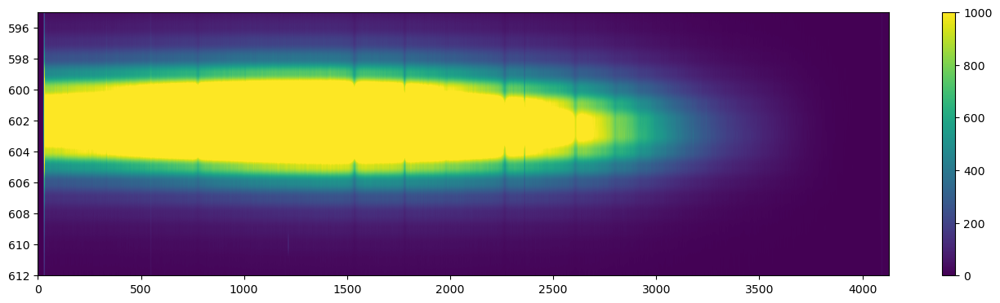

In [18]:
plot_limits_size(BD28_03, min = 0, max = 1000, ytop=595, ybottom=612)

## BD28

### Grab spectra and x

In [18]:
BD28_23_spectrum = grab_spectrum(np.flip(BD28_23, 1), top_row = 599, bottom_row = 609)
BD28_23_spectrum = BD28_23_spectrum / BD28_23_spectrum[700:3000].max()
x_BD_23 = cal_wave_4auto(BD28_23_spectrum, poly4_params_aug23)

BD28_25_spectrum = grab_spectrum(np.flip(BD28_25, 1), top_row = 600, bottom_row = 609)
BD28_25_spectrum = BD28_25_spectrum / BD28_25_spectrum[700:3000].max()

BD28_27_spectrum = grab_spectrum(np.flip(BD28_27, 1), top_row = 600, bottom_row = 612)
BD28_27_spectrum = BD28_27_spectrum / BD28_27_spectrum[700:3000].max()
x_BD_27 = cal_wave_4auto(BD28_27_spectrum, poly4_params_aug27)

BD28_03_spectrum = grab_spectrum(np.flip(BD28_03, 1), top_row = 596, bottom_row = 608)
BD28_03_spectrum = BD28_03_spectrum / BD28_03_spectrum[700:3000].max()
x_BD_03 = cal_wave_4auto(BD28_03_spectrum, poly4_params_oct03)

### plot lines in pixels

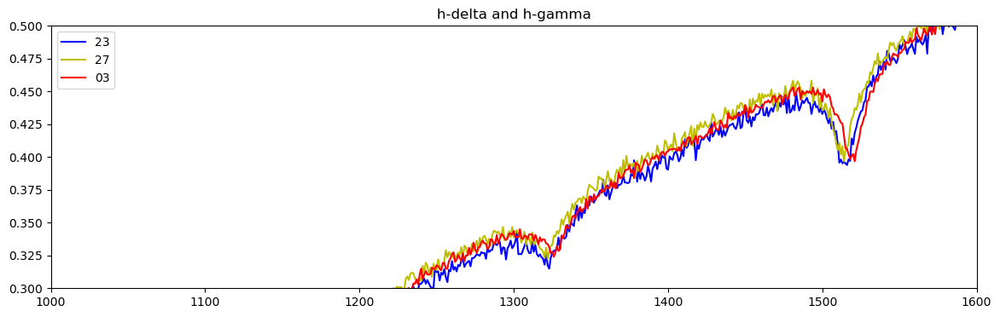

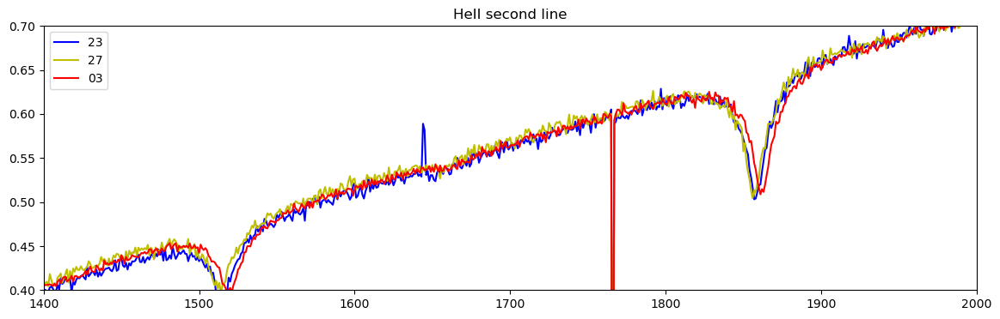

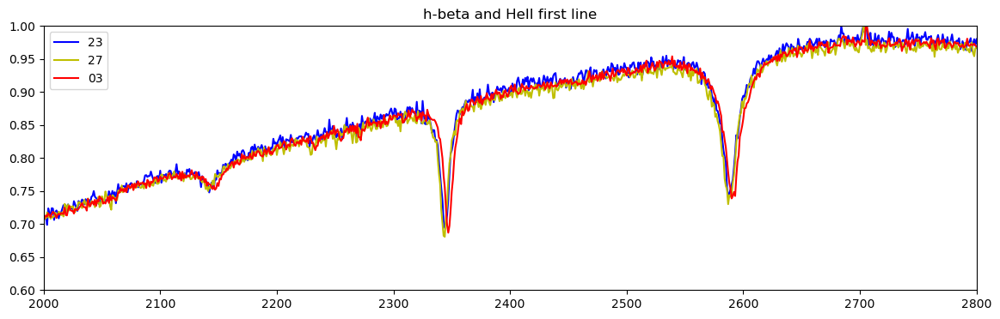

In [19]:
# Compare spectra
plt.figure(figsize=(14, 4))
plt.plot(BD28_23_spectrum, 'b', label='23')
plt.plot(BD28_27_spectrum, color = 'y', label='27')
plt.plot(BD28_03_spectrum, color = 'r', label='03')
plt.ylim(0.3, 0.5)
plt.xlim(1000, 1600)
plt.title('h-delta and h-gamma')
plt.legend()

plt.figure(figsize=(14, 4))
plt.plot(BD28_23_spectrum, 'b', label='23')
plt.plot(BD28_27_spectrum, color = 'y', label='27')
plt.plot(BD28_03_spectrum, color = 'r', label='03')
plt.ylim(0.4, 0.7)
plt.xlim(1400, 2000)
plt.title('HeII second line')
plt.legend()

plt.figure(figsize=(14, 4))
plt.plot(BD28_23_spectrum, 'b', label='23')
plt.plot(BD28_27_spectrum, color = 'y', label='27')
plt.plot(BD28_03_spectrum, color = 'r', label='03')
plt.ylim(0.6, 1)
plt.xlim(2000, 2800)
# plt.ylim(0.2, 1)
# plt.xlim(3800, 5500)
plt.title('h-beta and HeII first line')
plt.legend()

### plot lines in wavelengths

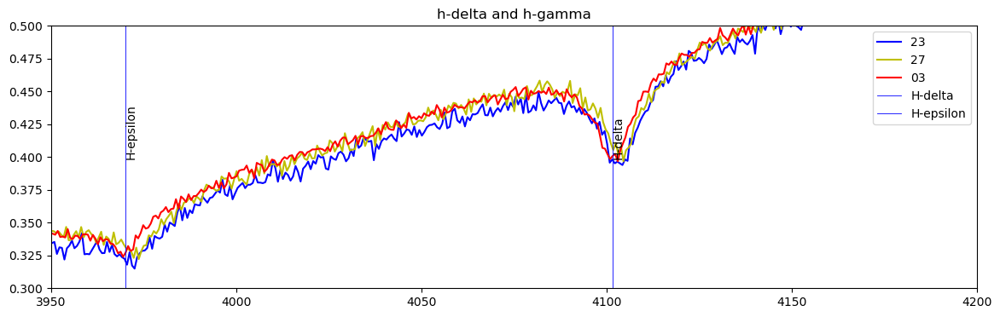

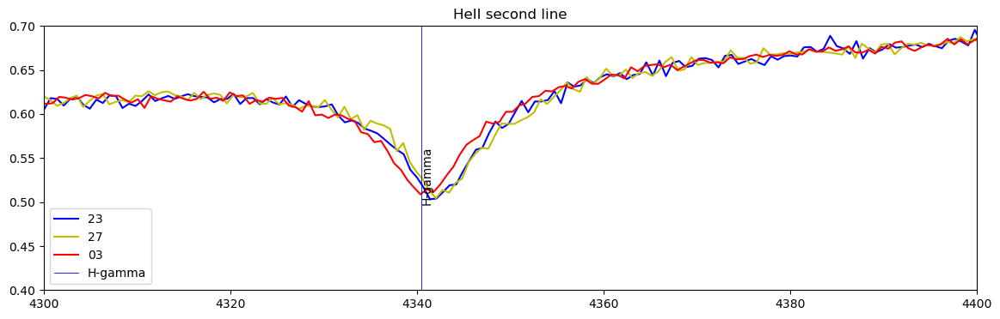

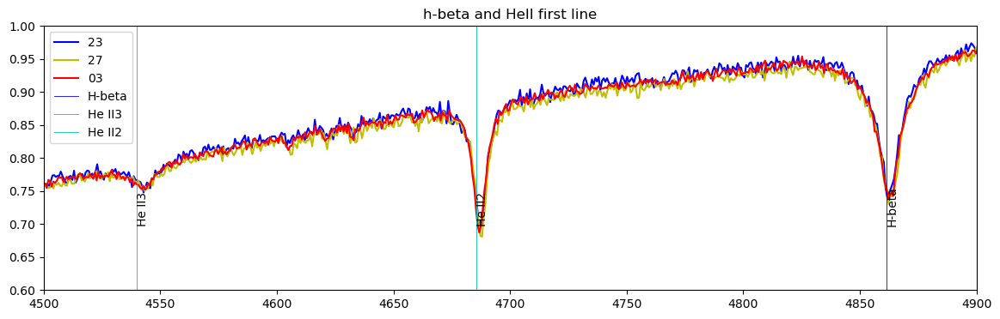

In [20]:
# Compare spectra
plt.figure(figsize=(14, 4))
plt.plot(x_BD_23, BD28_23_spectrum, 'b', label='23')
plt.plot(x_BD_27, BD28_27_spectrum, color = 'y', label='27')
plt.plot(x_BD_03, BD28_03_spectrum, color = 'r', label='03')
plt.ylim(0.3, 0.5)
plt.xlim(3950, 4200)
lines(3950, 4200, 0.4)
plt.title('h-delta and h-gamma')
plt.legend()

plt.figure(figsize=(14, 4))
plt.plot(x_BD_23, BD28_23_spectrum, 'b', label='23')
plt.plot(x_BD_27, BD28_27_spectrum, color = 'y', label='27')
plt.plot(x_BD_03, BD28_03_spectrum, color = 'r', label='03')
plt.ylim(0.4, 0.7)
plt.xlim(4300, 4400)
lines(4300, 4400, 0.5)
plt.title('HeII second line')
plt.legend()

plt.figure(figsize=(14, 4))
plt.plot(x_BD_23, BD28_23_spectrum, 'b', label='23')
plt.plot(x_BD_27, BD28_27_spectrum, color = 'y', label='27')
plt.plot(x_BD_03, BD28_03_spectrum, color = 'r', label='03')
plt.ylim(0.6, 1)
plt.xlim(4500, 4900)
lines(4500, 4900, 0.7)
# plt.ylim(0.2, 1)
# plt.xlim(3800, 5500)
plt.title('h-beta and HeII first line')
plt.legend()

### Fit BD28 absorption lines all nights with arcs

In [21]:
BD23_HeII = fit_lorentzian_quad(BD28_23_spectrum, x_BD_23, 2900, 3800, poly4_params_aug23, He_II, plot = False)
BD23_hbeta = fit_lorentzian_quad(BD28_23_spectrum, x_BD_23, 2400, 2800, poly4_params_aug23, h_beta, plot = False)
BD23_HeII2 = fit_lorentzian_quad(BD28_23_spectrum, x_BD_23, 2100, 2500, poly4_params_aug23, He_II2, plot = False)
BD23_HeII3 = fit_lorentzian_quad(BD28_23_spectrum, x_BD_23, 1900, 2300, poly4_params_aug23, He_II3, plot = False, xmin=4400, xmax=4700, ymin=0.4)
BD23_hgamma = fit_lorentzian_lin(BD28_23_spectrum, x_BD_23, 1780, 1950, poly4_params_aug23, h_gamma, plot = False)
BD23_hdelta = fit_lorentzian_quad(BD28_23_spectrum, x_BD_23, 1200, 1700, poly4_params_aug23, h_delta, plot = False)
popt_BD23, covar_BD23 = opt.curve_fit(const, np.linspace(0, 5, 6), [BD23_hdelta[0], BD23_hgamma[0], BD23_HeII3[0], BD23_HeII2[0], BD23_hbeta[0], BD23_HeII[0]],
                                            sigma = [BD23_hdelta[1], BD23_hgamma[1], BD23_HeII3[1], BD23_HeII2[1], BD23_hbeta[1], BD23_HeII[1]])

BD23_HeII_wave = fit_lorentzian_quad_wave(BD28_23_spectrum, x_BD_23, 2900, 3800, poly4_params_aug23, He_II, plot = False)
BD23_hbeta_wave = fit_lorentzian_quad_wave(BD28_23_spectrum, x_BD_23, 2400, 2800, poly4_params_aug23, h_beta, plot = False)
BD23_HeII2_wave = fit_lorentzian_quad_wave(BD28_23_spectrum, x_BD_23, 2100, 2500, poly4_params_aug23, He_II2, plot = False)
BD23_HeII3_wave = fit_lorentzian_quad_wave(BD28_23_spectrum, x_BD_23, 1900, 2300, poly4_params_aug23, He_II3, plot = False)
BD23_hgamma_wave = fit_lorentzian_lin_wave(BD28_23_spectrum, x_BD_23, 1780, 1950, poly4_params_aug23, h_gamma, plot = False)
BD23_hdelta_wave = fit_lorentzian_quad_wave(BD28_23_spectrum, x_BD_23, 1200, 1700, poly4_params_aug23, h_delta, plot = False)
wave23 = np.array([BD23_hdelta_wave, BD23_hgamma_wave, BD23_HeII3_wave, BD23_HeII2_wave, BD23_hbeta_wave, BD23_HeII_wave])

BD23_HeII_pix = fit_lorentzian_quad_pixel(BD28_23_spectrum, 2900, 3800, He_II, plot = False)
BD23_hbeta_pix = fit_lorentzian_quad_pixel(BD28_23_spectrum, 2400, 2800, h_beta, plot = False)
BD23_HeII2_pix = fit_lorentzian_quad_pixel(BD28_23_spectrum, 2100, 2500, He_II2, plot = False)
BD23_HeII3_pix = fit_lorentzian_quad_pixel(BD28_23_spectrum, 1900, 2300, He_II3, plot = False, xmin=2000, xmax=2500)
BD23_hgamma_pix = fit_lorentzian_lin_pixel(BD28_23_spectrum, 1780, 1950, h_gamma, plot = False)
BD23_hdelta_pix = fit_lorentzian_quad_pixel(BD28_23_spectrum, 1200, 1700, h_delta, plot = False)
pix23 = np.array([BD23_hdelta_pix, BD23_hgamma_pix, BD23_HeII3_pix, BD23_HeII2_pix, BD23_hbeta_pix, BD23_HeII_pix])
# plt.scatter(pix23, wave23)

In [22]:
BD25_hbeta_pix =  fit_lorentzian_quad_pixel(BD28_25_spectrum, 2400, 2800, h_beta, plot = False)
BD25_HeII_pix =   fit_lorentzian_quad_pixel(BD28_25_spectrum, 2900, 3800, He_II, plot = False)
BD25_HeII2_pix =  fit_lorentzian_quad_pixel(BD28_25_spectrum, 2100, 2500, He_II2, plot = False)
BD25_HeII3_pix =  fit_lorentzian_quad_pixel(BD28_25_spectrum, 1900, 2300, He_II2, plot = False, xmin=2000, xmax=3000)
BD25_hgamma_pix =  fit_lorentzian_lin_pixel(BD28_25_spectrum, 1780, 1950, h_gamma, plot = False)
BD25_hdelta_pix = fit_lorentzian_quad_pixel(BD28_25_spectrum, 1200, 1700, h_delta, plot = False)
pix25 = np.array([BD25_hdelta_pix, BD25_hgamma_pix, BD25_HeII3_pix, BD25_HeII2_pix, BD25_hbeta_pix, BD25_HeII_pix])

In [23]:
BD27_hbeta =  fit_lorentzian_quad(BD28_27_spectrum, x_BD_27, 2400, 2800, poly4_params_aug27, h_beta, plot = False)
BD27_HeII =   fit_lorentzian_quad(BD28_27_spectrum, x_BD_27, 2900, 3800, poly4_params_aug27, He_II, plot = False)
BD27_HeII2 =  fit_lorentzian_quad(BD28_27_spectrum, x_BD_27, 2100, 2500, poly4_params_aug27, He_II2, plot = False)
BD27_HeII3 =  fit_lorentzian_quad(BD28_27_spectrum, x_BD_27, 1900, 2300, poly4_params_aug27, He_II3, plot = False, xmin=4500, xmax=4600, ymin=0.5)
BD27_hgamma =  fit_lorentzian_lin(BD28_27_spectrum, x_BD_27, 1780, 1950, poly4_params_aug27, h_gamma, plot = False)
BD27_hdelta = fit_lorentzian_quad(BD28_27_spectrum, x_BD_27, 1200, 1700, poly4_params_aug27, h_delta, plot = False)
popt_BD27, covar_BD27 = opt.curve_fit(const, np.linspace(0, 4, 5), [BD27_hdelta[0], BD27_hgamma[0], BD27_HeII3[0], BD27_HeII2[0], BD27_hbeta[0], BD27_HeII[0]],
                                            sigma = [BD27_hdelta[1], BD27_hgamma[1], BD27_HeII3[1], BD27_HeII2[1], BD27_hbeta[1], BD27_HeII[0]])

BD27_hbeta_wave =  fit_lorentzian_quad_wave(BD28_27_spectrum, x_BD_27, 2400, 2800, poly4_params_aug27, h_beta, plot = False)
BD27_HeII_wave =   fit_lorentzian_quad_wave(BD28_27_spectrum, x_BD_27, 2900, 3800, poly4_params_aug27, He_II, plot = False)
BD27_HeII2_wave =  fit_lorentzian_quad_wave(BD28_27_spectrum, x_BD_27, 2100, 2500, poly4_params_aug27, He_II2, plot = False)
BD27_HeII3_wave =  fit_lorentzian_quad_wave(BD28_27_spectrum, x_BD_27, 1900, 2300, poly4_params_aug27, He_II3, plot = False)
BD27_hgamma_wave =  fit_lorentzian_lin_wave(BD28_27_spectrum, x_BD_27, 1780, 1950, poly4_params_aug27, h_gamma, plot = False)
BD27_hdelta_wave = fit_lorentzian_quad_wave(BD28_27_spectrum, x_BD_27, 1200, 1700, poly4_params_aug27, h_delta, plot = False)
wave27 = np.array([BD27_hdelta_wave, BD27_hgamma_wave, BD27_HeII3_wave, BD27_HeII2_wave, BD27_hbeta_wave, BD27_HeII_wave])

BD27_hbeta_pix =  fit_lorentzian_quad_pixel(BD28_27_spectrum, 2400, 2800, h_beta, plot = False)
BD27_HeII_pix =   fit_lorentzian_quad_pixel(BD28_27_spectrum, 2900, 3800, He_II, plot = False)
BD27_HeII2_pix =  fit_lorentzian_quad_pixel(BD28_27_spectrum, 2100, 2500, He_II2, plot = False)
BD27_HeII3_pix =  fit_lorentzian_quad_pixel(BD28_27_spectrum, 1900, 2300, He_II3, plot = False)
BD27_hgamma_pix =  fit_lorentzian_lin_pixel(BD28_27_spectrum, 1780, 1950, h_gamma, plot = False)
BD27_hdelta_pix = fit_lorentzian_quad_pixel(BD28_27_spectrum, 1200, 1700, h_delta, plot = False)
pix27 = np.array([BD27_hdelta_pix, BD27_hgamma_pix, BD27_HeII3_pix, BD27_HeII2_pix, BD27_hbeta_pix, BD27_HeII_pix])

In [24]:
BD03_hbeta =  fit_lorentzian_quad(BD28_03_spectrum, x_BD_03, 2400, 2800, poly4_params_oct03, h_beta, plot = False)
BD03_HeII =   fit_lorentzian_quad(BD28_03_spectrum, x_BD_03, 2900, 3800, poly4_params_oct03, He_II, plot = False)
BD03_HeII2 =  fit_lorentzian_quad(BD28_03_spectrum, x_BD_03, 2100, 2500, poly4_params_oct03, He_II2, plot = False)
BD03_HeII3 =  fit_lorentzian_quad(BD28_03_spectrum, x_BD_03, 1900, 2300, poly4_params_oct03, He_II3, plot = False)
BD03_hgamma =  fit_lorentzian_lin(BD28_03_spectrum, x_BD_03, 1780, 1950, poly4_params_oct03, h_gamma, plot = False)
BD03_hdelta = fit_lorentzian_quad(BD28_03_spectrum, x_BD_03, 1200, 1700, poly4_params_oct03, h_delta, plot = False)
popt_BD03, covar_BD03 = opt.curve_fit(const, np.linspace(0, 4, 5), [BD03_hdelta[0], BD03_hgamma[0], BD03_HeII3[0], BD03_HeII2[0], BD03_hbeta[0], BD03_HeII[0]],
                                            sigma = [BD03_hdelta[1], BD03_hgamma[1], BD03_HeII3[1], BD03_HeII2[1], BD03_hbeta[1], BD03_HeII[1]])

BD03_hbeta_wave =  fit_lorentzian_quad_wave(BD28_03_spectrum, x_BD_03, 2400, 2800, poly4_params_oct03, h_beta, plot = False)
BD03_HeII_wave =   fit_lorentzian_quad_wave(BD28_03_spectrum, x_BD_03, 2900, 3800, poly4_params_oct03, He_II, plot = False)
BD03_HeII2_wave =  fit_lorentzian_quad_wave(BD28_03_spectrum, x_BD_03, 2100, 2500, poly4_params_oct03, He_II2, plot = False)
BD03_HeII3_wave =  fit_lorentzian_quad_wave(BD28_03_spectrum, x_BD_03, 1900, 2300, poly4_params_oct03, He_II3, plot = False)
BD03_hgamma_wave =  fit_lorentzian_lin_wave(BD28_03_spectrum, x_BD_03, 1780, 1950, poly4_params_oct03, h_gamma, plot = False)
BD03_hdelta_wave = fit_lorentzian_quad_wave(BD28_03_spectrum, x_BD_03, 1200, 1700, poly4_params_oct03, h_delta, plot = False)
wave03 = np.array([BD03_hdelta_wave, BD03_hgamma_wave, BD03_HeII3_wave, BD03_HeII2_wave, BD03_hbeta_wave, BD03_HeII_wave])

BD03_hbeta_pix =  fit_lorentzian_quad_pixel(BD28_03_spectrum, 2400, 2800, h_beta, plot = False)
BD03_HeII_pix =   fit_lorentzian_quad_pixel(BD28_03_spectrum, 2900, 3800, He_II, plot = False)
BD03_HeII2_pix =  fit_lorentzian_quad_pixel(BD28_03_spectrum, 2100, 2500, He_II2, plot = False)
BD03_HeII3_pix =  fit_lorentzian_quad_pixel(BD28_03_spectrum, 1900, 2300, He_II3, plot = False)
BD03_hgamma_pix =  fit_lorentzian_lin_pixel(BD28_03_spectrum, 1780, 2000, h_gamma, plot = False, xmin=1500, xmax=2500)
BD03_hdelta_pix = fit_lorentzian_quad_pixel(BD28_03_spectrum, 1200, 1700, h_delta, plot = False)
pix03 = np.array([BD03_hdelta_pix, BD03_hgamma_pix, BD03_HeII3_pix, BD03_HeII2_pix, BD03_hbeta_pix, BD03_HeII_pix])

In [25]:
diff_wave2327 = wave23 - wave27
diff_wave2303 = wave23 - wave03
diff_wave2703 = wave27 - wave03

### Plot wavelength solution differences and absorption line pixel differences

NameError: name 'delta_lambda2327' is not defined

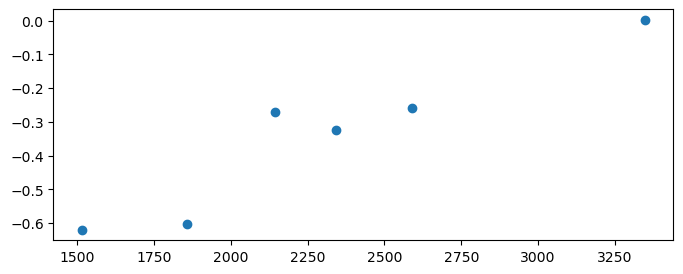

In [26]:
plt.figure(figsize = (8, 3))
plt.scatter(pix23, diff_wave2327)
plt.plot(xpix23, delta_lambda2327)
plt.xlim(1400, 4000)
plt.xlabel('Pixels')
plt.ylabel('Angstroms')
plt.title('Difference of absorption line wavelengths (23/27) vs pixel')

Text(0.5, 1.0, 'Difference of absorption line wavelengths (23/03) vs pixel')

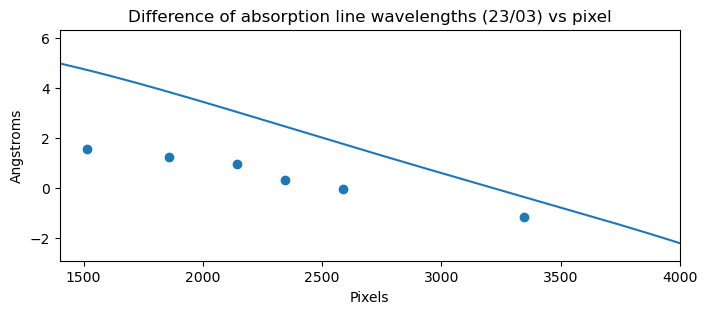

In [ ]:
plt.figure(figsize = (8, 3))
plt.scatter(pix23, diff_wave2303)
plt.plot(xpix23, delta_lambda2303)
plt.xlim(1400, 4000)
plt.xlabel('Pixels')
plt.ylabel('Angstroms')
plt.title('Difference of absorption line wavelengths (23/03) vs pixel')

Text(0.5, 1.0, 'Difference of absorption line wavelengths (27/03) vs pixel')

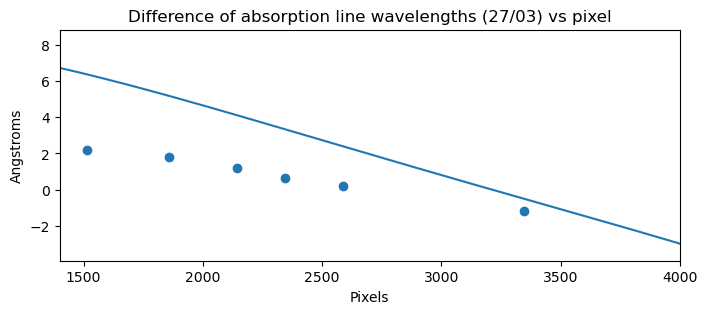

In [ ]:
plt.figure(figsize = (8, 3))
plt.scatter(pix27, diff_wave2703)
plt.plot(xpix23, delta_lambda2703)
plt.xlim(1400, 4000)
plt.xlabel('Pixels')
plt.ylabel('Angstroms')
plt.title('Difference of absorption line wavelengths (27/03) vs pixel')

In [ ]:
# plt.figure(figsize = (8, 3))
# plt.scatter(pix25, diff_wave2703)
# # plt.plot(xpix23, delta_lambda2703)
# plt.xlim(1400, 4000)
# plt.xlabel('Pixels')
# plt.ylabel('Angstroms')
# plt.title('Difference of absorption line wavelengths (27/03) vs pixel')

### Print BD28 Velocities

In [31]:
print('On Aug 23rd:')
print('H-delta:', BD23_hdelta[0], '+-', BD23_hdelta[1])
print('H-gamma:', BD23_hgamma[0], '+-', BD23_hgamma[1])
print('He II 3:', BD23_HeII3[0], '+-', BD23_HeII3[1])
print('He II 2:', BD23_HeII2[0], '+-', BD23_HeII2[1])
print('H-beta:', BD23_hbeta[0], '+-', BD23_hbeta[1])
print('He II:', BD23_HeII[0], '+-', BD23_HeII[1])
print(popt_BD23, '+-', np.sqrt(covar_BD23[0]))
print('')
print('On Aug 27th:')
print('H-delta:',   BD27_hdelta[0], '+-', BD27_hdelta[1])
print('H-gamma:',   BD27_hgamma[0], '+-', BD27_hgamma[1])
print('He II 3:', BD27_HeII3[0], '+-',  BD27_HeII3[1])
print('He II 2:', BD27_HeII2[0], '+-',  BD27_HeII2[1])
print('H-beta:',    BD27_hbeta[0], '+-',  BD27_hbeta[1])
print('He II:',     BD27_HeII[0], '+-',   BD27_HeII[1])
print(popt_BD27, '+-', np.sqrt(covar_BD27[0]))
print('')
print('On Oct 3rd:')
print('H-delta:',   BD03_hdelta[0], '+-', BD03_hdelta[1])
print('H-gamma:',   BD03_hgamma[0], '+-', BD03_hgamma[1])
print('He II 3:', BD03_HeII3[0], '+-',  BD03_HeII3[1])
print('He II 2:', BD03_HeII2[0], '+-',  BD03_HeII2[1])
print('H-beta:',    BD03_hbeta[0], '+-',  BD03_hbeta[1])
print('He II:',     BD03_HeII[0], '+-',   BD03_HeII[1])
print(popt_BD03, '+-', np.sqrt(covar_BD03[0]))

On Aug 23rd:
H-delta: 153.74604518917383 +- 18.622721377350366
H-gamma: 127.95347217239149 +- 6.805143582963479
He II 3: 242.39297846239322 +- 23.138871600679085
He II 2: 96.8965131543618 +- 4.913371744101363
H-beta: 75.32933666532399 +- 5.293311751764022
He II: 69.6681958907427 +- 9.678325111338475
[97.29859599] +- [12.84676771]

On Aug 27th:
H-delta: 199.02749501611714 +- 18.03989733641704
H-gamma: 169.57742547527704 +- 7.061966894693194
He II 3: 260.28671964839623 +- 26.003182032250205
He II 2: 117.71493741535355 +- 3.9988849356442806
H-beta: 91.32759603572015 +- 4.77590179429372
He II: 69.53004863608001 +- 8.1990260168806
[120.25937106] +- [14.31794763]

On Oct 3rd:
H-delta: 40.20848783971575 +- 15.079134730379549
H-gamma: 43.98335837633881 +- 5.174621607779234
He II 3: 180.10440139755224 +- 19.680927012630985
He II 2: 76.07903167851345 +- 3.9558109071157523
H-beta: 78.80429734037658 +- 4.065304088240076
He II: 134.12522047558994 +- 6.928417617570115
[77.58923275] +- [12.25165984]


## Use Nights with Arcs to calibrate 25th

### Aug 25 BD28 pixels

In [27]:
pix_residuals25 = pix23 - pix25
# plt.figure(figsize = (12, 3))
# plt.xlabel('Pixels 25')
# plt.ylabel('Pixels 27')
# plt.scatter(pix25, pix27, color = 'blue')
# plt.errorbar(pix25, pix27, yerr=pix_residuals25 * 1e2)
# print(pix25)
# print(pix27)

In [28]:
pix_residuals2725 = pix27 - pix25
# plt.figure(figsize = (12, 3))
# plt.xlabel('Pixels 25')
# plt.ylabel('Pixels 27')
# plt.scatter(pix25, pix23, color = 'blue')
# plt.errorbar(pix25, pix23, yerr=pix_residuals2725 * 1e2)
# print(pix25)
# print(pix23)

In [29]:
pix_residuals0325 = pix03 - pix25
# plt.figure(figsize = (12, 3))
# plt.xlabel('Pixels 25')
# plt.ylabel('Pixels 03')
# plt.scatter(pix25, pix03, color = 'blue')
# plt.errorbar(pix25, pix03, yerr=abs(pix_residuals0325) * 1e2)
# print(pix25)
# print(pix03)

### Create fits of pixels from the 25th into pixels of nights with arcs

In [30]:
params_pix_2523_lin, covar_2523_lin = opt.curve_fit(linear_model, pix25, pix23)
params_pix_2523, covar_2523 = opt.curve_fit(poly4_model, pix25, pix23)
# params_pix_2523, covar_2523 = opt.curve_fit(poly5_model, pix25, pix23)
print(params_pix_2523)

params_pix_2527_lin, covar_2527_lin = opt.curve_fit(linear_model, pix25, pix27)
params_pix_2527, covar_2527 = opt.curve_fit(poly4_model, pix25, pix27)
# params_pix_2527, covar_2527 = opt.curve_fit(poly5_model, pix25, pix27)

params_pix_2503_lin, covar_2503_lin = opt.curve_fit(linear_model, pix25, pix03)
params_pix_2503, covar_2503 = opt.curve_fit(poly4_model, pix25, pix03)
# params_pix_2503, covar_2503 = opt.curve_fit(poly5_model, pix25, pix03)

[-3.80831111e-12  3.55367165e-08 -1.20760499e-04  1.17687938e+00
 -9.20675840e+01]


#### Plots of fit residuals

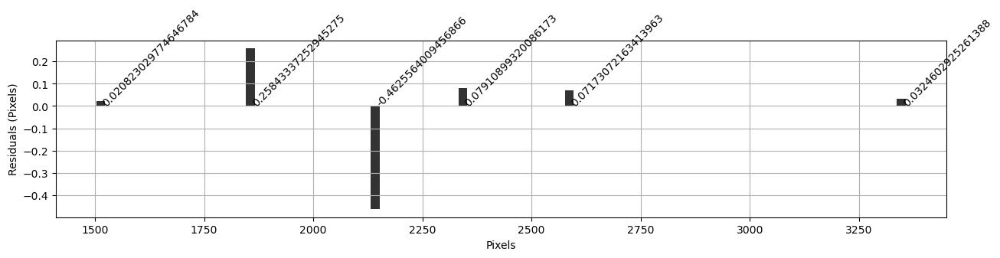

In [31]:
residuals25 = pix23 - linear_model(pix25, params_pix_2523_lin[0], params_pix_2523_lin[1])
plt.figure(figsize = (15, 3))
plt.xlabel('Wavelengths (Angstroms)')
plt.bar(pix25, residuals25, width = 20, color = 'k', alpha = 0.8)
plt.ylabel('Residuals (Pixels)')
plt.xlabel('Pixels')
plt.grid()

for i in range(len(pix25)):
  plt.text(pix25[i], 0, residuals25[i], rotation=45)

Linear Fit doesn't work very well ^

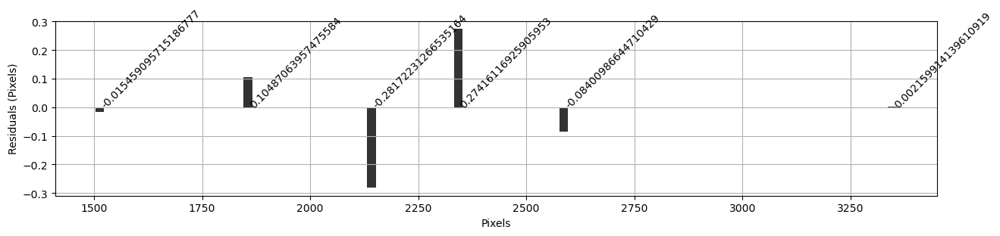

In [32]:
# residuals25 = pix23 - poly5_model(pix25, params_pix_2523[0], params_pix_2523[1], params_pix_2523[2], params_pix_2523[3], params_pix_2523[4], params_pix_2523[5])
residuals25 = pix23 - poly4_model(pix25, params_pix_2523[0], params_pix_2523[1], params_pix_2523[2], params_pix_2523[3], params_pix_2523[4])
plt.figure(figsize = (15, 3))
plt.xlabel('Wavelengths (Angstroms)')
plt.bar(pix25, residuals25, width = 20, color = 'k', alpha = 0.8)
plt.ylabel('Residuals (Pixels)')
plt.xlabel('Pixels')
plt.grid()

for i in range(len(pix25)):
  plt.text(pix25[i], 0, residuals25[i], rotation=45)

4th order polynomial works very well ^

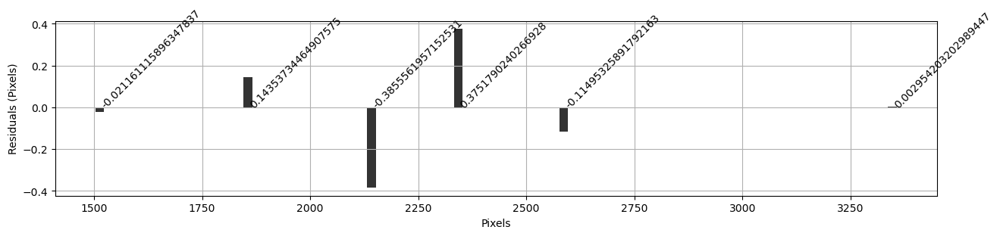

In [33]:
# residuals25 = pix27 - poly5_model(pix25, params_pix_2527[0], params_pix_2527[1], params_pix_2527[2], params_pix_2527[3], params_pix_2527[4], params_pix_2527[5])
residuals25 = pix27 - poly4_model(pix25, params_pix_2527[0], params_pix_2527[1], params_pix_2527[2], params_pix_2527[3], params_pix_2527[4])
plt.figure(figsize = (15, 3))
plt.xlabel('Wavelengths (Angstroms)')
plt.bar(pix25, residuals25, width = 20, color = 'k', alpha = 0.8)
plt.ylabel('Residuals (Pixels)')
plt.xlabel('Pixels')
plt.grid()

for i in range(len(pix25)):
  plt.text(pix25[i], 0, residuals25[i], rotation=45)

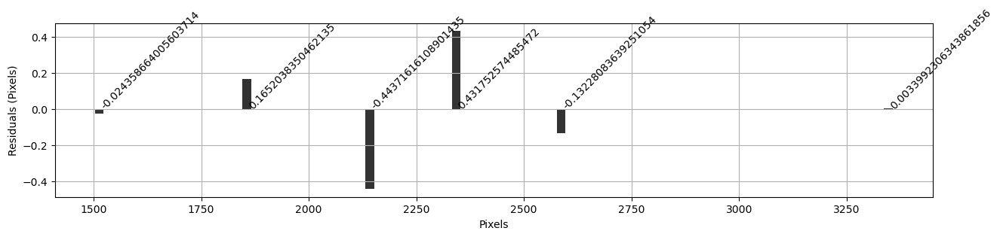

In [34]:
# residuals25 = pix03 - poly5_model(pix25, params_pix_2503[0], params_pix_2503[1], params_pix_2503[2], params_pix_2503[3], params_pix_2503[4], params_pix_2503[5])
residuals25 = pix03 - poly4_model(pix25, params_pix_2503[0], params_pix_2503[1], params_pix_2503[2], params_pix_2503[3], params_pix_2503[4])
plt.figure(figsize = (15, 3))
plt.xlabel('Wavelengths (Angstroms)')
plt.bar(pix25, residuals25, width = 20, color = 'k', alpha = 0.8)
plt.ylabel('Residuals (Pixels)')
plt.xlabel('Pixels')
plt.grid()
for i in range(len(pix25)):
  plt.text(pix25[i], 0, residuals25[i], rotation=45)

### Now start with a 25th spectrum (in pixels), convert to 23rd/27th/3rd spectrum (also in pixels), then finally use the 23rd's/27th's/3rd's arc spectrum to convert to wavelength.

In [35]:
# plt.plot(BD28_25_spectrum, color = 'b')
# plt.xlim(4120, 4150)

In [36]:
x_pixels_25to23 = cal_wave_4th_order(BD28_25_spectrum, params_pix_2523[0], params_pix_2523[1], params_pix_2523[2], params_pix_2523[3], params_pix_2523[4])
x_pixels_25to27 = cal_wave_4th_order(BD28_25_spectrum, params_pix_2527[0], params_pix_2527[1], params_pix_2527[2], params_pix_2527[3], params_pix_2527[4])
x_pixels_25to03 = cal_wave_4th_order(BD28_25_spectrum, params_pix_2503[0], params_pix_2503[1], params_pix_2503[2], params_pix_2503[3], params_pix_2503[4])
# plt.plot(x_pixels_25to23, BD28_25_spectrum, color = 'b')

In [37]:
x_waves_25_from_23 = cal_wave_4th_order_range(x_pixels_25to23, poly4_params_aug23[0],
                                                          poly4_params_aug23[1], poly4_params_aug23[2],
                                                          poly4_params_aug23[3], poly4_params_aug23[4])

x_waves_25_from_27 = cal_wave_4th_order_range(x_pixels_25to27, poly4_params_aug27[0],
                                                          poly4_params_aug27[1], poly4_params_aug27[2],
                                                          poly4_params_aug27[3], poly4_params_aug27[4])

x_waves_25_from_03 = cal_wave_4th_order_range(x_pixels_25to03, poly4_params_oct03[0],
                                                          poly4_params_oct03[1], poly4_params_oct03[2],
                                                          poly4_params_oct03[3], poly4_params_oct03[4])

#### Plots of spectra using different night calibrations

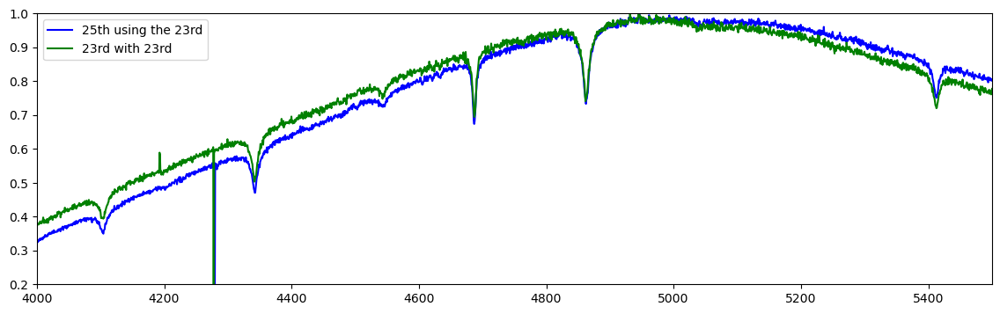

In [38]:
plt.figure(figsize=(14, 4))
plt.plot(x_waves_25_from_23, BD28_25_spectrum, 'b', label='25th using the 23rd')
plt.plot(x_BD_23, BD28_23_spectrum, color = 'g', label='23rd with 23rd')
plt.ylim(0.2, 1)
plt.xlim(4000, 5500)
plt.legend()

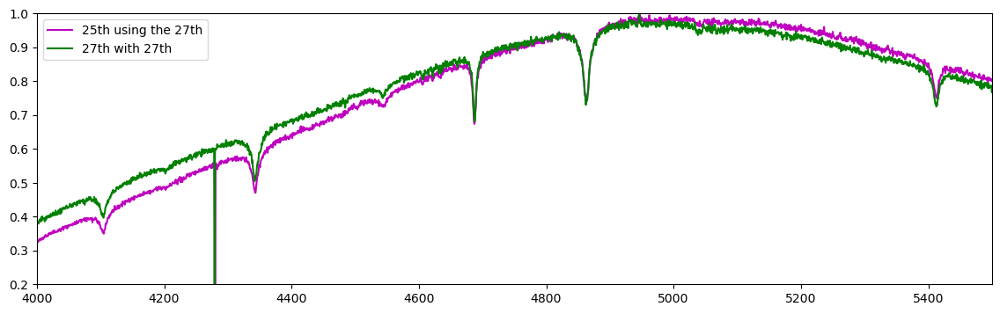

In [39]:
plt.figure(figsize=(14, 4))
plt.plot(x_waves_25_from_27, BD28_25_spectrum, 'm', label='25th using the 27th')
plt.plot(x_BD_27, BD28_27_spectrum, color = 'g', label='27th with 27th')
plt.ylim(0.2, 1)
plt.xlim(4000, 5500)
plt.legend()

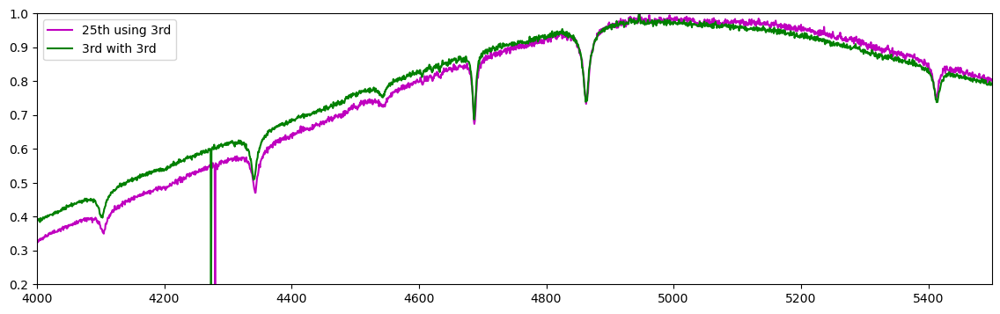

In [40]:
plt.figure(figsize=(14, 4))
plt.plot(x_waves_25_from_27, BD28_25_spectrum, 'm', label='25th using 3rd')
plt.plot(x_BD_03, BD28_03_spectrum, color = 'g', label='3rd with 3rd')
plt.ylim(0.2, 1)
plt.xlim(4000, 5500)
plt.legend()

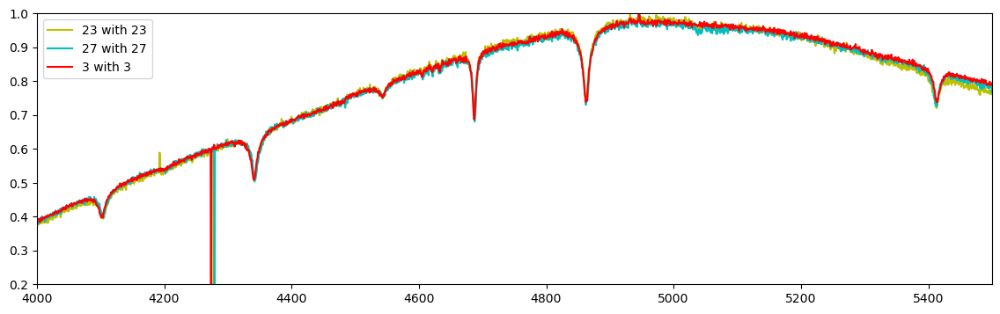

In [41]:
plt.figure(figsize=(14, 4))
plt.plot(x_BD_23, BD28_23_spectrum, color = 'y', label='23 with 23')
plt.plot(x_BD_27, BD28_27_spectrum, color = 'c', label='27 with 27')
plt.plot(x_BD_03, BD28_03_spectrum, color = 'r', label='3 with 3')
plt.ylim(0.2, 1)
plt.xlim(4000, 5500)
plt.legend()

### Finally... calculate velocities

In [42]:
BD25_23_hbeta = fit_lorentzian_quad_no_arc(BD28_25_spectrum, x_waves_25_from_23, 2400, 2800, poly4_params_aug23, params_pix_2523, h_beta, plot = False)
BD25_23_HeII = fit_lorentzian_quad_no_arc(BD28_25_spectrum, x_waves_25_from_23, 2900, 3800, poly4_params_aug23, params_pix_2523, He_II, plot = False)
BD25_23_HeII2 = fit_lorentzian_quad_no_arc(BD28_25_spectrum, x_waves_25_from_23, 2100, 2500, poly4_params_aug23, params_pix_2523, He_II2, plot = False)
BD25_23_hgamma = fit_lorentzian_lin_no_arc(BD28_25_spectrum, x_waves_25_from_23, 1780, 1950, poly4_params_aug23, params_pix_2523, h_gamma, plot = False)
BD25_23_hdelta = fit_lorentzian_quad_no_arc(BD28_25_spectrum, x_waves_25_from_23, 1200, 1700, poly4_params_aug23, params_pix_2523, h_delta, plot = False)
popt_BD25_23, covar_BD25_23 = opt.curve_fit(const, np.linspace(0, 4, 5), [BD25_23_hdelta[0], BD25_23_hgamma[0], BD25_23_HeII[0], BD25_23_HeII2[0], BD25_23_hbeta[0]],
                                            sigma = [BD25_23_hdelta[1], BD25_23_hgamma[1], BD25_23_HeII[1], BD25_23_HeII2[1], BD25_23_hbeta[1]])

BD25_27_hbeta = fit_lorentzian_quad_no_arc(BD28_25_spectrum, x_waves_25_from_27, 2400, 2800, poly4_params_aug27, params_pix_2527, h_beta, plot = False)
BD25_27_HeII = fit_lorentzian_quad_no_arc(BD28_25_spectrum, x_waves_25_from_27, 2900, 3800, poly4_params_aug27, params_pix_2527, He_II, plot = False)
BD25_27_HeII2 = fit_lorentzian_quad_no_arc(BD28_25_spectrum, x_waves_25_from_27, 2100, 2500, poly4_params_aug27, params_pix_2527, He_II2, plot = False)
BD25_27_hgamma = fit_lorentzian_lin_no_arc(BD28_25_spectrum, x_waves_25_from_27, 1780, 1950, poly4_params_aug27, params_pix_2527, h_gamma, plot = False)
BD25_27_hdelta = fit_lorentzian_quad_no_arc(BD28_25_spectrum, x_waves_25_from_27, 1200, 1700, poly4_params_aug27, params_pix_2527, h_delta, plot = False)
popt_BD25_27, covar_BD25_27 = opt.curve_fit(const, np.linspace(0, 4, 5), [BD25_27_hdelta[0], BD25_27_hgamma[0], BD25_27_HeII[0], BD25_27_HeII2[0], BD25_27_hbeta[0]],
                                            sigma = [BD25_27_hdelta[1], BD25_27_hgamma[1], BD25_27_HeII[1], BD25_27_HeII2[1], BD25_27_hbeta[1]])

BD25_03_hbeta = fit_lorentzian_quad_no_arc(BD28_25_spectrum, x_waves_25_from_03, 2400, 2800, poly4_params_oct03, params_pix_2503, h_beta, plot = False)
BD25_03_HeII = fit_lorentzian_quad_no_arc(BD28_25_spectrum, x_waves_25_from_03, 2900, 3800, poly4_params_oct03, params_pix_2503, He_II, plot = False)
BD25_03_HeII2 = fit_lorentzian_quad_no_arc(BD28_25_spectrum, x_waves_25_from_03, 2100, 2500, poly4_params_oct03, params_pix_2503, He_II2, plot = False)
BD25_03_hgamma = fit_lorentzian_lin_no_arc(BD28_25_spectrum, x_waves_25_from_03, 1780, 1950, poly4_params_oct03, params_pix_2503, h_gamma, plot = False)
BD25_03_hdelta = fit_lorentzian_quad_no_arc(BD28_25_spectrum, x_waves_25_from_03, 1300, 1700, poly4_params_oct03, params_pix_2503, h_delta, plot = False)
popt_BD25_03, covar_BD25_03 = opt.curve_fit(const, np.linspace(0, 4, 5), [BD25_03_HeII[0], BD25_03_HeII2[0], BD25_03_hbeta[0]],
                                            sigma = [BD25_03_HeII[1], BD25_03_HeII2[1], BD25_03_hbeta[1]])

In [48]:
print('H-delta:', BD25_23_hdelta[0], '+-', BD25_23_hdelta[1])
print('H-gamma:', BD25_23_hgamma[0], '+-', BD25_23_hgamma[1])
print('He II (2):', BD25_23_HeII2[0], '+-', BD25_23_HeII2[1])
print('H-beta:', BD25_23_hbeta[0], '+-', BD25_23_hbeta[1])
print('He II:', BD25_23_HeII[0], '+-', BD25_23_HeII[1])
print(popt_BD25_23, '+-', np.sqrt(covar_BD25_23[0]))
print('')
print('H-delta:', BD25_27_hdelta[0], '+-', BD25_27_hdelta[1])
print('H-gamma:', BD25_27_hgamma[0], '+-', BD25_27_hgamma[1])
print('He II (2):', BD25_27_HeII2[0], '+-', BD25_27_HeII2[1])
print('H-beta:', BD25_27_hbeta[0], '+-', BD25_27_hbeta[1])
print('He II:', BD25_27_HeII[0], '+-', BD25_27_HeII[1])
print(popt_BD25_27, '+-', np.sqrt(covar_BD25_27[0]))
print('')
print('H-delta:', BD25_03_hdelta[0], '+-', BD25_03_hdelta[1])
print('H-gamma:', BD25_03_hgamma[0], '+-', BD25_03_hgamma[1])
print('He II (2):', BD25_03_HeII2[0], '+-', BD25_03_HeII2[1])
print('H-beta:', BD25_03_hbeta[0], '+-', BD25_03_hbeta[1])
print('He II:', BD25_03_HeII[0], '+-', BD25_03_HeII[1])
print(popt_BD25_03, '+-', np.sqrt(covar_BD25_03[0]))

H-delta: 154.41925394479193 +- 16.784060163325783
H-gamma: 122.85343727034402 +- 6.35320698472197
He II (2): 84.33908545298192 +- 4.05287214027303
H-beta: 79.07661502619702 +- 4.215377045401539
He II: 69.40393677416175 +- 7.756446189119704
[88.40172051] +- [9.35733208]

H-delta: 199.81730058982416 +- 16.810743702842057
H-gamma: 162.6134254990265 +- 6.346442153981941
He II (2): 100.55530081513338 +- 4.0517346533916125
H-beta: 96.44928131154435 +- 4.217125218517223
He II: 69.12296590172012 +- 7.695149486943658
[107.51548679] +- [14.69359813]

H-delta: 45.646113183924406 +- 15.222974954718413
H-gamma: 36.48197240085691 +- 6.363621466699678
He II (2): 56.21839147030881 +- 4.064570706066695
H-beta: 84.71822202931611 +- 4.228326407982894
He II: 133.7518015496745 +- 7.739538607563363
[77.91037672] +- [17.66797102]


# BD28 Cross Corelation

### Import Drilling Spectra

In [43]:
with open(BD28dir + 'BD+28_4211_f252.txt') as f:
  BD252lines = [line.rstrip('\n') for line in f]

# file f252.txt is worse than the others, probably don't want to use it
BD252x = []
BD252y = []
for i in range(len(BD252lines)):
  BD252x.append(float(BD252lines[i][:6]))
  BD252y.append(float(BD252lines[i][10:]))

with open(BD28dir + 'BD+28_4211_f253.txt') as f:
  BD253lines = [line.rstrip('\n') for line in f]

BD253x = []
BD253y = []
for i in range(len(BD253lines)):
  BD253x.append(float(BD253lines[i][:6]))
  BD253y.append(float(BD253lines[i][10:]))

with open(BD28dir + 'BD+28_4211_f254.txt') as f:
  BD254lines = [line.rstrip('\n') for line in f]

BD254x = []
BD254y = []
for i in range(len(BD254lines)):
  BD254x.append(float(BD254lines[i][:6]))
  BD254y.append(float(BD254lines[i][10:]))

with open(BD28dir + 'BD+28_4211_f255.txt') as f:
  BD255lines = [line.rstrip('\n') for line in f]

BD255x = []
BD255y = []
for i in range(len(BD255lines)):
  BD255x.append(float(BD255lines[i][:6]))
  BD255y.append(float(BD255lines[i][10:]))

### Drilling velocities of BD28

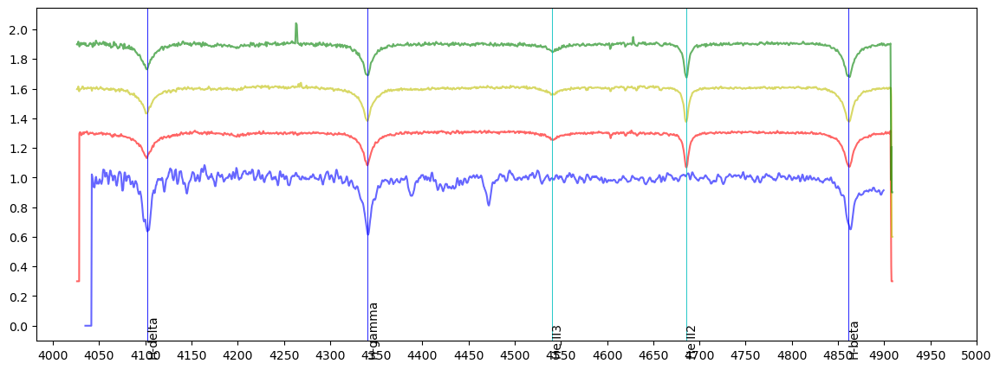

In [44]:
plt.figure(figsize = (14, 5))
plt.plot(BD252x, BD252y, color = 'b', alpha = 0.6)
plt.plot(BD253x, BD253y + np.full(len(BD253y), 0.3), color = 'r', alpha = 0.6)
plt.plot(BD254x, BD254y + np.full(len(BD254y), 0.6), color = 'y', alpha = 0.6)
plt.plot(BD255x, BD255y + np.full(len(BD255y), 0.9), color = 'g', alpha = 0.6)
plt.xticks(np.linspace(4000, 5000, 21))
plt.yticks(np.linspace(0, 2, 11))
lines(4000, 5000)

In [45]:
BD253_hbeta = fit_lorentzian_const(BD253y, BD253x, 4840.2, 4890.2, h_beta, plot = False, xmin = 4000, xmax = 5000)
BD253_heII2 = fit_lorentzian_const(BD253y, BD253x, 4670.0, 4710.2, He_II2, plot = False, xmin = 4000, xmax = 5000)
BD253_heII3 = fit_lorentzian_const(BD253y, BD253x, 4515.0, 4563.0, He_II3, plot = False, xmin = 4000, xmax = 5000)
BD253_hgamma = fit_lorentzian_const(BD253y, BD253x, 4300.2, 4400.0, h_gamma, plot = False, xmin = 4000, xmax = 5000)
BD253_hdelta = fit_lorentzian_const(BD253y, BD253x, 4080.0, 4120.0, h_delta, plot = False, xmin = 4000, xmax = 5000)

BD254_hbeta = fit_lorentzian_const(BD254y, BD254x, 4840.2, 4890.2, h_beta, plot = False, xmin = 4000, xmax = 5000)
BD254_heII2 = fit_lorentzian_const(BD254y, BD254x, 4670.0, 4710.2, He_II2, plot = False, xmin = 4000, xmax = 5000)
BD254_heII3 = fit_lorentzian_const(BD254y, BD254x, 4515.0, 4563.0, He_II3, plot = False, xmin = 4000, xmax = 5000)
BD254_hgamma = fit_lorentzian_const(BD254y, BD254x, 4300.2, 4400.0, h_gamma, plot = False, xmin = 4000, xmax = 5000)
BD254_hdelta = fit_lorentzian_const(BD254y, BD254x, 4080.0, 4120.0, h_delta, plot = False, xmin = 4000, xmax = 5000)

BD255_hbeta = fit_lorentzian_const(BD255y, BD255x, 4840.2, 4890.2, h_beta, plot = False, xmin = 4000, xmax = 5000)
BD255_heII2 = fit_lorentzian_const(BD255y, BD255x, 4670.0, 4710.2, He_II2, plot = False, xmin = 4000, xmax = 5000)
BD255_heII3 = fit_lorentzian_const(BD255y, BD255x, 4515.0, 4563.0, He_II3, plot = False, xmin = 4000, xmax = 5000)
BD255_hgamma = fit_lorentzian_const(BD255y, BD255x, 4300.2, 4400.0, h_gamma, plot = False, xmin = 4000, xmax = 5000)
BD255_hdelta = fit_lorentzian_const(BD255y, BD255x, 4080.0, 4120.0, h_delta, plot = False, xmin = 4000, xmax = 5000)

In [46]:
print("File 253:")
print('delta', BD253_hdelta)
print('gamma', BD253_hgamma)
print('heII3', BD253_heII3)
print('heII2', BD253_heII2)
print('beta', BD253_hbeta)
print('')
print("File 254:")
print('delta', BD254_hdelta)
print('gamma', BD254_hgamma)
print('heII3', BD254_heII3)
print('heII2', BD254_heII2)
print('beta', BD254_hbeta)
print('')
print("File 255:")
print('delta', BD255_hdelta)
print('gamma', BD255_hgamma)
print('heII3', BD255_heII3)
print('heII2', BD255_heII2)
print('beta', BD255_hbeta)

File 253:
delta (-33.72167834350875, 3.9470909824768334)
gamma (-13.792645219998374, 2.836638546297528)
heII3 (109.13515033832336, 9.56189091620574)
heII2 (10.094429096353613, 0.9120906140860374)
beta (27.952049703057874, 1.6449476918045876)

File 254:
delta (-26.451331951702382, 4.343603620797761)
gamma (-20.11486633317569, 2.683292495297709)
heII3 (68.44771907999917, 9.815323765419173)
heII2 (-2.261163933477205, 0.9319341440087453)
beta (10.730703876419161, 2.0409169097357958)

File 255:
delta (-40.30161042944772, 4.92307098912256)
gamma (-23.482694454776603, 3.181361564277421)
heII3 (101.58761153903058, 11.362021374188625)
heII2 (3.664686892621428, 1.2903847393987973)
beta (19.53187672828561, 1.9150488843683182)


## Cross correlating with Drilling to find wavelength shift

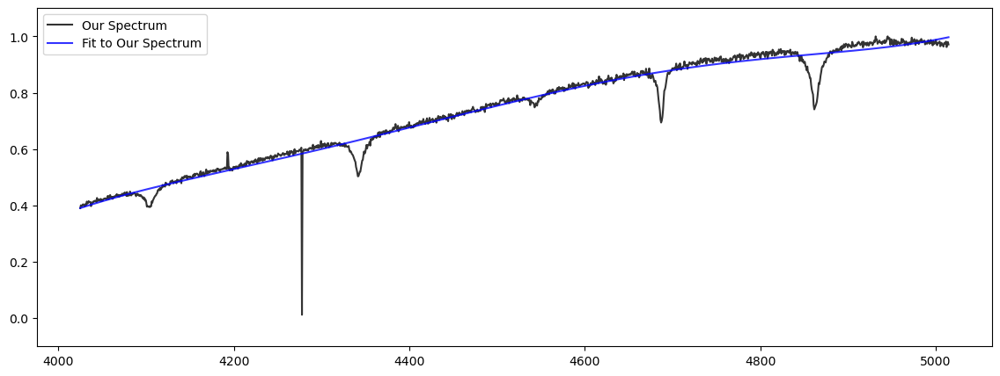

In [47]:
plt.figure(figsize = (14, 5))
x = cal_wave_4th_order(BD28_23_spectrum, poly4_params_aug23[0], poly4_params_aug23[1], poly4_params_aug23[2], poly4_params_aug23[3], poly4_params_aug23[4])
left = 1400
right = 2800
# select only on the central part of the spectra with the most prominent lines
xg = cal_wave_4th_order_range(np.linspace(left, right, right - left + 1), poly4_params_aug23[0], poly4_params_aug23[1], poly4_params_aug23[2], poly4_params_aug23[3], poly4_params_aug23[4])
l = np.where(x == xg[0])[0][0]
r = np.where(x == xg[-1])[0][0]

# a, b = opt.curve_fit(poly2_model, x[l:r], BD28_23_spectrum[left:right])
a, b = opt.curve_fit(poly5_model, x[l:r], BD28_23_spectrum[left:right])
plt.plot(x[l:r], BD28_23_spectrum[left:right], color = 'k', alpha = 0.8, label = 'Our Spectrum')
# plt.plot(x[l:r], poly2_model(x[l:r], a[0], a[1], a[2]), color = 'b', alpha = 0.8, label = 'Fit to Our Spectrum')
plt.plot(x[l:r], poly5_model(x[l:r], a[0], a[1], a[2], a[3], a[4], a[5]), color = 'b', alpha = 0.8, label = 'Fit to Our Spectrum')
plt.ylim(-0.1, 1.1)
# plt.xlim(4000, 5000)
plt.legend()

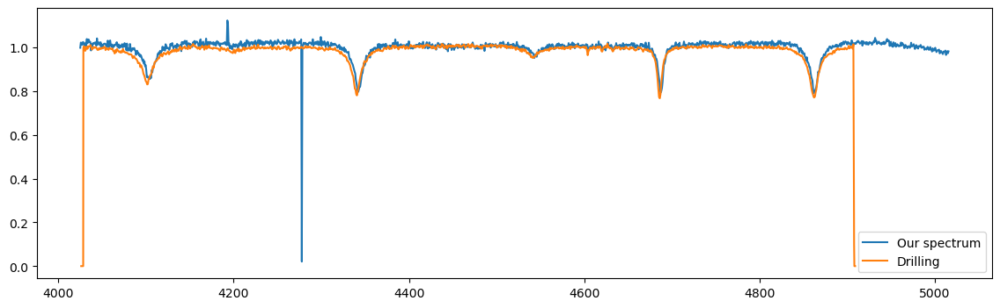

In [48]:
flatBD23 = BD28_23_spectrum[left:right+1] / poly5_model(x[l:r+1], a[0], a[1], a[2], a[3], a[4], a[5])
plt.figure(figsize = (14, 4))
plt.plot(x[l:r+1], flatBD23, label='Our spectrum')
plt.plot(BD253x, BD253y, label='Drilling')
plt.legend()

In [49]:
def calc_chi_squared(observed, observed_x, expected, expected_x, startleft, startright, step):
  chi_squared_list = []
  shift_list = []

  # loop over different redshifts
  for wave_shift in np.arange(startleft, startright, step):
    chi_squared = 0
    # shift the whole observed spectrum a certain redshift (this x is xg and a limited range)
    new_obs_x = observed_x + wave_shift

    # loop over each wavelength and sum chi squared
    for wavelength in new_obs_x:
      index_obs = np.where(new_obs_x == wavelength)[0][0]

      ## Find the nearest drilling index (expected)
      index_exp = np.argmin(np.abs(expected_x - new_obs_x[index_obs]))

      temp_chi_squared = (observed[index_obs] - expected[index_exp]) ** 2 / expected[index_exp] # (obs - exp) ** 2 / sigma_obs ** 2
      if math.isfinite(temp_chi_squared) is True:
        chi_squared += temp_chi_squared

    chi_squared_list.append(chi_squared)
    shift_list.append(wave_shift)

  return (shift_list, chi_squared_list)

In [50]:
test_chi = calc_chi_squared(flatBD23, xg, BD253y, BD253x, startleft=-3, startright=0, step=0.05)
# test_chi = calc_chi_squared(flatBD23, x[l:r+1], BD253y, BD253x, startleft=-3, startright=0, step=0.05)

/var/folders/p4/n6vrnd9x0h9c9khd9m8mfbfw0000gn/T/ipykernel_7398/73935247.py:18: RuntimeWarning: divide by zero encountered in scalar divide
  temp_chi_squared = (observed[index_obs] - expected[index_exp]) ** 2 / expected[index_exp] # (obs - exp) ** 2 / sigma_obs ** 2


Text(0, 0.5, 'Chi_squared')

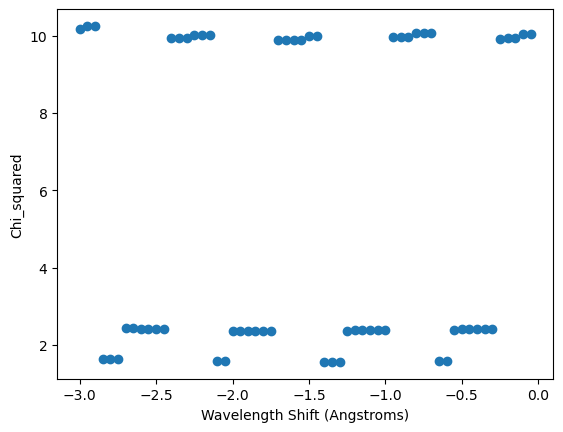

In [51]:
plt.scatter(test_chi[0], test_chi[1])
plt.xlabel('Wavelength Shift (Angstroms)')
plt.ylabel('Chi_squared')

In [52]:
min_index = np.where(test_chi[1] == min(test_chi[1]))[0][0]
print(test_chi[0][min_index])
print(calc_velo(h_beta + test_chi[0][min_index], h_beta))

-1.4000000000000057
-86.33575423185658


## Divide Drilling and Our spectrum

4128


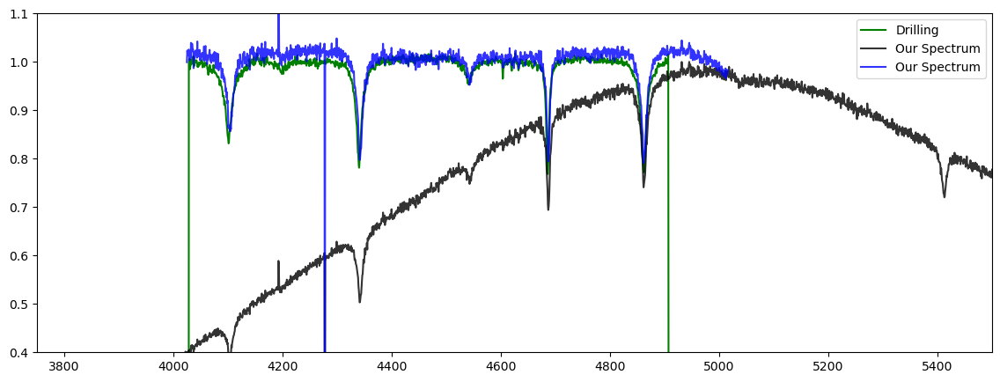

In [53]:
plt.figure(figsize = (14, 5))
plt.plot(BD253x, BD253y, color = 'g', alpha = 1, label = 'Drilling')
x = cal_wave_4th_order(BD28_23_spectrum, poly4_params_aug23[0], poly4_params_aug23[1], poly4_params_aug23[2], poly4_params_aug23[3], poly4_params_aug23[4])
print(len(x))
plt.plot(x, BD28_23_spectrum, color = 'k', alpha = 0.8, label = 'Our Spectrum')
plt.plot(xg, flatBD23, color = 'b', alpha = 0.8, label = 'Our Spectrum')
plt.ylim(0.4, 1.1)
# plt.xlim(4340, 4360)
# plt.xlim(4300, 4400)
# plt.xlim(4650, 4750)
# plt.xlim(4800, 4900)
# plt.xlim(4000, 5000)
plt.xlim(3750, 5500)
# lines(4000, 5000, labely = 0.5)
plt.legend()

(4840.0, 4900.0)

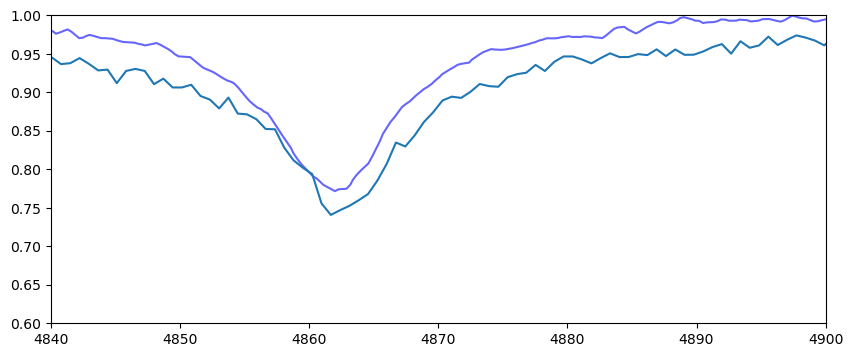

In [54]:
plt.figure(figsize = (10, 4))
plt.plot(BD253x, BD253y, color = 'b', alpha = 0.6)
plt.plot(x, BD28_23_spectrum)
plt.ylim(0.6, 1.0)
plt.xlim(4840, 4900)
# lines(4840, 4900)

(4850.0, 4880.0)

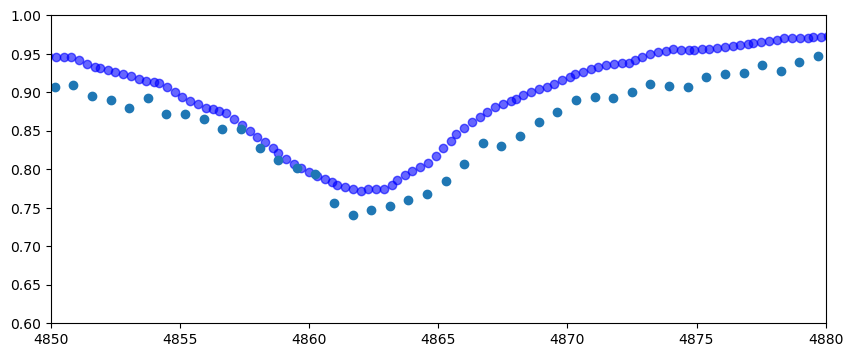

In [55]:
plt.figure(figsize = (10, 4))
plt.scatter(BD253x, BD253y, color = 'b', alpha = 0.6)
plt.scatter(x, BD28_23_spectrum)
plt.ylim(0.6, 1.0)
plt.xlim(4850, 4880)
# lines(4840, 4900)

In [56]:
plt.figure(figsize = (15, 3))
left_BD = 1402
right_BD = 2640
xx = np.linspace(x[left_BD], x[right_BD], 1000)
interp = make_interp_spline(x[left_BD: right_BD], BD28_23_spectrum[left_BD: right_BD])

# plt.plot(x, BD28_23_spectrum, alpha = 0.5)
# plt.plot(xx, interp(xx), color = 'r')
# plt.ylim(0, 1)
# print(BD253x[3040])

<Figure size 1500x300 with 0 Axes>

In [57]:
plt.figure(figsize = (15, 3))
left_253 = 0
right_253 = 3040
xx_253 = np.linspace(BD253x[left_253], BD253x[right_253], 1000)
interp_253 = make_interp_spline(BD253x[left_253: right_253], BD253y[left_253: right_253])

# plt.plot(BD253x, BD253y, alpha = 0.5)
# plt.plot(xx_253, interp_253(xx_253), color = 'r')
# plt.ylim(0.7, 1.1)

<Figure size 1500x300 with 0 Axes>

(1.0, 3.0)

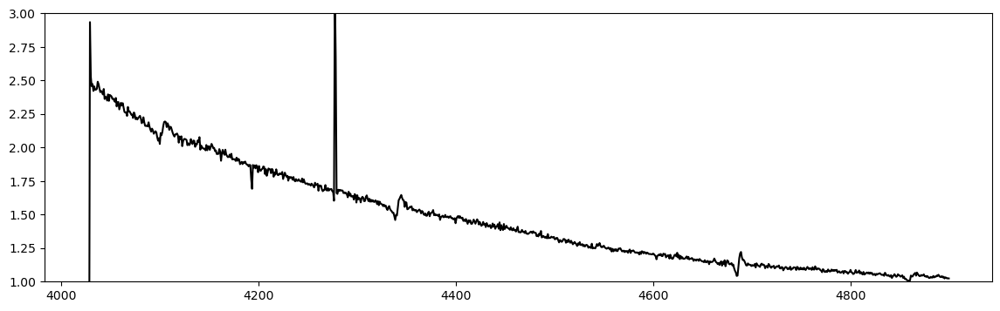

In [58]:
plt.figure(figsize = (14, 4))
plt.plot(xx, interp_253(xx_253) / interp(xx), color = 'k')
plt.ylim(1, 3)

## G191 Calibration Star

In [59]:
G191_06_spectrum = grab_spectrum(np.flip(G191_06, 1), top_row = 597, bottom_row = 605)
G191_06_spectrum = G191_06_spectrum / G191_06_spectrum[700:3000].max()
x = cal_wave_4th_order(G191_06_spectrum, poly4_params_oct06[0], poly4_params_oct06[1], poly4_params_oct06[2], poly4_params_oct06[3], poly4_params_oct06[4])
# plt.figure(figsize = (12, 4))
# plt.plot(x, G191_06_spectrum)
# plt.ylim(-0.1, 1.1)
# # plt.xlim(4600, 5000)
# lines(3500, 6000)
# # lines(5500, 5600)
# # plt.xlim(5500, 5600)
# # plt.ylim(0.6, 0.9)

In [60]:
G6_hbeta = fit_lorentzian_quad(G191_06_spectrum, x, 2400, 2800, poly4_params_oct06, h_beta, plot = False, xmin = 4500, xmax = 5500)
G6_hgamma = fit_lorentzian_lin(G191_06_spectrum, x, 1780, 1950, poly4_params_oct06, h_gamma, plot = False)
G6_hdelta = fit_lorentzian_lin(G191_06_spectrum, x, 1300, 1650, poly4_params_oct06, h_delta, plot = False)
# G6_hdelta = fit_lorentzian_lin(G191_06_spectrum, x, 1200, 1700, poly4_params_oct06, h_delta, plot = False)
G6_heps = fit_lorentzian_lin(G191_06_spectrum, x, 1200, 1400, poly4_params_oct06, h_epsilon, plot = False)
# popt_G6, covar_G6 = opt.curve_fit(const, np.linspace(0, 3, 4), [G6_heps[0], G6_hdelta[0], G6_hgamma[0], G6_hbeta[0]],
#                                             sigma = [G6_heps[1], G6_hdelta[1], G6_hgamma[1], G6_hbeta[1]])

In [61]:
print('H-epsilon:', G6_heps[0], '+-', G6_heps[1])
print('H-delta:', G6_hdelta[0], '+-', G6_hdelta[1])
print('H-gamma:', G6_hgamma[0], '+-', G6_hgamma[1])
print('H-beta:', G6_hbeta[0], '+-', G6_hbeta[1])
# print(popt_BD03, '+-', np.sqrt(covar_BD03[0]))

H-epsilon: 363.280295663975 +- 49.950078865036815
H-delta: 305.3571550544616 +- 39.615091565459764
H-gamma: 162.72919453639065 +- 17.332415708225376
H-beta: 107.96351166493693 +- 12.263299522181967


In [62]:
green_params06_G6, green_covar06_G6 = opt.curve_fit(Lorentzian_lin, np.arange(5550, 5600), G191_06_spectrum[3550: 3600], p0 = [0, 2, 5577, 0, 1])
# A, sigma, center, c, d
print(green_params06_G6, np.sqrt(green_covar06_G6[2][2]))
# green06_G6_wave = green_params06_G6[2]

[-2.56548844e-01  2.60282841e+00  5.57920346e+03 -5.75214057e-04
  3.85959780e+00] 0.17592164754643308


In [63]:
print(calc_velo_err_lmfit(green_params06_G6[2] - O_I, O_I))
print(calc_velo(green_params06_G6[2], O_I))

100.23458506548644
100.23458506552406


(0.6, 1.0)

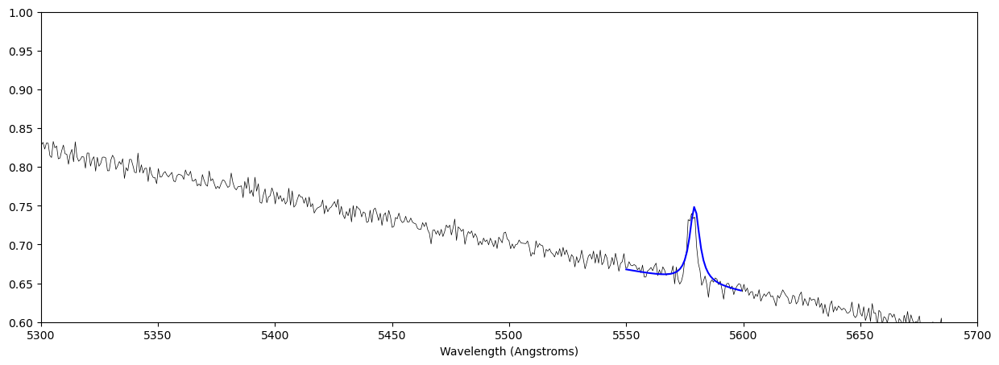

In [70]:
plt.figure(figsize = (15, 5))
# plt.plot(spectrum2, linewidth = 0.5, color = 'k')
plt.plot(x, G191_06_spectrum, linewidth = 0.5, color = 'k')
# plt.plot(np.arange(3550, 3600), Lorentzian_lin(np.arange(3550, 3600), green_params23_2[0], green_params23_2[1], green_params23_2[2], green_params23_2[3], green_params23_2[4]), color = 'b')
plt.plot(np.arange(5550, 5600), Lorentzian_lin(np.arange(5550, 5600), green_params06_G6[0], green_params06_G6[1], green_params06_G6[2], green_params06_G6[3], green_params06_G6[4]), color = 'b')
plt.xlabel('Wavelength (Angstroms)')
plt.ylim(-0.1, 1.2)
# plt.xlim(3500, 3800)
# lines(5300, 5700)
plt.xlim(5300, 5700)
plt.ylim(0.6, 1)

# Flats (August)

"We took twilight sky flats, with the slit and disperser in, in order to get an image of how the slit and disperser illuminate the chip. However, the twilight flats have sky features, which make them unsuitable for using for flat fielding. So, we also took instrument ("MIS") calibration flats, but the illumination pattern is not ideal, so we'll have to use the sky flats or the dome flats to correct. I walk through this process in this step."

## August Twilight Flats

In [64]:
# # twilight_flat_aug23 = fits_overscan_normalize_median(datadir, '23', ['b.0066', 'b.0067', 'b.0068'])
# # twilight_flat_aug25 = fits_overscan_normalize_median(datadir, '25', ['b.0073', 'b.0074', 'b.0075'])
# twilight_flat_aug23 = fits_overscan_median(datadir, '23', ['b.0066', 'b.0067', 'b.0068'])
# twilight_flat_aug25 = fits_overscan_median(datadir, '25', ['b.0073', 'b.0074', 'b.0075'])

In [65]:
# basic_plot(twilight_flat_aug23, min = 0, max = 10000)
# basic_plot(twilight_flat_aug25, min = 0, max = 10000)

## August MIS (Instrument) Flats

In [66]:
# # MIS_flat_aug23 = fits_overscan_normalize_median(datadir, '23', ['b.0005', 'b.0006', 'b.0007', 'b.0008', 'b.0009', 'b.0010',
# #                                                         'b.0011', 'b.0012', 'b.0013', 'b.0014'])
# # MIS_flat_aug26 = fits_overscan_normalize_median(datadir, '26', ['b.0167', 'b.0168', 'b.0169', 'b.0170', 'b.0171', 'b.0172', 'b.0173',
# #                                                         'b.0174', 'b.0175', 'b.0176', 'b.0177', 'b.0178', 'b.0179', 'b.0180', 'b.0181',
# #                                                         'b.0182', 'b.0183', 'b.0184', 'b.0185', 'b.0186'])
# MIS_flat_aug23 = fits_overscan_median(datadir, '23', ['b.0005', 'b.0006', 'b.0007', 'b.0008', 'b.0009', 'b.0010',
#                                                         'b.0011', 'b.0012', 'b.0013', 'b.0014'])
# MIS_flat_aug26 = fits_overscan_median(datadir, '26', ['b.0167', 'b.0168', 'b.0169', 'b.0170', 'b.0171', 'b.0172', 'b.0173',
#                                                         'b.0174', 'b.0175', 'b.0176', 'b.0177', 'b.0178', 'b.0179', 'b.0180', 'b.0181',
#                                                         'b.0182', 'b.0183', 'b.0184', 'b.0185', 'b.0186'])

In [67]:
# basic_plot(MIS_flat_aug23, min = 0, max = 8000)
# basic_plot(MIS_flat_aug26, min = 0, max = 8000)
# # basic_plot(MIS_flat_aug27, min = 0, max = 15)

## Combine August Flats

In [68]:
# MIS_block_avg_aug23 = np.average(MIS_flat_aug23, axis = 0)
# twilight_block_avg_aug23 = np.average(twilight_flat_aug23, axis = 0)

# plt.figure(figsize=(15,4))
# plt.plot(MIS_block_avg_aug23, 'b', label='Instrument')
# plt.plot(twilight_block_avg_aug23, 'purple', label='Twilight')
# plt.legend()

# twilight_quotient_aug23 = twilight_block_avg_aug23 / MIS_block_avg_aug23

# plt.figure(figsize = (15, 4))
# plt.plot(twilight_quotient_aug23, color = 'k')

In [69]:
# plt.figure(figsize = (15, 4))
# plt.plot(twilight_quotient_aug23, color = 'k')
# x = cal_wave_4th_order(twilight_quotient_aug23, poly4_params_aug23[0], poly4_params_aug23[1], poly4_params_aug23[2], poly4_params_aug23[3], poly4_params_aug23[4])
# plt.figure(figsize = (15, 4))
# plt.plot(x, twilight_quotient_aug23, color = 'k')
# plt.xlim(4000, 5500)

In [70]:
# x = np.arange(len(twilight_quotient_aug23))
# params, covar = opt.curve_fit(poly4_model, x, twilight_quotient_aug23)
# plt.plot(twilight_quotient_aug23)
# plt.plot(x, poly4_model(x, params[0], params[1], params[2], params[3], params[4]))

In [71]:
# x = np.arange(len(twilight_quotient_aug23))
# params_gauss, covar = opt.curve_fit(gaussian_model, x, twilight_quotient_aug23, p0 = [12.69, 633, 2211, 1])
# plt.plot(twilight_quotient_aug23, alpha = 0.5, color='k')
# plt.plot(x, gaussian_model(x, params_gauss[0], params_gauss[1], params_gauss[2], params_gauss[3]), alpha = 1, color='b')

In [72]:
# x = np.arange(len(twilight_quotient_aug23))
# xx = np.linspace(0, len(twilight_quotient_aug23), 13)
# plt.plot(twilight_quotient_aug23, alpha = 0.4)

# from scipy.interpolate import make_interp_spline
# interp = make_interp_spline(x, twilight_quotient_aug23)
# plt.plot(xx, interp(xx))

In [73]:
# plt.scatter(xx, interp(xx))
# interp2 = make_interp_spline(xx, interp(xx))
# plt.plot(x, interp2(x))

In [74]:
# from scipy.interpolate import make_lsq_spline, BSpline, splrep

# # spl = make_lsq_spline(x, twilight_quotient_aug23, t, k)

# xx = np.linspace(0, len(twilight_quotient_aug23), 4128)#4128, 25
# tck = splrep(x, twilight_quotient_aug23, s=0)
# tck_4 = splrep(x, twilight_quotient_aug23, s=100)
# tck_3 = splrep(x, twilight_quotient_aug23, s=2000)
# tck_s = splrep(x, twilight_quotient_aug23, s=len(x))

# # x = np.arange(len(twilight_quotient_aug23))
# # xx = np.linspace(0, len(twilight_quotient_aug23), 25)
# plt.plot(twilight_quotient_aug23, alpha = 0.4)
# # plt.plot(xx, BSpline(*tck_4)(xx), color = 'k')
# # plt.plot(xx, BSpline(*tck)(xx), color = 'g')
# # plt.plot(xx, BSpline(*tck_s)(xx), color = 'r')
# plt.plot(xx, BSpline(*tck_3)(xx), color = 'b', alpha = 1)

In [75]:
# smooth_quotient_aug23 = np.vstack([gaussian_model(x, params_gauss[0], params_gauss[1],
#                                                   params_gauss[2], params_gauss[3],
#                                                   )] * len(twilight_flat_aug23[:, 0]))
# # print(smooth_quotient_aug23)
# basic_plot(smooth_quotient_aug23, min = 0, max = 10)

In [76]:
# smooth_quotient_aug23_spline = np.vstack([interp2(x)] * len(twilight_flat_aug23[:, 0]))
# # print(smooth_quotient_aug23)
# basic_plot(smooth_quotient_aug23_spline, min = 0, max = 10)

In [77]:
# flat_balanced_aug23 = MIS_flat_aug23 * smooth_quotient_aug23
# # basic_plot(flat_balanced_aug23, min = 0, max = 10000)
# flat_balanced_aug23 = flat_balanced_aug23 / (np.median(flat_balanced_aug23))
# basic_plot(flat_balanced_aug23, min = 0, max = 2)

In [78]:
# flat_balanced_aug23 = MIS_flat_aug23 * smooth_quotient_aug23_spline
# flat_balanced_aug23 = flat_balanced_aug23 / (np.median(flat_balanced_aug23))
# basic_plot(flat_balanced_aug23, min = 0, max = 2)

In [79]:
# MIS_block_avg_aug26 = np.average(MIS_flat_aug26, axis = 0)
# twilight_block_avg_aug25 = np.average(twilight_flat_aug25, axis = 0)

# twilight_quotient_aug25 = twilight_block_avg_aug25 / MIS_block_avg_aug26

In [80]:
# x = np.arange(len(twilight_quotient_aug25))
# params_gauss, covar = opt.curve_fit(gaussian_model, x, twilight_quotient_aug25, p0 = [12.69, 633, 2211, 1])
# plt.plot(twilight_quotient_aug25, alpha = 0.5, color='k')
# plt.plot(x, gaussian_model(x, params_gauss[0], params_gauss[1], params_gauss[2], params_gauss[3]), alpha = 1, color='b')

In [81]:
# smooth_quotient_aug25 = np.vstack([gaussian_model(x, params_gauss[0], params_gauss[1],
#                                                   params_gauss[2], params_gauss[3],
#                                                   )] * len(twilight_flat_aug25[:, 0]))
# # basic_plot(smooth_quotient_aug25, min = 0, max = 10)
# flat_balanced_aug25 = MIS_flat_aug26 * smooth_quotient_aug25
# flat_balanced_aug25 = flat_balanced_aug25 / (np.median(flat_balanced_aug25))
# # basic_plot(flat_balanced_aug23, min = 0, max = 2)

In [82]:
# # x = np.arange(len(twilight_quotient_aug23))
# xx = np.linspace(0, len(twilight_quotient_aug25), 25)
# plt.plot(twilight_quotient_aug25, alpha = 0.4)

# from scipy.interpolate import make_interp_spline
# interp = make_interp_spline(x, twilight_quotient_aug25)
# plt.plot(xx, interp(xx))

In [83]:
# plt.scatter(xx, interp(xx))
# interp2 = make_interp_spline(xx, interp(xx))
# plt.plot(x, interp2(x))

In [91]:
# smooth_quotient_aug25 = np.vstack([interp2(x)] * len(twilight_flat_aug25[:, 0]))
# # basic_plot(smooth_quotient_aug25, min = 0, max = 10)
# flat_balanced_aug25 = MIS_flat_aug26 * smooth_quotient_aug25
# flat_balanced_aug25 = flat_balanced_aug25 / (np.median(flat_balanced_aug25))
# # basic_plot(flat_balanced_aug23, min = 0, max = 2)

# October Flats

## October Twilight Flats

In [84]:
# # twilight_flat_oct03 = fits_overscan_normalize_median(octdir, '03', ['b.0195', 'b.0196', 'b.0197'], 2310)
# # twilight_flat_oct06 = fits_overscan_normalize_median(octdir, '06', ['b.0523', 'b.0524', 'b.0525'], 2310)
# twilight_flat_oct03 = fits_overscan_median(octdir, '03', ['b.0195', 'b.0196', 'b.0197'], 2310)
# twilight_flat_oct06 = fits_overscan_median(octdir, '06', ['b.0523', 'b.0524', 'b.0525'], 2310)

In [85]:
# basic_plot(twilight_flat_oct03, min = 0, max = 3)
# basic_plot(twilight_flat_oct06, min = 0, max = 3)

## October MIS (Instrument) Flats

In [86]:
# # MIS_flat_oct03 = fits_overscan_normalize_median(octdir, '03', ['b.0266', 'b.0267', 'b.0268', 'b.0269', 'b.0270', 'b.0271',
# #                                                         'b.0272', 'b.0273'], 2310)
# # MIS_flat_oct06 = fits_overscan_normalize_median(octdir, '06', ['b.0505', 'b.0506', 'b.0507', 'b.0508', 'b.0509', 'b.0510',
# #                                                         'b.0511', 'b.0512', 'b.0513'], 2310)

# MIS_flat_oct03 = fits_overscan_median(octdir, '03', ['b.0266', 'b.0267', 'b.0268', 'b.0269', 'b.0270', 'b.0271',
#                                                         'b.0272', 'b.0273'], 2310)
# MIS_flat_oct06 = fits_overscan_median(octdir, '06', ['b.0505', 'b.0506', 'b.0507', 'b.0508', 'b.0509', 'b.0510',
#                                                         'b.0511', 'b.0512', 'b.0513'], 2310)

In [87]:
# basic_plot(MIS_flat_oct03, min = 0, max = 15)
# basic_plot(MIS_flat_oct06, min = 0, max = 15)

## Combine October Flats

In [88]:
# MIS_block_avg_oct03 = np.average(MIS_flat_oct03, axis = 0)
# twilight_block_avg_oct03 = np.average(twilight_flat_oct03, axis = 0)

# twilight_quotient_oct03 = twilight_block_avg_oct03 / MIS_block_avg_oct03
# x = np.arange(len(twilight_quotient_oct03))

In [89]:
# x = np.arange(len(twilight_quotient_oct03))
# params_gauss, covar = opt.curve_fit(gaussian_model, x, twilight_quotient_oct03, p0 = [12.69, 633, 2211, 1])
# plt.plot(twilight_quotient_oct03, alpha = 0.4)
# plt.plot(x, gaussian_model(x, params_gauss[0], params_gauss[1], params_gauss[2], params_gauss[3]), alpha = 1)

In [90]:
# smooth_quotient_oct03 = np.vstack([gaussian_model(x, params_gauss[0], params_gauss[1],
#                                                   params_gauss[2], params_gauss[3],
#                                                   )] * len(twilight_flat_oct03[:, 0]))
# # print(smooth_quotient_aug23)
# basic_plot(smooth_quotient_oct03, min = 0, max = 10)

# flat_balanced_oct03 = MIS_flat_oct03 * smooth_quotient_oct03
# flat_balanced_oct03 = flat_balanced_oct03 / (np.median(flat_balanced_oct03))
# basic_plot(flat_balanced_oct03, min = 0, max = 2)

## Attempting Flat fielding on GCC2 Aug23

In [91]:
# grism2 = min_zapping(datadir, 23, ['b.0043', 'b.0044'])
# plot_limits_size(grism2, min = 5, max = 100, ytop = 602, ybottom = 615, figsizeheight=3)

# spectrum2 = grab_spectrum(np.flip(grism2, 1), 607, 611)
# spectrum2 = spectrum2 / spectrum2[700:3000].max()
# x = cal_wave_4th_order(spectrum2, poly4_params_aug23[0], poly4_params_aug23[1], poly4_params_aug23[2], poly4_params_aug23[3], poly4_params_aug23[4])
# plt.figure(figsize = (15, 5))
# plt.plot(x, spectrum2, linewidth = 0.5, color = 'k')
# plt.xlabel('Wavelength (Angstroms)')
# plt.ylim(-0.1, 1.2)
# lines(3700, 5500)
# # plt.xlim(3700, 5500)

In [100]:
# grism2_ff = grism2 / flat_balanced_aug23
# spectrum2_ff = grab_spectrum(np.flip(grism2_ff, 1), 607, 611)
# spectrum2_ff = spectrum2_ff / spectrum2_ff[700:3000].max()
# x = cal_wave_4th_order(spectrum2_ff, poly4_params_aug23[0], poly4_params_aug23[1], poly4_params_aug23[2], poly4_params_aug23[3], poly4_params_aug23[4])
# plt.figure(figsize = (15, 5))
# plt.plot(x, spectrum2_ff, linewidth = 0.5, color = 'k')
# plt.xlabel('Wavelength (Angstroms)')
# # plt.ylim(0.1, 0.25)
# # lines(4800, 5000, labely=0.1)
# # plt.xlim(4800, 5000)
# plt.ylim(0.0, 0.35)
# lines(3900, 4100, labely=0.1)
# plt.xlim(3900, 4100)
# # plt.ylim(0.0, 0.6)
# # lines(3700, 5500, labely=0.1)
# # plt.xlim(3700, 5500)

# GCC1

## With 23rd

In [93]:
# light1 = fit_to_array(datadir, 23, 'b.0033')
# light1 = fit_to_array(datadir, 25, 'b.0117')
# overscan1 = subtract_overscan(light1)
# plot_limits_size(overscan1, min = 70, max = 130, marker = True, markerx = 2050, markery = 585, markeralpha = 0.5, markersize = 7)

In [94]:
grism1_23 = zap_two(datadir, 23, ['b.0035', 'b.0036'], max_diff=50)

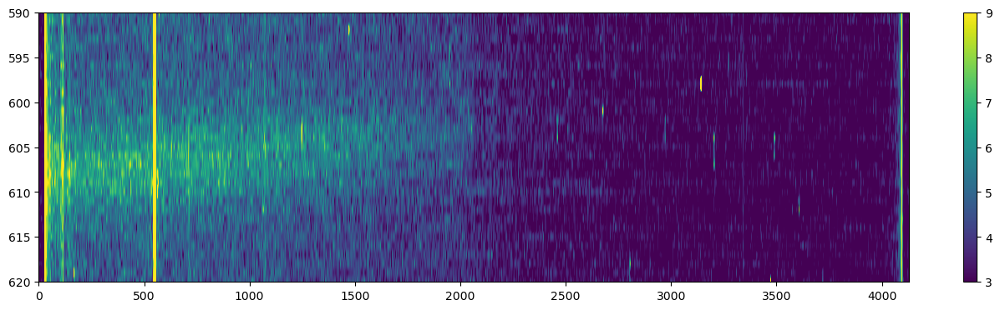

In [95]:
plot_limits_size(grism1_23, min = 3, max = 9, ytop = 590, ybottom = 620)

(0.1, 1.1)

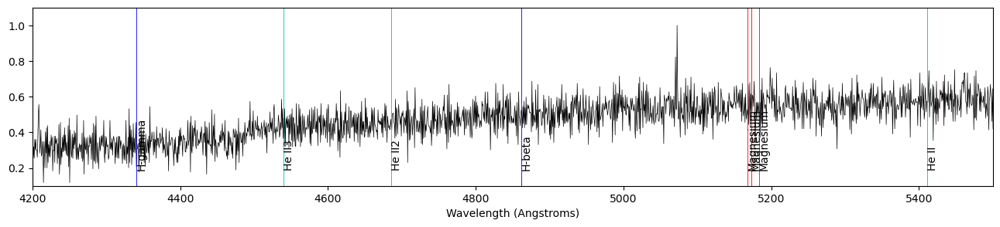

In [96]:
spectrum1_23 = grab_spectrum(np.flip(grism1_23, 1), 601, 609)
spectrum1_23 = spectrum1_23 / spectrum1_23[700:3000].max()
x = cal_wave_4auto(spectrum1_23, poly4_params_aug23)

plt.figure(figsize = (16, 3))
plt.plot(x, spectrum1_23, linewidth = 0.5, color = 'k')
plt.xlabel('Wavelength (Angstroms)')
lines(4200, 5500, 0.2)
plt.xlim(4200, 5500)
plt.ylim(0.1, 1.1)
# plt.legend()

(0.1, 1.1)

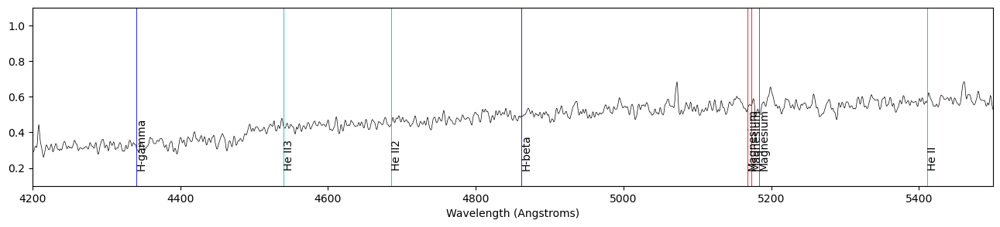

In [97]:
spectrum1_23_smoothed = gauss_smooth(spectrum1_23, 1.5)
x = cal_wave_4auto(spectrum1_23_smoothed, poly4_params_aug23)

plt.figure(figsize = (16, 3))
plt.plot(x, spectrum1_23_smoothed, linewidth = 0.5, color = 'k')
plt.xlabel('Wavelength (Angstroms)')
# lines(3700, 4200, 0.2)
# plt.xlim(3700, 4200)
# plt.ylim(0.0, 0.7)

lines(4200, 5500, 0.2)
plt.xlim(4200, 5500)
plt.ylim(0.1, 1.1)

H-beta: -411.1337716619587 +- 52.71508673219303
Mag: -106.96663443314316 +- 55.949482951909786
[-268.09571086] +- [151.8143296]


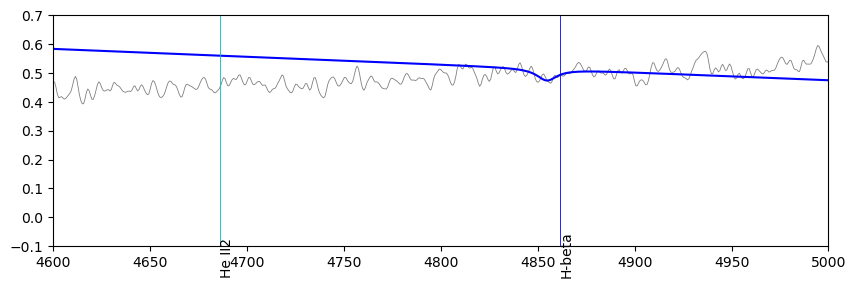

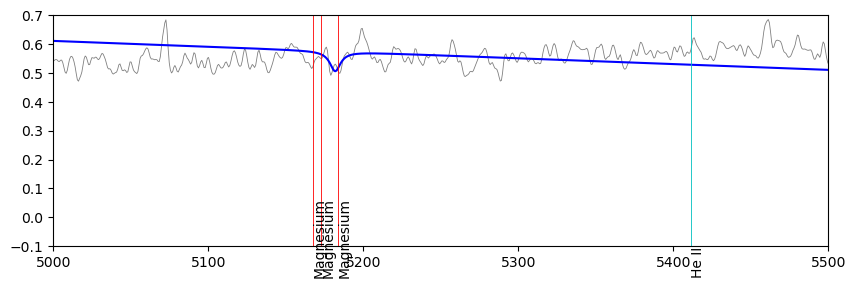

In [98]:
# aug1_heps = fit_lorentzian_lin(spectrum1_23_smoothed, x, 1300, 1400, poly4_params_aug23, h_epsilon, xmin = 3700, xmax = 4200, ymax = 0.4, plot = True)
# aug1_hdelta = fit_lorentzian_lin(spectrum1_23_smoothed, x, 1480, 1540, poly4_params_aug23, h_delta, xmin = 3950, xmax = 4350, ymax = 0.4, plot = True)
# aug1_hgamma = fit_lorentzian_lin(spectrum1_23_smoothed, x, 1840, 1880, poly4_params_aug23, h_gamma, xmin = 4150, xmax = 4550, ymax = 0.6, plot = True)
aug1_hbeta = fit_lorentzian_lin(spectrum1_23_smoothed, x, 2550, 2630, poly4_params_aug23, h_beta, xmin = 4600, xmax = 5000, ymax = 0.7, plot = True)
aug1_mag = fit_lorentzian_lin(spectrum1_23_smoothed, x, 3010, 3090, poly4_params_aug23, magnesium, xmin = 5000, xmax = 5500, ymax = 0.7, plot = True)


# print('H-epsilon:', aug2_heps[0], '+-', aug2_heps[1])
# print('H-delta:', aug2_hdelta[0], '+-', aug2_hdelta[1])
# print('H-gamma:', aug2_hgamma[0], '+-', aug2_hgamma[1])
print('H-beta:', aug1_hbeta[0], '+-', aug1_hbeta[1])
print('Mag:', aug1_mag[0], '+-', aug1_mag[1])

popt, covar = opt.curve_fit(const, np.linspace(0, 1, 2), [aug1_hbeta[0], aug1_mag[0]], sigma = [aug1_hbeta[1], aug1_mag[1]])
print(popt, '+-', np.sqrt(covar[0]))

## Using 25th spectrum

### Bias, zap, scale pixels

In [99]:
grism1_25 = zap_two(datadir, 25, ['b.0119', 'b.0120'], max_diff=50)

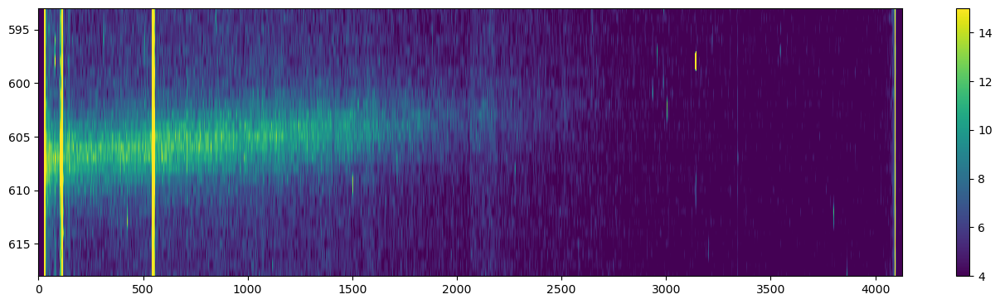

In [100]:
plot_limits_size(grism1_25, min = 4, max = 15, ytop = 593, ybottom = 618)

In [101]:
spectrum1_25 = grab_spectrum(np.flip(grism1_25, 1), 601, 609)
spectrum1_25 = spectrum1_25 / spectrum1_25[700:3000].max()

spectrum1_25 = gauss_smooth(spectrum1_25, 0.8)

In [102]:
x_pixels_25to23 = cal_wave_4auto(spectrum1_25, params_pix_2523)
x_pixels_25to27 = cal_wave_4auto(spectrum1_25, params_pix_2527)
x_pixels_25to03 = cal_wave_4auto(spectrum1_25, params_pix_2503)

x_waves_25_from_23 = cal_wave_4auto_range(x_pixels_25to23, poly4_params_aug23)
x_waves_25_from_27 = cal_wave_4auto_range(x_pixels_25to27, poly4_params_aug27)
x_waves_25_from_03 = cal_wave_4auto_range(x_pixels_25to03, poly4_params_oct03)

## Absorption line plots

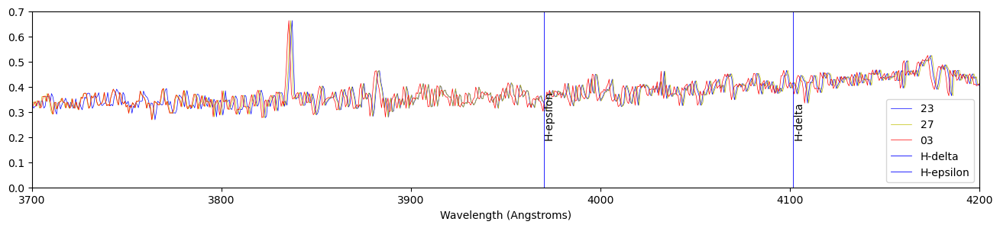

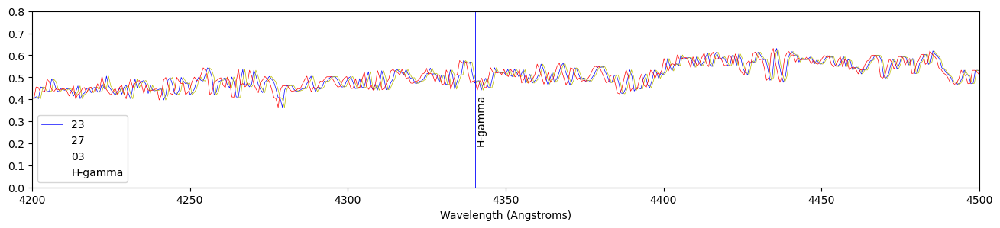

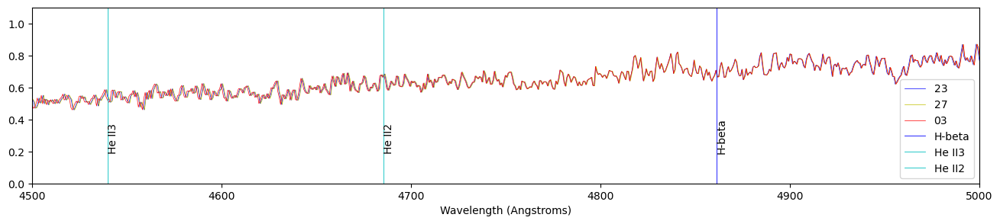

In [103]:
plt.figure(figsize = (16, 3))
plt.plot(x_waves_25_from_23, spectrum1_25, linewidth = 0.5, color = 'b', label='23')
plt.plot(x_waves_25_from_27, spectrum1_25, linewidth = 0.5, color = 'y', label='27')
plt.plot(x_waves_25_from_03, spectrum1_25, linewidth = 0.5, color = 'r', label='03')
plt.xlabel('Wavelength (Angstroms)')
lines(3700, 4200, 0.2)
plt.xlim(3700, 4200)
plt.ylim(0.0, 0.7)
plt.legend()

plt.figure(figsize = (16, 3))
plt.plot(x_waves_25_from_23, spectrum1_25, linewidth = 0.5, color = 'b', label='23')
plt.plot(x_waves_25_from_27, spectrum1_25, linewidth = 0.5, color = 'y', label='27')
plt.plot(x_waves_25_from_03, spectrum1_25, linewidth = 0.5, color = 'r', label='03')
plt.xlabel('Wavelength (Angstroms)')
lines(4200, 4500, 0.2)
plt.xlim(4200, 4500)
plt.ylim(0.0, 0.8)
plt.legend()

plt.figure(figsize = (16, 3))
plt.plot(x_waves_25_from_23, spectrum1_25, linewidth = 0.5, color = 'b', label='23')
plt.plot(x_waves_25_from_27, spectrum1_25, linewidth = 0.5, color = 'y', label='27')
plt.plot(x_waves_25_from_03, spectrum1_25, linewidth = 0.5, color = 'r', label='03')
plt.xlabel('Wavelength (Angstroms)')
lines(4500, 5000, 0.2)
plt.xlim(4500, 5000)
plt.ylim(0, 1.1)
# plt.ylim(0.1, 0.9)
plt.legend()

## Calculate velocities

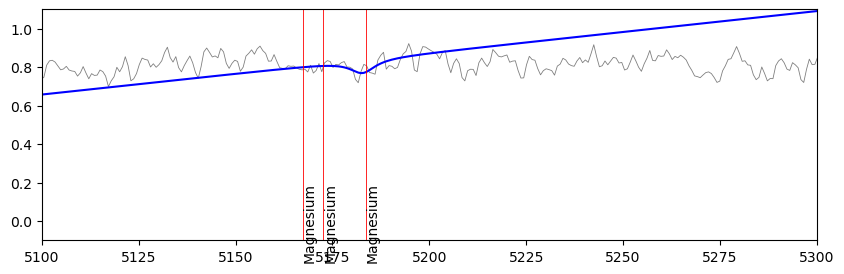

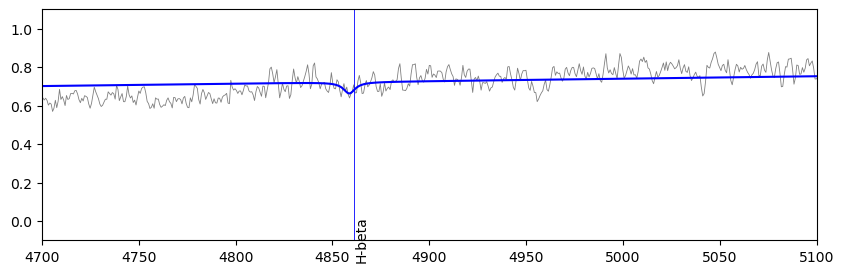

In [104]:
gcc1_25_23_mag =  fit_lorentzian_lin_no_arc(spectrum1_25, x_waves_25_from_23, 3010, 3055, poly4_params_aug23, params_pix_2523, magnesium, plot = True, xmin=5100, xmax=5300)
gcc1_25_23_hbeta =  fit_lorentzian_lin_no_arc(spectrum1_25, x_waves_25_from_23, 2515, 2605, poly4_params_aug23, params_pix_2523, h_beta, plot = True, xmin=4700, xmax=5100)
# gcc1_25_23_hgamma = fit_lorentzian_lin_no_arc(spectrum1_25, x_waves_25_from_23, 1780, 1950, poly4_params_aug23, params_pix_2523, h_gamma, plot = True, xmin=4100, xmax=4600)
# gcc1_25_23_hdelta = fit_lorentzian_quad_no_arc(spectrum1_25, x_waves_25_from_23, 1400, 1600, poly4_params_aug23, params_pix_2523, h_delta, plot = True, xmin=3900, xmax=4300) # 1200, 1700
popt_gcc1_25_23, covar_gcc1_25_23 = opt.curve_fit(const, np.linspace(0, 1, 2), [gcc1_25_23_hbeta[0], gcc1_25_23_mag[0]], sigma=[gcc1_25_23_hbeta[1], gcc1_25_23_mag[1]])

gcc1_25_27_mag =  fit_lorentzian_lin_no_arc(spectrum1_25, x_waves_25_from_27, 3010, 3055, poly4_params_aug27, params_pix_2527, magnesium, plot = False, xmin=5100, xmax=5300)
gcc1_25_27_hbeta =  fit_lorentzian_lin_no_arc(spectrum1_25, x_waves_25_from_27, 2515, 2605, poly4_params_aug27, params_pix_2527, h_beta, plot = False, xmin=4700, xmax=5100)
# gcc1_25_27_hgamma = fit_lorentzian_lin_no_arc(spectrum1_25, x_waves_25_from_27, 1780, 1950, poly4_params_aug27, params_pix_2527, h_gamma, plot = True, xmin=4100, xmax=4600)
# gcc1_25_27_hdelta = fit_lorentzian_quad_no_arc(spectrum1_25, x_waves_25_from_27, 1400, 1600, poly4_params_aug27, params_pix_2527, h_delta, plot = False, xmin=3900, xmax=4300)
popt_gcc1_25_27, covar_gcc1_25_27 = opt.curve_fit(const, np.linspace(0, 1, 2), [gcc1_25_27_hbeta[0], gcc1_25_27_mag[0]],
                                            sigma = [gcc1_25_27_hbeta[1], gcc1_25_27_mag[1]])

gcc1_25_03_mag =  fit_lorentzian_lin_no_arc(spectrum1_25, x_waves_25_from_03, 3010, 3055, poly4_params_oct03, params_pix_2503, magnesium, plot = False, xmin=5100, xmax=5300)
gcc1_25_03_hbeta =  fit_lorentzian_lin_no_arc(spectrum1_25, x_waves_25_from_03, 2515, 2605, poly4_params_oct03, params_pix_2503, h_beta, plot = False, xmin=4700, xmax=5100)
# gcc1_25_03_hgamma = fit_lorentzian_lin_no_arc(spectrum1_25, x_waves_25_from_03, 1780, 1950, poly4_params_oct03, params_pix_2503, h_gamma, plot = True, xmin=4100, xmax=4600)
# gcc1_25_03_hdelta = fit_lorentzian_quad_no_arc(spectrum1_25, x_waves_25_from_03, 1400, 1700, poly4_params_oct03, params_pix_2503, h_delta, plot = False, xmin=3900, xmax=4300)
popt_gcc1_25_03, covar_gcc1_25_03 = opt.curve_fit(const, np.linspace(0, 1, 2), [gcc1_25_03_hbeta[0], gcc1_25_03_mag[0]],
                                            sigma = [gcc1_25_03_hbeta[1], gcc1_25_03_mag[1]])

## Print velocities

In [105]:
print('H-beta:', gcc1_25_23_hbeta[0], '+-', gcc1_25_23_hbeta[1])
print('Magnesium:', gcc1_25_23_mag[0], '+-', gcc1_25_23_mag[1])
print(popt_gcc1_25_23, '+-', np.sqrt(covar_gcc1_25_23[0]))
print('')
print('H-beta:', gcc1_25_27_hbeta[0], '+-', gcc1_25_27_hbeta[1])
print('Magnesium:', gcc1_25_27_mag[0], '+-', gcc1_25_27_mag[1])
print(popt_gcc1_25_27, '+-', np.sqrt(covar_gcc1_25_27[0]))
print('')
print('H-beta:', gcc1_25_03_hbeta[0], '+-', gcc1_25_03_hbeta[1])
print('Magnesium:', gcc1_25_03_mag[0], '+-', gcc1_25_03_mag[1])
print(popt_gcc1_25_03, '+-', np.sqrt(covar_gcc1_25_03[0]))

H-beta: -164.84392955198214 +- 81.26108331470701
Magnesium: -48.59607960227883 +- 63.484641145559586
[-92.65556005] +- [56.39664888]

H-beta: -147.60659974727864 +- 81.30030373325751
Magnesium: -22.426659897748575 +- 63.47501911639964
[-69.83416089] +- [60.72064725]

H-beta: -159.95397238473785 +- 81.51166148738686
Magnesium: 6.965919542199785 +- 63.62926310326942
[-56.23582211] +- [80.96399101]


In [123]:
# print('H-delta:', gcc1_25_23_hdelta[0], '+-', gcc1_25_23_hdelta[1])
# # print('H-gamma:', gcc1_25_23_hgamma[0], '+-', gcc1_25_23_hgamma[1])
# print('He II (2):', gcc1_25_23_HeII2[0], '+-', gcc1_25_23_HeII2[1])
print('H-beta:', gcc1_25_23_hbeta[0], '+-', gcc1_25_23_hbeta[1])
print('Magnesium:', gcc1_25_23_mag[0], '+-', gcc1_25_23_mag[1])
# print('He II:', gcc1_25_23_HeII[0], '+-', gcc1_25_23_HeII[1])
# print(popt_gcc1_25_23, '+-', np.sqrt(covar_gcc1_25_23[0]))
print('')
# print('H-delta:', gcc1_25_27_hdelta[0], '+-', gcc1_25_27_hdelta[1])
# # print('H-gamma:', gcc1_25_27_hgamma[0], '+-', gcc1_25_27_hgamma[1])
# print('He II (2):', gcc1_25_27_HeII2[0], '+-', gcc1_25_27_HeII2[1])
print('H-beta:', gcc1_25_27_hbeta[0], '+-', gcc1_25_27_hbeta[1])
print('Magnesium:', gcc1_25_27_mag[0], '+-', gcc1_25_27_mag[1])
# print('He II:', gcc1_25_27_HeII[0], '+-', gcc1_25_27_HeII[1])
# print(popt_gcc1_25_27, '+-', np.sqrt(covar_gcc1_25_27[0]))
print('')
# print('H-delta:', gcc1_25_03_hdelta[0], '+-', gcc1_25_03_hdelta[1])
# # print('H-gamma:', gcc1_25_03_hgamma[0], '+-', gcc1_25_03_hgamma[1])
# print('He II (2):', gcc1_25_03_HeII2[0], '+-', gcc1_25_03_HeII2[1])
print('H-beta:', gcc1_25_03_hbeta[0], '+-', gcc1_25_03_hbeta[1])
print('Magnesium:', gcc1_25_03_mag[0], '+-', gcc1_25_03_mag[1])
# print('He II:', gcc1_25_03_HeII[0], '+-', gcc1_25_03_HeII[1])
# print(popt_gcc1_25_03, '+-', np.sqrt(covar_gcc1_25_03[0]))

H-beta: -164.84392955198214 +- 81.26108331470701
Magnesium: -48.59607960227883 +- 63.484641145559586

H-beta: -147.60659974727864 +- 81.30030373325751
Magnesium: -22.426659897748575 +- 63.47501911639964

H-beta: -159.95397238473785 +- 81.51166148738686
Magnesium: 6.965919542199785 +- 63.62926310326942


# Old GCC 2 (flat fielding)

## Flat Fielding

In [124]:
# a = grism2 / (flat_balanced_aug23)
# # plot_limits_size(a, min = 0, max = 100, ytop = 590, ybottom = 625)
# spectrum2_ff = grab_spectrum(a, 607, 611)
# # plt.figure(figsize = (12, 3))
# # plt.plot((spectrum2_ff / spectrum2_ff[100:500].max()), linewidth = 0.7, color = 'b')
# # plt.ylim(-0.2, 1.2)

In [125]:
# cal_spec_plot(spectrum2, flat = flat_balanced_aug23)

In [126]:
# # x = cal_wave(spectrum2_ff, 2.43, 1580)
# x = cal_wave(spectrum2_ff, 1.69, 5015)
# plt.figure(figsize = (14, 5))
# plt.plot(x, spectrum2_ff / spectrum2_ff[400:500].max(), linewidth = 0.8, color = 'g')
# plt.ylim(-0.2, 1.2)
# plt.xlabel('Wavelength (Angstroms)')
# lines()
# # plt.xlim(4950, 8000)
# # plt.xlim(5500, 7000)
# # find telluric
# plt.legend()

In [127]:
# a = grism2 / (flat_balanced_aug23)
# # plot_limits_size(a, min = 0, max = 100, ytop = 590, ybottom = 625)
# spectrum2_ff = grab_spectrum(a, 607, 611)
# # plt.figure(figsize = (12, 3))
# # plt.plot((spectrum2_ff / spectrum2_ff[100:500].max()), linewidth = 0.7, color = 'b')
# # plt.ylim(-0.2, 1.2)

In [128]:
# x = cal_wave(spectrum2_ff, 1.69, 5015)
# plt.figure(figsize = (14, 5))
# plt.plot(x, spectrum2_ff / spectrum2_ff[400:500].max(), linewidth = 0.8, color = 'g')
# plt.ylim(-0.2, 1.2)
# plt.xlabel('Wavelength (Angstroms)')
# lines()
# # plt.xlim(4950, 8000)
# # plt.xlim(5500, 7000)
# # find telluric
# plt.legend()

In [129]:
# slit_norm2 = grism2 / (twilight_flat_aug23 / np.median(twilight_flat_aug23))

In [130]:
# plot_limits_size(slit_norm2, min = 0, max = 20)

In [131]:
# spectrum2 = grab_spectrum(slit_norm2, 607, 611)
# # plt.figure(figsize = (12, 3))
# # plt.plot(spectrum2 / spectrum2[700:2000].max(), linewidth = 0.7, color = 'b')
# # plt.ylim(-0.2, 1.2)

In [132]:
# mis_slit_norm2 = grism2 / (MIS_flat_aug23 / np.median(MIS_flat_aug23)) / (twilight_flat_aug23 / np.median(twilight_flat_aug23))

In [133]:
# plot_limits_size(mis_slit_norm2, min = 0, max = 20)

In [134]:
# spectrum2 = grab_spectrum(mis_slit_norm2, 607, 611)
# plt.figure(figsize = (14, 4))
# plt.plot(spectrum2 / spectrum2[100:1000].max(), linewidth = 0.7, color = 'b')
# plt.ylim(-0.2, 1.2)

# GCC2 (Aug 23)

## Bias, Zap, Calibrate

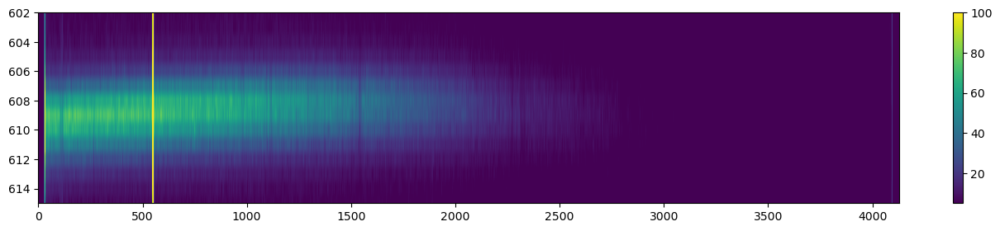

In [135]:
grism2 = min_zapping(datadir, 23, ['b.0043', 'b.0044'])
plot_limits_size(grism2, min = 5, max = 100, ytop = 602, ybottom = 615, figsizeheight=3)

(3900.0, 4100.0)

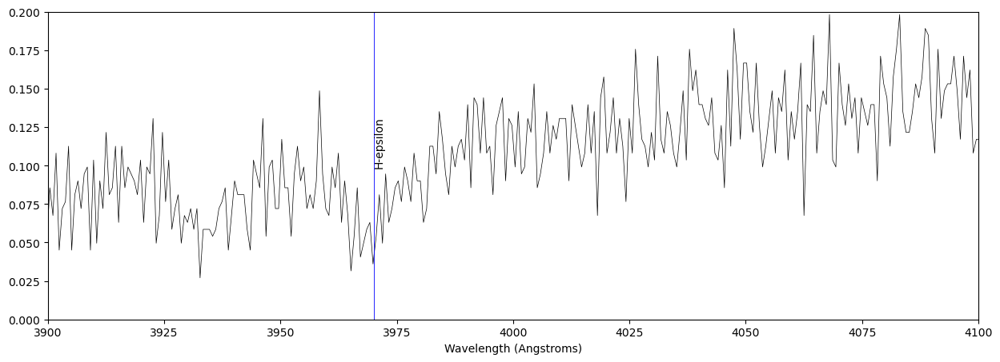

In [136]:
spectrum2 = grab_spectrum(np.flip(grism2, 1), 607, 611)
spectrum2 = spectrum2 / spectrum2[700:3000].max()
x = cal_wave_4th_order(spectrum2, poly4_params_aug23[0], poly4_params_aug23[1], poly4_params_aug23[2], poly4_params_aug23[3], poly4_params_aug23[4])
plt.figure(figsize = (15, 5))
plt.plot(x, spectrum2, linewidth = 0.5, color = 'k')
plt.xlabel('Wavelength (Angstroms)')
# plt.ylim(0.3, 0.9)
# lines(4800, 5000, labely=0.4)
# plt.xlim(4800, 5000)
plt.ylim(0.0, 0.2)
lines(3900, 4100, labely=0.1)
plt.xlim(3900, 4100)
# plt.ylim(-0.1, 1.2)
# lines(3700, 5500)
# plt.xlim(3700, 5500)

## 5577 Green line

In [137]:
green_params23_2, green_covar23_2 = opt.curve_fit(Lorentzian_lin, np.arange(3550, 3600), spectrum2[3550: 3600], p0 = [0, 2, 3575, 0, 1])
# A, sigma, center, c, d
# print(green_params23_2, np.sqrt(green_covar23_2[2][2]))
green23_2_pixel = green_params23_2[2]
# green_params23_2, green_covar23_2 = opt.curve_fit(Lorentzian_lin, np.arange(5570, 5580), spectrum2[3570: 3580], p0 = [0, 2, 5575, 0, 1])
# green23_2_wave = green_params23_2[2]
# print(green_params23_2, np.sqrt(green_covar23_2[2][2]))

In [138]:
# plt.figure(figsize = (15, 5))
# # plt.plot(spectrum2, linewidth = 0.5, color = 'k')
# plt.plot(x, spectrum2, linewidth = 0.5, color = 'k')
# # plt.plot(np.arange(3550, 3600), Lorentzian_lin(np.arange(3550, 3600), green_params23_2[0], green_params23_2[1], green_params23_2[2], green_params23_2[3], green_params23_2[4]), color = 'b')
# plt.plot(np.arange(5550, 5600), Lorentzian_lin(np.arange(5550, 5600), green_params23_2[0], green_params23_2[1], green_params23_2[2], green_params23_2[3], green_params23_2[4]), color = 'b')
# plt.xlabel('Wavelength (Angstroms)')
# plt.ylim(-0.1, 1.2)
# # plt.xlim(3500, 3800)
# # lines(5300, 5700)
# plt.xlim(5500, 5700)
# plt.ylim(0, 4)

In [139]:
# print(calc_velo(green23_2_wave, O_I), '+-', calc_velo_err_lmfit(np.sqrt(green_covar23_2[2][2]), O_I))

## Velocities

In [140]:
aug2_heps = fit_lorentzian_lin(spectrum2, x, 1300, 1400, poly4_params_aug23, h_epsilon, xmin = 3700, xmax = 4200, ymax = 0.4, plot = False)
# print(aug2_heps[0], '+-', aug2_heps[1])
aug2_hdelta = fit_lorentzian_lin(spectrum2, x, 1480, 1540, poly4_params_aug23, h_delta, xmin = 4000, xmax = 4300, ymax = 0.4, plot = False)
# print(aug2_hdelta[0], '+-', aug2_hdelta[1])
aug2_hgamma = fit_lorentzian_lin(spectrum2, x, 1840, 1880, poly4_params_aug23, h_gamma, xmin = 4200, xmax = 4500, ymax = 0.4, plot = False)
# print(aug2_hgamma[0], '+-', aug2_hgamma[1])
aug2_hbeta = fit_lorentzian_quad(spectrum2, x, 2400, 2800, poly4_params_aug23, h_beta, xmin = 4000, xmax = 6000, ymax = 1.2, plot = False, figwidth=15, figheight=5)
# print(aug2_hbeta[0], '+-', aug2_hbeta[1])

In [141]:
print('H-epsilon:', aug2_heps[0], '+-', aug2_heps[1])
print('H-delta:', aug2_hdelta[0], '+-', aug2_hdelta[1])
print('H-gamma:', aug2_hgamma[0], '+-', aug2_hgamma[1])
print('H-beta:', aug2_hbeta[0], '+-', aug2_hbeta[1])

popt, covar = opt.curve_fit(const, np.linspace(0, 3, 4), [aug2_heps[0], aug2_hdelta[0], aug2_hgamma[0], aug2_hbeta[0]], sigma = [aug2_heps[1], aug2_hdelta[1], aug2_hgamma[1], aug2_hbeta[1]])
# popt, covar = opt.curve_fit(const, np.linspace(0, 2, 3), [aug2_hdelta[0], aug2_hgamma[0], aug2_hbeta[0]], sigma = [aug2_hdelta[1], aug2_hgamma[1], aug2_hbeta[1]])
print(popt, '+-', np.sqrt(covar[0]))

H-epsilon: -112.22226994580056 +- 74.5866889348154
H-delta: -66.35919774681633 +- 35.219332191893486
H-gamma: -46.43462251690367 +- 21.14398314121283
H-beta: -81.74199106380807 +- 20.395397745567223
[-66.47599194] +- [10.42587836]


# GCC3 (Aug 25)

## Bias, zap, scale pixels

In [142]:
grism3_25 = min_zapping(datadir, 25, ['b.0139', 'b.0140'])

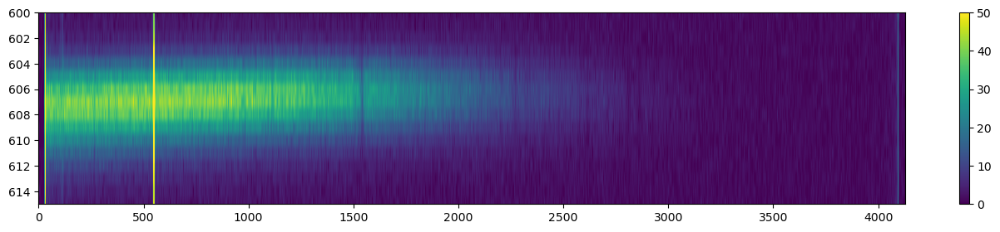

In [143]:
plot_limits_size(grism3_25, min = 0, max = 50, ytop = 600, ybottom = 615, figsizeheight = 3)

In [144]:
spectrum3_25 = grab_spectrum(np.flip(grism3_25, 1), 605, 610)
spectrum3_25 = spectrum3_25 / spectrum3_25[700:3000].max()

In [145]:
x_pixels_25to23 = cal_wave_4auto(spectrum3_25, params_pix_2523)
x_pixels_25to27 = cal_wave_4auto(spectrum3_25, params_pix_2527)
x_pixels_25to03 = cal_wave_4auto(spectrum3_25, params_pix_2503)

x_waves_25_from_23 = cal_wave_4auto_range(x_pixels_25to23, poly4_params_aug23)
x_waves_25_from_27 = cal_wave_4auto_range(x_pixels_25to27, poly4_params_aug27)
x_waves_25_from_03 = cal_wave_4auto_range(x_pixels_25to03, poly4_params_oct03)

## Absorption line plots

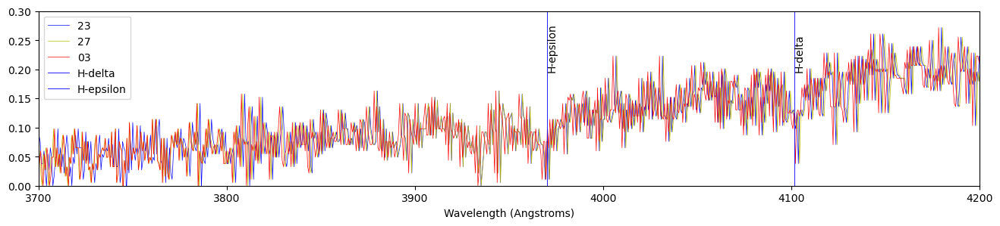

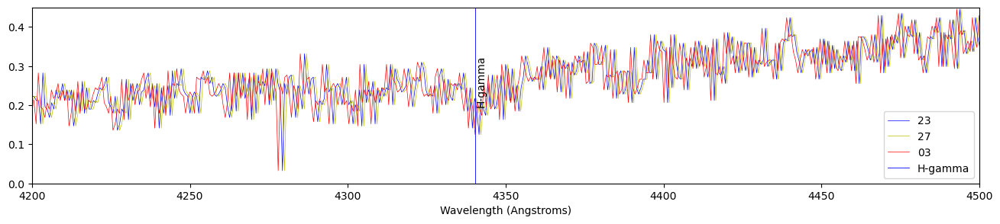

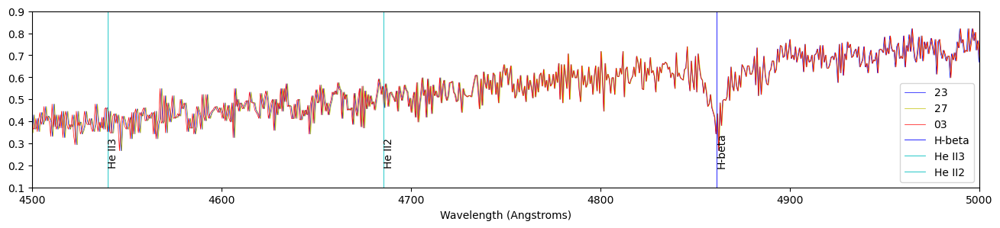

In [146]:
plt.figure(figsize = (16, 3))
plt.plot(x_waves_25_from_23, spectrum3_25, linewidth = 0.5, color = 'b', label='23')
plt.plot(x_waves_25_from_27, spectrum3_25, linewidth = 0.5, color = 'y', label='27')
plt.plot(x_waves_25_from_03, spectrum3_25, linewidth = 0.5, color = 'r', label='03')
plt.xlabel('Wavelength (Angstroms)')
plt.ylim(-0.1, 1.2)
lines(3700, 4200, 0.2)
plt.xlim(3700, 4200)
plt.ylim(0.0, 0.3)
plt.legend()

plt.figure(figsize = (16, 3))
plt.plot(x_waves_25_from_23, spectrum3_25, linewidth = 0.5, color = 'b', label='23')
plt.plot(x_waves_25_from_27, spectrum3_25, linewidth = 0.5, color = 'y', label='27')
plt.plot(x_waves_25_from_03, spectrum3_25, linewidth = 0.5, color = 'r', label='03')
plt.xlabel('Wavelength (Angstroms)')
plt.ylim(-0.1, 1.2)
lines(4200, 4500, 0.2)
plt.xlim(4200, 4500)
plt.ylim(0.0, 0.45)
plt.legend()

plt.figure(figsize = (16, 3))
plt.plot(x_waves_25_from_23, spectrum3_25, linewidth = 0.5, color = 'b', label='23')
plt.plot(x_waves_25_from_27, spectrum3_25, linewidth = 0.5, color = 'y', label='27')
plt.plot(x_waves_25_from_03, spectrum3_25, linewidth = 0.5, color = 'r', label='03')
plt.xlabel('Wavelength (Angstroms)')
plt.ylim(-0.1, 1.2)
lines(4500, 5000, 0.2)
plt.xlim(4500, 5000)
plt.ylim(0.1, 0.9)
plt.legend()

Absorption lines that GCC3 has: hbeta, hgamma, hdelta, hepsilon

## Calculate velocities

In [147]:
gcc3_25_23_hbeta =  fit_lorentzian_quad_no_arc(spectrum3_25, x_waves_25_from_23, 2500, 2700, poly4_params_aug23, params_pix_2523, h_beta, plot = False, xmin=4700, xmax=5100)
gcc3_25_23_hgamma = fit_lorentzian_lin_no_arc(spectrum3_25, x_waves_25_from_23, 1780, 1950, poly4_params_aug23, params_pix_2523, h_gamma, plot = False, xmin=4100, xmax=4600)
gcc3_25_23_hdelta = fit_lorentzian_quad_no_arc(spectrum3_25, x_waves_25_from_23, 1400, 1600, poly4_params_aug23, params_pix_2523, h_delta, plot = False, xmin=3900, xmax=4300) # 1200, 1700
gcc3_25_23_hepsilon = fit_lorentzian_lin_no_arc(spectrum3_25, x_waves_25_from_23, 1250, 1400, poly4_params_aug23, params_pix_2523, h_epsilon, plot = False, xmin=3800, xmax=4200)
popt_gcc3_25_23, covar_gcc3_25_23 = opt.curve_fit(const, np.linspace(0, 2, 3), [gcc3_25_23_hepsilon[0], gcc3_25_23_hdelta[0], gcc3_25_23_hgamma[0], #gcc3_25_23_HeII[0], gcc3_25_23_HeII2[0],
                                                                                gcc3_25_23_hbeta[0]],
                                            sigma = [gcc3_25_23_hepsilon[1], gcc3_25_23_hdelta[1], gcc3_25_23_hgamma[1], #gcc3_25_23_HeII[1], gcc3_25_23_HeII2[1],
                                                     gcc3_25_23_hbeta[1]])

gcc3_25_27_hbeta =  fit_lorentzian_quad_no_arc(spectrum3_25, x_waves_25_from_27, 2400, 2800, poly4_params_aug27, params_pix_2527, h_beta, plot = False, xmin=4700, xmax=5100)
gcc3_25_27_hgamma = fit_lorentzian_lin_no_arc(spectrum3_25, x_waves_25_from_27, 1780, 1950, poly4_params_aug27, params_pix_2527, h_gamma, plot = False, xmin=4200, xmax=4500)
gcc3_25_27_hdelta = fit_lorentzian_quad_no_arc(spectrum3_25, x_waves_25_from_27, 1400, 1600, poly4_params_aug27, params_pix_2527, h_delta, plot = False, xmin=4000, xmax=4300)
gcc3_25_27_hepsilon = fit_lorentzian_lin_no_arc(spectrum3_25, x_waves_25_from_27, 1250, 1400, poly4_params_aug27, params_pix_2527, h_epsilon, plot = False, xmin=3800, xmax=4200)
popt_gcc3_25_27, covar_gcc3_25_27 = opt.curve_fit(const, np.linspace(0, 3, 4), [gcc3_25_27_hepsilon[0], gcc3_25_27_hdelta[0], gcc3_25_27_hgamma[0], #gcc3_25_27_HeII[0], gcc3_25_27_HeII2[0],
                                                                                gcc3_25_27_hbeta[0]],
                                            sigma = [gcc3_25_27_hepsilon[1], gcc3_25_27_hdelta[1], gcc3_25_27_hgamma[1], #gcc3_25_27_HeII[1], gcc3_25_27_HeII2[1],
                                                     gcc3_25_27_hbeta[1]])

gcc3_25_03_hbeta =  fit_lorentzian_quad_no_arc(spectrum3_25, x_waves_25_from_03, 2400, 2800, poly4_params_oct03, params_pix_2503, h_beta, plot = False)
gcc3_25_03_hgamma = fit_lorentzian_lin_no_arc(spectrum3_25, x_waves_25_from_03, 1770, 1940, poly4_params_oct03, params_pix_2503, h_gamma, plot = False, xmin=4200, xmax=4500)
gcc3_25_03_hdelta = fit_lorentzian_quad_no_arc(spectrum3_25, x_waves_25_from_03, 1300, 1700, poly4_params_oct03, params_pix_2503, h_delta, plot = False, xmin=4000, xmax=4300)
gcc3_25_03_hepsilon = fit_lorentzian_lin_no_arc(spectrum3_25, x_waves_25_from_23, 1250, 1400, poly4_params_aug23, params_pix_2523, h_epsilon, plot = False, xmin=3800, xmax=4200)
popt_gcc3_25_03, covar_gcc3_25_03 = opt.curve_fit(const, np.linspace(0, 3, 4), [gcc3_25_03_hepsilon[0], gcc3_25_03_hdelta[0], gcc3_25_03_hgamma[0], #gcc3_25_03_HeII[0], gcc3_25_03_HeII2[0],
                                                                                gcc3_25_03_hbeta[0]],
                                            sigma = [gcc3_25_03_hepsilon[1], gcc3_25_03_hdelta[1], gcc3_25_03_hgamma[1], #gcc3_25_03_HeII[1], gcc3_25_03_HeII2[1],
                                                     gcc3_25_03_hbeta[1]])

## Print Velocities

In [148]:
print('H-epsilon:',   gcc3_25_23_hepsilon[0], '+-', gcc3_25_23_hepsilon[1])
print('H-delta:',     gcc3_25_23_hdelta[0], '+-', gcc3_25_23_hdelta[1])
print('H-gamma:',     gcc3_25_23_hgamma[0], '+-', gcc3_25_23_hgamma[1])
print('H-beta:',      gcc3_25_23_hbeta[0], '+-',  gcc3_25_23_hbeta[1])
print(popt_gcc3_25_23, '+-', np.sqrt(covar_gcc3_25_23[0]))
print('')
print('H-epsilon:',   gcc3_25_27_hepsilon[0], '+-', gcc3_25_27_hepsilon[1])
print('H-delta:',     gcc3_25_27_hdelta[0], '+-', gcc3_25_27_hdelta[1])
print('H-gamma:',     gcc3_25_27_hgamma[0], '+-', gcc3_25_27_hgamma[1])
print('H-beta:',      gcc3_25_27_hbeta[0], '+-',  gcc3_25_27_hbeta[1])
print(popt_gcc3_25_27, '+-', np.sqrt(covar_gcc3_25_27[0]))
print('')
print('H-epsilon:',   gcc3_25_03_hepsilon[0], '+-', gcc3_25_03_hepsilon[1])
print('H-delta:', gcc3_25_03_hdelta[0], '+-', gcc3_25_03_hdelta[1])
print('H-gamma:', gcc3_25_03_hgamma[0], '+-', gcc3_25_03_hgamma[1])
print('H-beta:',    gcc3_25_03_hbeta[0], '+-',  gcc3_25_03_hbeta[1])
print(popt_gcc3_25_03, '+-', np.sqrt(covar_gcc3_25_03[0]))

H-epsilon: -35.013535125515205 +- 65.32671468719106
H-delta: 101.92493671907087 +- 58.010723123002066
H-gamma: 86.89160502460838 +- 54.92757348158384
H-beta: 31.55581920031473 +- 25.059581817535843
[41.18905726] +- [21.15626865]

H-epsilon: -17.20659882475271 +- 65.65044135163662
H-delta: 147.29710599708224 +- 58.09231894103262
H-gamma: 126.68541038707339 +- 54.85230246137029
H-beta: 47.94532491333337 +- 24.329213746058308
[63.82427841] +- [26.38856849]

H-epsilon: -35.013535125515205 +- 65.32671468719106
H-delta: -43.6602394051643 +- 90.69848233780803
H-gamma: 3.933373142054264 +- 58.02769152895854
H-beta: 36.09475445866815 +- 24.391150341099397
[20.70789145] +- [15.64077079]


It looks like h-beta is the most aligned among all spectrum calibrated with the 23rd, 27th, and 3rd. So we might want to only use that line.

# GCC4 (Aug 25)

## Bias, Zap, scale pixels

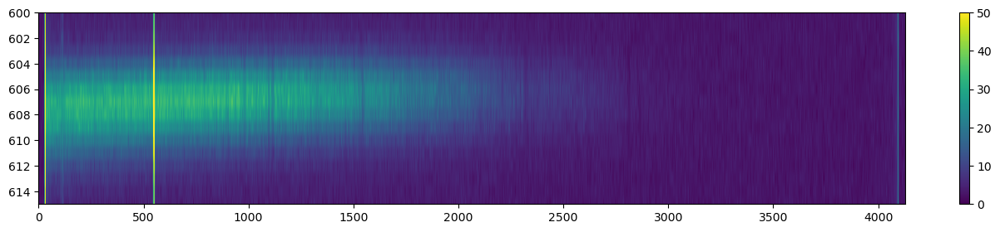

In [149]:
grism4_25 = zap_median(datadir, 25, ['b.0143', 'b.0144', 'b.0145'])
plot_limits_size(grism4_25, min = 0, max = 50, ytop = 600, ybottom = 615, figsizeheight = 3)

In [150]:
spectrum4_25 = grab_spectrum(np.flip(grism4_25, 1), 604, 610)
spectrum4_25 = spectrum4_25 / spectrum4_25[700:3000].max()

x_pixels_25to23 = cal_wave_4auto(spectrum4_25, params_pix_2523)
x_pixels_25to27 = cal_wave_4auto(spectrum4_25, params_pix_2527)
x_pixels_25to03 = cal_wave_4auto(spectrum4_25, params_pix_2503)

x_waves_25_from_23 = cal_wave_4auto_range(x_pixels_25to23, poly4_params_aug23)
x_waves_25_from_27 = cal_wave_4auto_range(x_pixels_25to27, poly4_params_aug27)
x_waves_25_from_03 = cal_wave_4auto_range(x_pixels_25to03, poly4_params_oct03)

## Absorption line plots

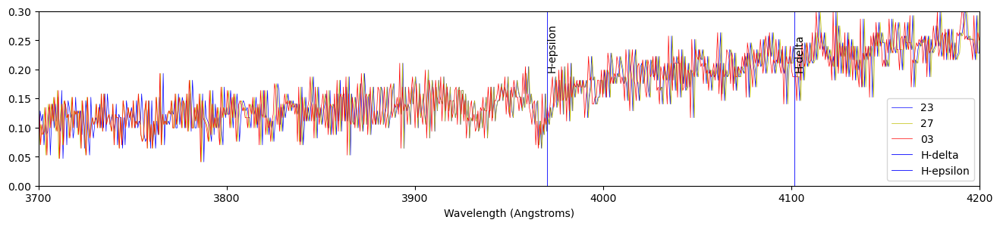

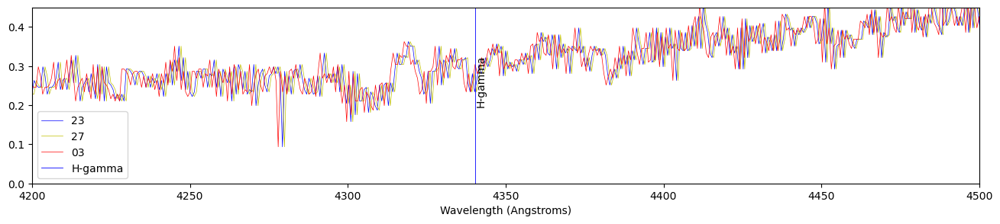

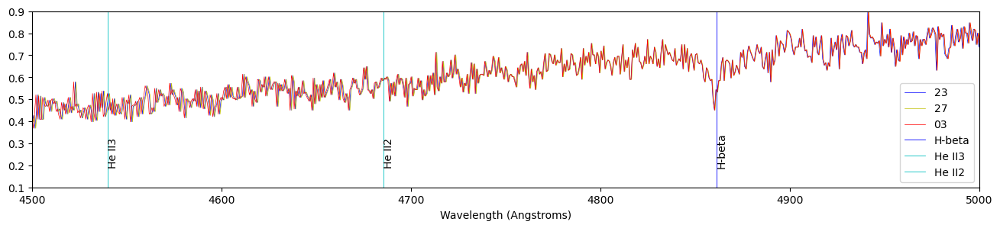

In [151]:
plt.figure(figsize = (16, 3))
plt.plot(x_waves_25_from_23, spectrum4_25, linewidth = 0.5, color = 'b', label='23')
plt.plot(x_waves_25_from_27, spectrum4_25, linewidth = 0.5, color = 'y', label='27')
plt.plot(x_waves_25_from_03, spectrum4_25, linewidth = 0.5, color = 'r', label='03')
plt.xlabel('Wavelength (Angstroms)')
plt.ylim(-0.1, 1.2)
lines(3700, 4200, 0.2)
plt.xlim(3700, 4200)
plt.ylim(0.0, 0.3)
plt.legend()

plt.figure(figsize = (16, 3))
plt.plot(x_waves_25_from_23, spectrum4_25, linewidth = 0.5, color = 'b', label='23')
plt.plot(x_waves_25_from_27, spectrum4_25, linewidth = 0.5, color = 'y', label='27')
plt.plot(x_waves_25_from_03, spectrum4_25, linewidth = 0.5, color = 'r', label='03')
plt.xlabel('Wavelength (Angstroms)')
plt.ylim(-0.1, 1.2)
lines(4200, 4500, 0.2)
plt.xlim(4200, 4500)
plt.ylim(0.0, 0.45)
plt.legend()

plt.figure(figsize = (16, 3))
plt.plot(x_waves_25_from_23, spectrum4_25, linewidth = 0.5, color = 'b', label='23')
plt.plot(x_waves_25_from_27, spectrum4_25, linewidth = 0.5, color = 'y', label='27')
plt.plot(x_waves_25_from_03, spectrum4_25, linewidth = 0.5, color = 'r', label='03')
plt.xlabel('Wavelength (Angstroms)')
plt.ylim(-0.1, 1.2)
lines(4500, 5000, 0.2)
plt.xlim(4500, 5000)
plt.ylim(0.1, 0.9)
plt.legend()

Absorption lines that GCC4 has: hbeta, hgamma, hdelta, and hepsilon

## Calculate velocities

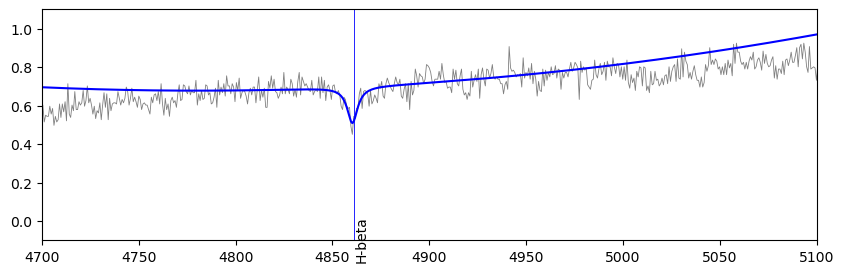

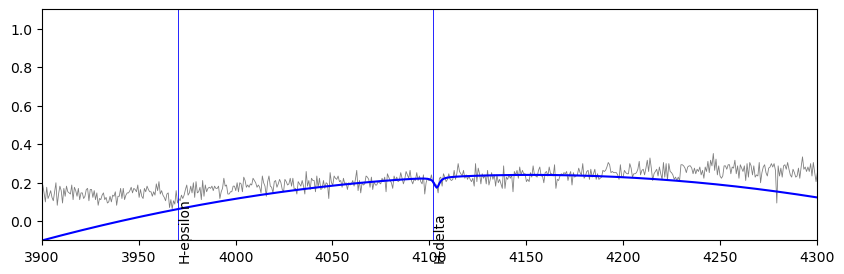

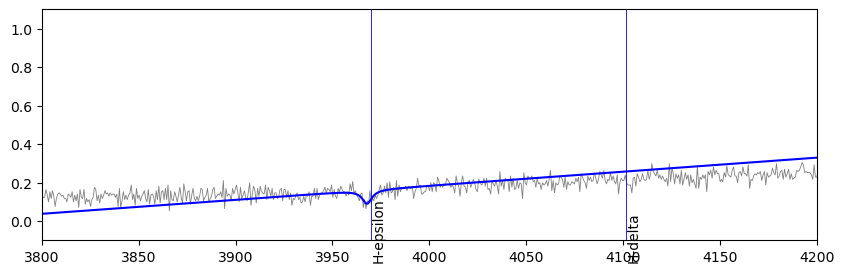

In [152]:
gcc4_25_23_hbeta =    fit_lorentzian_quad_no_arc(spectrum4_25, x_waves_25_from_23, 2500, 2700, poly4_params_aug23, params_pix_2523, h_beta, plot = True, xmin=4700, xmax=5100)
# gcc4_25_23_hgamma =   fit_lorentzian_lin_no_arc(spectrum4_25, x_waves_25_from_23, 1810, 1910, poly4_params_aug23, params_pix_2523, h_gamma, plot = True, xmin=4100, xmax=4600)
gcc4_25_23_hdelta =   fit_lorentzian_quad_no_arc(spectrum4_25, x_waves_25_from_23, 1450, 1550, poly4_params_aug23, params_pix_2523, h_delta, plot = True, xmin=3900, xmax=4300) # 1200, 1700
gcc4_25_23_hepsilon = fit_lorentzian_lin_no_arc(spectrum4_25, x_waves_25_from_23, 1250, 1350, poly4_params_aug23, params_pix_2523, h_epsilon, plot = True, xmin=3800, xmax=4200)
popt_gcc4_25_23, covar_gcc4_25_23 = opt.curve_fit(const, np.linspace(0, 2, 3), [gcc4_25_23_hepsilon[0], gcc4_25_23_hdelta[0], #gcc4_25_23_hgamma[0],
                                                                                gcc4_25_23_hbeta[0]],
                                            sigma = [gcc4_25_23_hepsilon[1], gcc4_25_23_hdelta[1], #gcc4_25_23_hgamma[1],
                                                     gcc4_25_23_hbeta[1]])

gcc4_25_27_hbeta =  fit_lorentzian_quad_no_arc(spectrum4_25, x_waves_25_from_27, 2400, 2800, poly4_params_aug27, params_pix_2527, h_beta, plot = False, xmin=4700, xmax=5100)
# gcc4_25_27_hgamma = fit_lorentzian_lin_no_arc(spectrum4_25, x_waves_25_from_27, 1810, 1910, poly4_params_aug27, params_pix_2527, h_gamma, plot = False, xmin=3900, xmax=4300)
gcc4_25_27_hdelta = fit_lorentzian_quad_no_arc(spectrum4_25, x_waves_25_from_27, 1450, 1550, poly4_params_aug27, params_pix_2527, h_delta, plot = False, xmin=4000, xmax=4200)
gcc4_25_27_hepsilon = fit_lorentzian_lin_no_arc(spectrum4_25, x_waves_25_from_27, 1250, 1350, poly4_params_aug27, params_pix_2527, h_epsilon, plot = False, xmin=3800, xmax=4200)
popt_gcc4_25_27, covar_gcc4_25_27 = opt.curve_fit(const, np.linspace(0, 3, 4), [gcc4_25_27_hepsilon[0], gcc4_25_27_hdelta[0], #gcc4_25_27_hgamma[0],
                                                                                gcc4_25_27_hbeta[0]],
                                            sigma = [gcc4_25_27_hepsilon[1], gcc4_25_27_hdelta[1], #gcc4_25_27_hgamma[1],
                                                     gcc4_25_27_hbeta[1]])

gcc4_25_03_hbeta =  fit_lorentzian_quad_no_arc(spectrum4_25, x_waves_25_from_03, 2400, 2800, poly4_params_oct03, params_pix_2503, h_beta, plot = False)
# gcc4_25_03_hgamma = fit_lorentzian_lin_no_arc(spectrum4_25, x_waves_25_from_03, 1780, 1950, poly4_params_oct03, params_pix_2503, h_gamma, plot = True, xmin=4000, xmax=4500)
gcc4_25_03_hdelta = fit_lorentzian_quad_no_arc(spectrum4_25, x_waves_25_from_03, 1450, 1550, poly4_params_oct03, params_pix_2503, h_delta, plot = False, xmin=4000, xmax=4200)
gcc4_25_03_hepsilon = fit_lorentzian_lin_no_arc(spectrum4_25, x_waves_25_from_03, 1250, 1400, poly4_params_oct03, params_pix_2503, h_epsilon, plot = False, xmin=3800, xmax=4200)
popt_gcc4_25_03, covar_gcc4_25_03 = opt.curve_fit(const, np.linspace(0, 3, 4), [gcc4_25_03_hepsilon[0], gcc4_25_03_hdelta[0], #gcc4_25_03_hgamma[0],
                                                                                gcc4_25_03_hbeta[0]],
                                            sigma = [gcc4_25_03_hepsilon[1], gcc4_25_03_hdelta[1], #gcc4_25_03_hgamma[1],
                                                     gcc4_25_03_hbeta[1]])

## Print Velocities

In [153]:
print('H-epsilon:',   gcc4_25_23_hepsilon[0], '+-', gcc4_25_23_hepsilon[1])
print('H-delta:',     gcc4_25_23_hdelta[0], '+-', gcc4_25_23_hdelta[1])
# print('H-gamma:',     gcc4_25_23_hgamma[0], '+-', gcc4_25_23_hgamma[1])
print('H-beta:',      gcc4_25_23_hbeta[0], '+-',  gcc4_25_23_hbeta[1])
print(popt_gcc4_25_23, '+-', np.sqrt(covar_gcc3_25_23[0]))
print('')
print('H-epsilon:',   gcc4_25_27_hepsilon[0], '+-', gcc4_25_27_hepsilon[1])
print('H-delta:',     gcc4_25_27_hdelta[0], '+-', gcc4_25_27_hdelta[1])
# print('H-gamma:',     gcc4_25_27_hgamma[0], '+-', gcc4_25_27_hgamma[1])
print('H-beta:',      gcc4_25_27_hbeta[0], '+-',  gcc4_25_27_hbeta[1])
print(popt_gcc4_25_27, '+-', np.sqrt(covar_gcc4_25_27[0]))
print('')
print('H-epsilon:',   gcc4_25_03_hepsilon[0], '+-', gcc4_25_03_hepsilon[1])
print('H-delta:', gcc4_25_03_hdelta[0], '+-', gcc4_25_03_hdelta[1])
# print('H-gamma:', gcc4_25_03_hgamma[0], '+-', gcc4_25_03_hgamma[1])
print('H-beta:',    gcc4_25_03_hbeta[0], '+-',  gcc4_25_03_hbeta[1])
print(popt_gcc4_25_03, '+-', np.sqrt(covar_gcc4_25_03[0]))

H-epsilon: -168.47841473418788 +- 44.68137326704384
H-delta: 155.94867049295667 +- 43.44239174834082
H-beta: -66.81679890686007 +- 25.97563286347695
[-40.10762158] +- [21.15626865]

H-epsilon: -151.2837312863789 +- 44.896945835985655
H-delta: 201.44325405418982 +- 43.48878765879913
H-beta: -44.57206908597393 +- 31.55772047780825
[-6.55283229] +- [92.49624096]

H-epsilon: -302.34387476163533 +- 43.27414870075199
H-delta: 42.8413148516249 +- 43.4609617932652
H-beta: -56.65554671522849 +- 31.640781443717707
[-94.73093498] +- [91.43797414]


# GCC 5 (Aug 25)

## Bias, zap, scale pixels

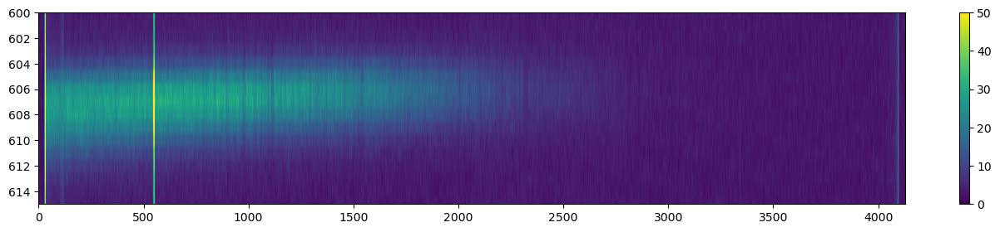

In [154]:
grism5_25 = zap_median(datadir, 25, ['b.0148', 'b.0149', 'b.0150'])
plot_limits_size(grism5_25, min = 0, max = 50, ytop = 600, ybottom = 615, figsizeheight = 3)

In [155]:
spectrum5_25 = grab_spectrum(np.flip(grism5_25, 1), 604, 609)
spectrum5_25 = spectrum5_25 / spectrum5_25[700:3000].max()

x_pixels_25to23 = cal_wave_4auto(spectrum5_25, params_pix_2523)
x_pixels_25to27 = cal_wave_4auto(spectrum5_25, params_pix_2527)
x_pixels_25to03 = cal_wave_4auto(spectrum5_25, params_pix_2503)

x_waves_25_from_23 = cal_wave_4auto_range(x_pixels_25to23, poly4_params_aug23)
x_waves_25_from_27 = cal_wave_4auto_range(x_pixels_25to27, poly4_params_aug27)
x_waves_25_from_03 = cal_wave_4auto_range(x_pixels_25to03, poly4_params_oct03)

## Absorption line plots GCC5_25

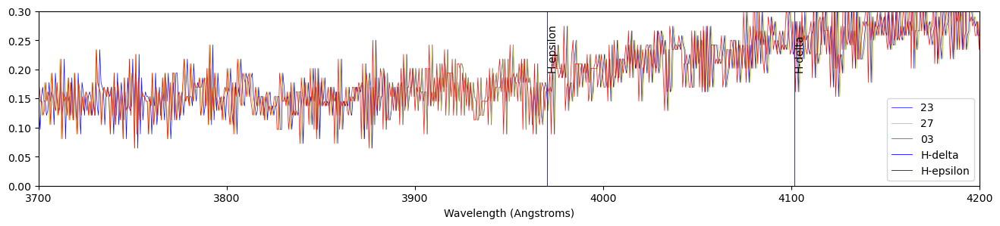

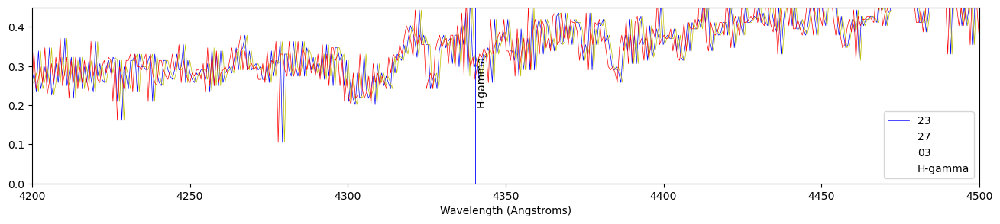

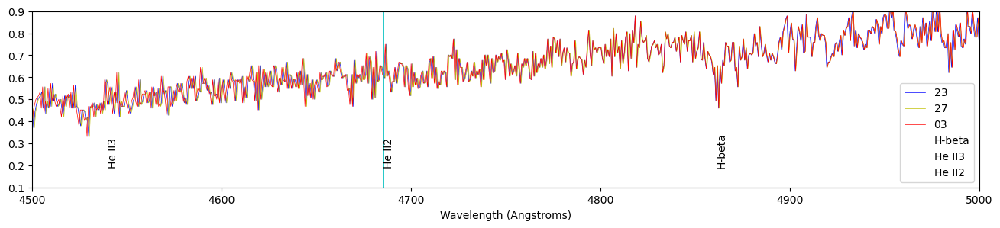

In [156]:
plt.figure(figsize = (16, 3))
plt.plot(x_waves_25_from_23, spectrum5_25, linewidth = 0.5, color = 'b', label='23')
plt.plot(x_waves_25_from_27, spectrum5_25, linewidth = 0.5, color = 'y', label='27')
plt.plot(x_waves_25_from_03, spectrum5_25, linewidth = 0.5, color = 'r', label='03')
plt.xlabel('Wavelength (Angstroms)')
plt.ylim(-0.1, 1.2)
lines(3700, 4200, 0.2)
plt.xlim(3700, 4200)
plt.ylim(0.0, 0.3)
plt.legend()

plt.figure(figsize = (16, 3))
plt.plot(x_waves_25_from_23, spectrum5_25, linewidth = 0.5, color = 'b', label='23')
plt.plot(x_waves_25_from_27, spectrum5_25, linewidth = 0.5, color = 'y', label='27')
plt.plot(x_waves_25_from_03, spectrum5_25, linewidth = 0.5, color = 'r', label='03')
plt.xlabel('Wavelength (Angstroms)')
plt.ylim(-0.1, 1.2)
lines(4200, 4500, 0.2)
plt.xlim(4200, 4500)
plt.ylim(0.0, 0.45)
plt.legend()

plt.figure(figsize = (16, 3))
plt.plot(x_waves_25_from_23, spectrum5_25, linewidth = 0.5, color = 'b', label='23')
plt.plot(x_waves_25_from_27, spectrum5_25, linewidth = 0.5, color = 'y', label='27')
plt.plot(x_waves_25_from_03, spectrum5_25, linewidth = 0.5, color = 'r', label='03')
plt.xlabel('Wavelength (Angstroms)')
plt.ylim(-0.1, 1.2)
lines(4500, 5000, 0.2)
plt.xlim(4500, 5000)
plt.ylim(0.1, 0.9)
plt.legend()

Absorption lines GCC5 has: magnesium, hbeta, hgamma, hepsilon

## Calculate Velocities

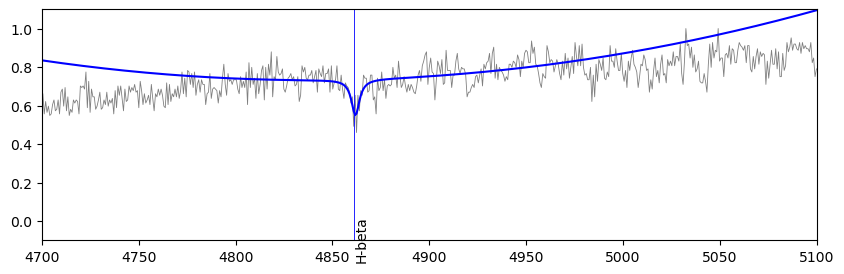

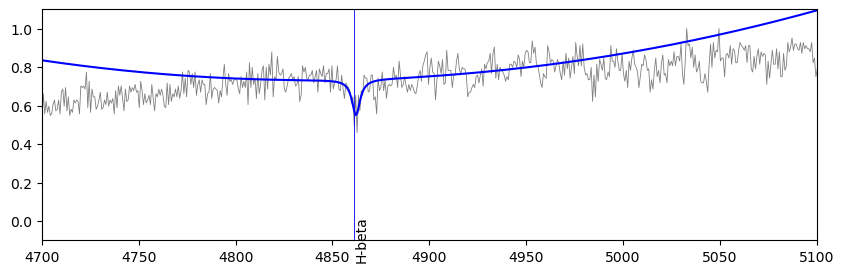

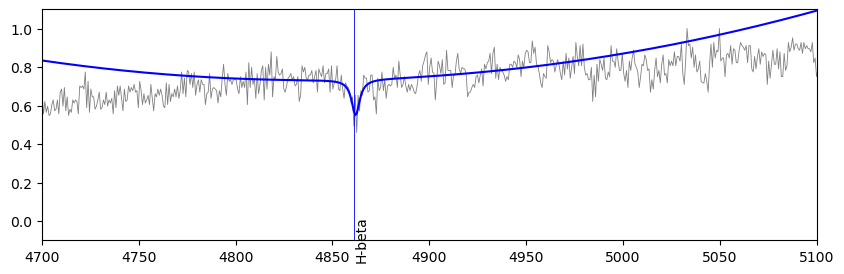

In [157]:
gcc5_25_23_mag =      fit_lorentzian_lin_no_arc(spectrum5_25, x_waves_25_from_23, 3020, 3080, poly4_params_aug23, params_pix_2523, magnesium, plot = False, xmin=5000, xmax=5500)
gcc5_25_23_hbeta =    fit_lorentzian_quad_no_arc(spectrum5_25, x_waves_25_from_23, 2500, 2700, poly4_params_aug23, params_pix_2523, h_beta, plot = True, xmin=4700, xmax=5100)
# gcc5_25_23_hgamma =   fit_lorentzian_lin_no_arc(spectrum5_25, x_waves_25_from_23, 1810, 1910, poly4_params_aug23, params_pix_2523, h_gamma, plot = True, xmin=4100, xmax=4600)
# gcc5_25_23_hdelta =   fit_lorentzian_quad_no_arc(spectrum5_25, x_waves_25_from_23, 1400, 1600, poly4_params_aug23, params_pix_2523, h_delta, plot = False, xmin=3900, xmax=4300) # 1200, 1700
gcc5_25_23_hepsilon = fit_lorentzian_lin_no_arc(spectrum5_25, x_waves_25_from_23, 1250, 1350, poly4_params_aug23, params_pix_2523, h_epsilon, plot = False, xmin=3800, xmax=4200)
popt_gcc5_25_23, covar_gcc5_25_23 = opt.curve_fit(const, np.linspace(0, 2, 3), [gcc5_25_23_hepsilon[0], #gcc5_25_23_hdelta[0], gcc5_25_23_hgamma[0],
                                                                                gcc5_25_23_hbeta[0], gcc5_25_23_mag[0]],
                                            sigma = [gcc5_25_23_hepsilon[1], #gcc5_25_23_hdelta[1], gcc5_25_23_hgamma[1],
                                                     gcc5_25_23_hbeta[1], gcc5_25_23_mag[1]])

gcc5_25_27_mag =    fit_lorentzian_lin_no_arc(spectrum5_25, x_waves_25_from_27, 3020, 3080, poly4_params_aug27, params_pix_2527, magnesium, plot = False, xmin=5000, xmax=5500)
gcc5_25_27_hbeta =  fit_lorentzian_quad_no_arc(spectrum5_25, x_waves_25_from_27, 2500, 2700, poly4_params_aug27, params_pix_2527, h_beta, plot = True, xmin=4700, xmax=5100)
# gcc5_25_27_hgamma = fit_lorentzian_lin_no_arc(spectrum5_25, x_waves_25_from_27, 1810, 1910, poly4_params_aug27, params_pix_2527, h_gamma, plot = False, xmin=3900, xmax=4300)
# gcc5_25_27_hdelta = fit_lorentzian_quad_no_arc(spectrum5_25, x_waves_25_from_27, 1400, 1600, poly4_params_aug27, params_pix_2527, h_delta, plot = False, xmin=4000, xmax=4200)
gcc5_25_27_hepsilon = fit_lorentzian_lin_no_arc(spectrum5_25, x_waves_25_from_27, 1250, 1350, poly4_params_aug27, params_pix_2527, h_epsilon, plot = False, xmin=3800, xmax=4200)
popt_gcc5_25_27, covar_gcc5_25_27 = opt.curve_fit(const, np.linspace(0, 2, 3), [gcc5_25_27_hepsilon[0], #gcc4_25_27_hdelta[0], gcc5_25_27_hgamma[0],
                                                                                gcc5_25_27_hbeta[0], gcc5_25_27_mag[0]],
                                            sigma = [gcc5_25_27_hepsilon[1], #gcc4_25_27_hdelta[1], gcc5_25_27_hgamma[1],
                                                     gcc5_25_27_hbeta[1], gcc5_25_27_mag[1]])

gcc5_25_03_mag =    fit_lorentzian_lin_no_arc(spectrum5_25, x_waves_25_from_03, 3020, 3080, poly4_params_oct03, params_pix_2503, magnesium, plot = False, xmin=5000, xmax=5500)
gcc5_25_03_hbeta =  fit_lorentzian_quad_no_arc(spectrum5_25, x_waves_25_from_03, 2500, 2700, poly4_params_oct03, params_pix_2503, h_beta, plot = True, xmin=4700, xmax=5100)
# gcc4_25_03_hgamma = fit_lorentzian_lin_no_arc(spectrum5_25, x_waves_25_from_03, 1780, 1950, poly4_params_oct03, params_pix_2503, h_gamma, plot = True)
# gcc4_25_03_hdelta = fit_lorentzian_quad_no_arc(spectrum5_25, x_waves_25_from_03, 1300, 1700, poly4_params_oct03, params_pix_2503, h_delta, plot = True)
gcc5_25_03_hepsilon = fit_lorentzian_lin_no_arc(spectrum5_25, x_waves_25_from_03, 1240, 1340, poly4_params_oct03, params_pix_2503, h_epsilon, plot = False, xmin=3800, xmax=4200)
popt_gcc5_25_03, covar_gcc5_25_03 = opt.curve_fit(const, np.linspace(0, 2, 3), [gcc5_25_03_hepsilon[0], #gcc5_25_03_hdelta[0], gcc5_25_03_hgamma[0],
                                                                                gcc5_25_03_hbeta[0], gcc5_25_03_mag[0]],
                                            sigma = [gcc5_25_03_hepsilon[1], #gcc5_25_03_hdelta[1], gcc5_25_03_hgamma[1],
                                                                                gcc5_25_03_hbeta[1], gcc5_25_03_mag[1]])

## Print Velocities

In [158]:
print('H-epsilon:',   gcc5_25_23_hepsilon[0], '+-', gcc5_25_23_hepsilon[1])
# print('H-delta:',     gcc5_25_23_hdelta[0], '+-', gcc5_25_23_hdelta[1])
# print('H-gamma:',     gcc5_25_23_hgamma[0], '+-', gcc5_25_23_hgamma[1])
print('H-beta:',      gcc5_25_23_hbeta[0], '+-',  gcc5_25_23_hbeta[1])
print('Magnesium:',   gcc5_25_23_mag[0], '+-',    gcc5_25_23_mag[1])
print(popt_gcc5_25_23, '+-', np.sqrt(covar_gcc5_25_23[0]))
print('')
print('H-epsilon:',   gcc5_25_27_hepsilon[0], '+-', gcc5_25_27_hepsilon[1])
# print('H-delta:',     gcc5_25_27_hdelta[0], '+-', gcc5_25_27_hdelta[1])
# print('H-gamma:',     gcc5_25_27_hgamma[0], '+-', gcc5_25_27_hgamma[1])
print('H-beta:',      gcc5_25_27_hbeta[0], '+-',  gcc5_25_27_hbeta[1])
print('Magnesium:',   gcc5_25_27_mag[0], '+-',    gcc5_25_27_mag[1])
print(popt_gcc5_25_27, '+-', np.sqrt(covar_gcc5_25_27[0]))
print('')
print('H-epsilon:',   gcc5_25_03_hepsilon[0], '+-', gcc5_25_03_hepsilon[1])
# print('H-delta:', gcc4_25_03_hdelta[0], '+-', gcc4_25_03_hdelta[1])
# print('H-gamma:', gcc4_25_03_hgamma[0], '+-', gcc4_25_03_hgamma[1])
print('H-beta:',    gcc5_25_03_hbeta[0], '+-',  gcc5_25_03_hbeta[1])
print('Magnesium:',    gcc5_25_03_mag[0], '+-',  gcc5_25_03_mag[1])
print(popt_gcc5_25_03, '+-', np.sqrt(covar_gcc5_25_03[0]))

H-epsilon: -237.8463072723269 +- 103.56965516888141
H-beta: 31.180693020205517 +- 29.507343711202797
Magnesium: 47.488270199470804 +- 16.307993945803783
[38.42559317] +- [27.35305669]

H-epsilon: -221.03633262247303 +- 104.07098028270076
H-beta: 48.52484517471184 +- 29.522125215345522
Magnesium: 73.61634597332953 +- 16.305725123332838
[62.41934488] +- [28.47823026]

H-epsilon: -2788.266139097268 +- 113.19072459415824
H-beta: 36.67842934037999 +- 29.59804821966138
Magnesium: 103.18968263411112 +- 16.341267612306464
[42.4357985] +- [253.74476025]


# GCC6 23

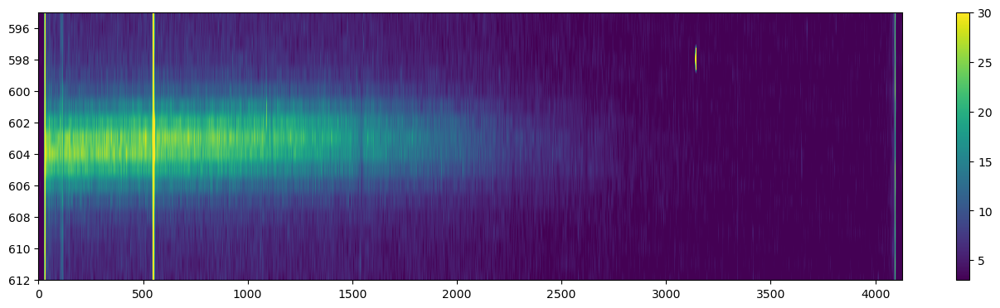

In [159]:
grism6_23 = zap_two(datadir, 23, ['b.0039', 'b.0040'], max_diff=40)
plot_limits_size(grism6_23, min = 3, max = 30, ytop = 595, ybottom = 612)

In [160]:
spectrum6_23 = grab_spectrum(np.flip(grism6_23, 1), 600, 606)
spectrum6_23 = spectrum6_23 / spectrum6_23[700:3000].max()
x = cal_wave_4th_order(spectrum6_23, poly4_params_aug23[0], poly4_params_aug23[1], poly4_params_aug23[2], poly4_params_aug23[3], poly4_params_aug23[4])
# plt.figure(figsize = (15, 5))
# plt.plot(x, spectrum6_23, linewidth = 0.5, color = 'k')
# plt.xlabel('Wavelength (Angstroms)')
# plt.ylim(-0.1, 1.2)
# lines(3900, 5500)
# plt.xlim(3900, 5500)

In [161]:
# plt.plot(spectrum6_23)
# left, right = 2970, 3070
# plt.xlim(left, right)
# plt.xticks(np.linspace(left, right, 7))
# plt.ylim(0, 1.2)

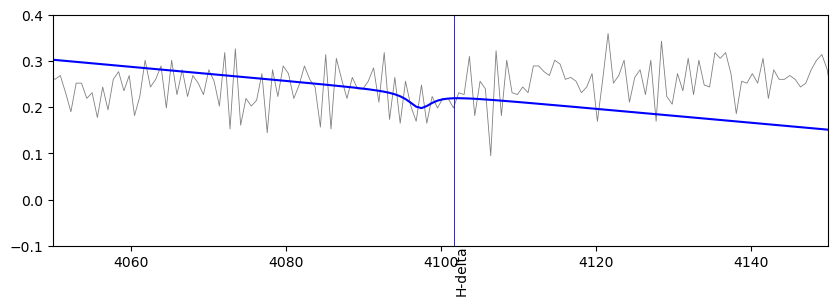

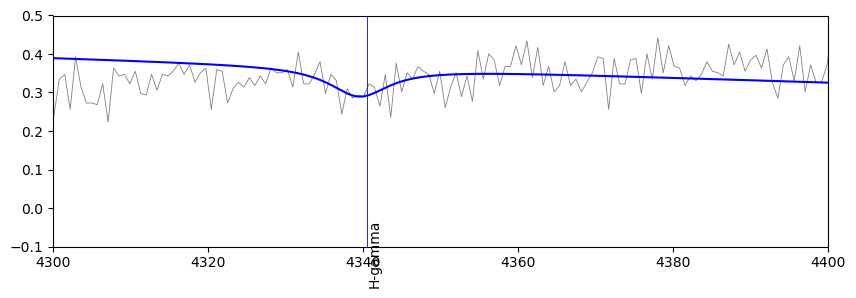

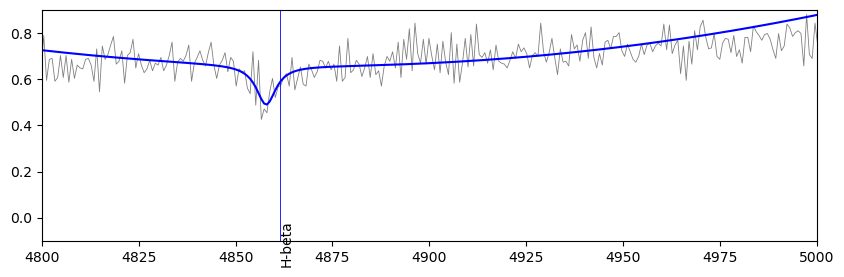

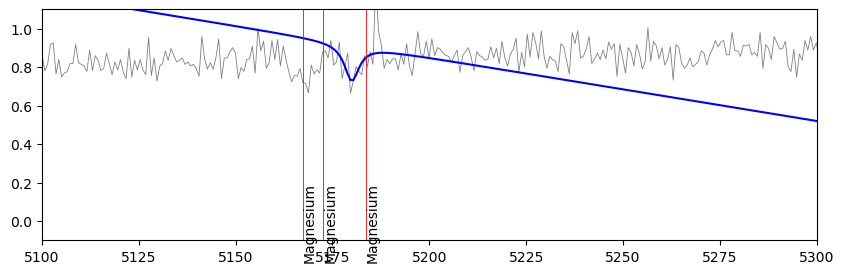

In [162]:
# aug6_23_heps = fit_lorentzian_lin(spectrum6_23, x, 1295, 1335, poly4_params_aug23, h_epsilon, xmin = 3900, xmax = 4000, ymax = 0.4, plot = True)
gcc6_23_hdelta = fit_lorentzian_lin(spectrum6_23, x, 1485, 1520, poly4_params_aug23, h_delta, xmin = 4050, xmax = 4150, ymax = 0.4, plot = True)
gcc6_23_hgamma = fit_lorentzian_lin(spectrum6_23, x, 1840, 1870, poly4_params_aug23, h_gamma, xmin = 4300, xmax = 4400, ymax = 0.5, plot = True)
gcc6_23_hbeta = fit_lorentzian_quad(spectrum6_23, x, 2530, 2630, poly4_params_aug23, h_beta, xmin = 4800, xmax = 5000, ymax = 0.9, plot = True)
gcc6_23_mag = fit_lorentzian_lin(spectrum6_23, x, 3020, 3045, poly4_params_aug23, magnesium, plot = True, xmin=5100, xmax=5300)
popt_gcc6_23, covar_gcc6_23 = opt.curve_fit(const, [0, 1, 2], [gcc6_23_hdelta[0], gcc6_23_hgamma[0], gcc6_23_hbeta[0]],
                                            sigma = [gcc6_23_hdelta[1], gcc6_23_hgamma[1], gcc6_23_hbeta[1]])

In [163]:
print('H-delta:',     gcc6_23_hdelta[0], '+-', gcc6_23_hdelta[1])
print('H-gamma:',     gcc6_23_hgamma[0], '+-', gcc6_23_hgamma[1])
print('H-beta:',      gcc6_23_hbeta[0], '+-',  gcc6_23_hbeta[1])
print('Magnesium:',   gcc6_23_mag[0], '+-',    gcc6_23_mag[1])
print(popt_gcc6_23, '+-', np.sqrt(covar_gcc6_23[0]))

H-delta: -323.17609940114903 +- 148.381237227014
H-gamma: -70.19204638536326 +- 89.37975223828487
H-beta: -214.8197339925753 +- 32.000164034813174
Magnesium: -209.4550930312869 +- 53.764917763430994
[-203.32823302] +- [36.16134186]


# GCC6 25

## Bias, zap, scale pixels

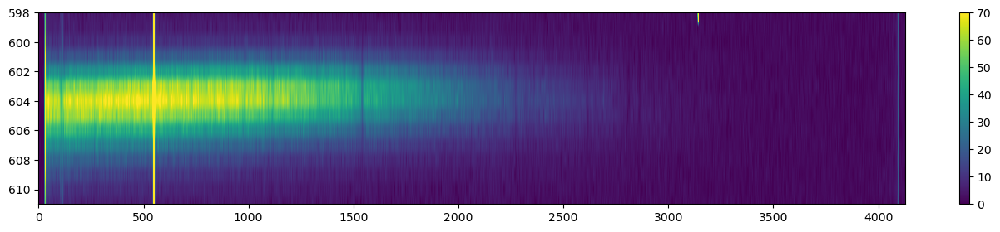

In [164]:
grism6_25 = min_zapping(datadir, 25, ['b.0135', 'b.0136'])
plot_limits_size(grism6_25, min = 0, max = 70, ytop = 598, ybottom = 611, figsizeheight = 3)

(3900.0, 5500.0)

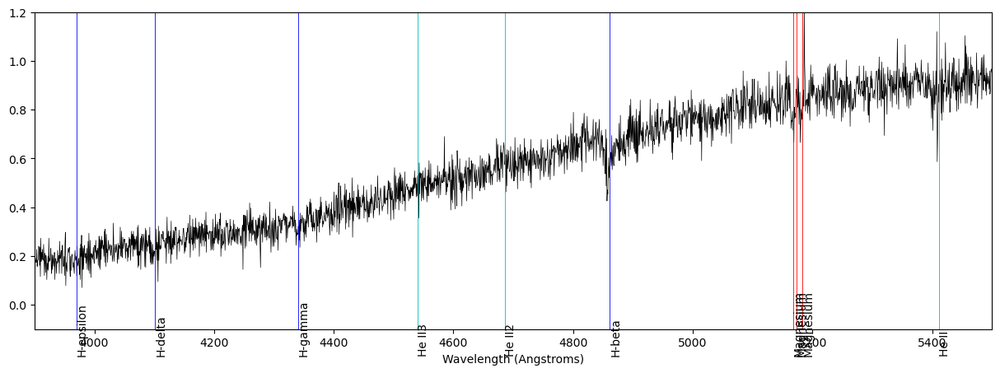

In [165]:
spectrum6_25 = grab_spectrum(np.flip(grism6_25, 1), 601, 607)
spectrum6_25 = spectrum6_25 / spectrum6_25[700:3000].max()

plt.figure(figsize = (15, 5))
plt.plot(x, spectrum6_23, linewidth = 0.5, color = 'k')
plt.xlabel('Wavelength (Angstroms)')
plt.ylim(-0.1, 1.2)
# lines(5100, 5500)
# plt.xlim(5100, 5500)
lines(3900, 5500)
plt.xlim(3900, 5500)

In [1]:
x_pixels_25to23 = cal_wave_4auto(spectrum6_25, params_pix_2523)
x_pixels_25to27 = cal_wave_4auto(spectrum6_25, params_pix_2527)
x_pixels_25to03 = cal_wave_4auto(spectrum6_25, params_pix_2503)

x_waves_25_from_23 = cal_wave_4auto_range(x_pixels_25to23, poly4_params_aug23)
x_waves_25_from_27 = cal_wave_4auto_range(x_pixels_25to27, poly4_params_aug27)
x_waves_25_from_03 = cal_wave_4auto_range(x_pixels_25to03, poly4_params_oct03)

NameError: name 'cal_wave_4auto' is not defined

## Absorption lines plots

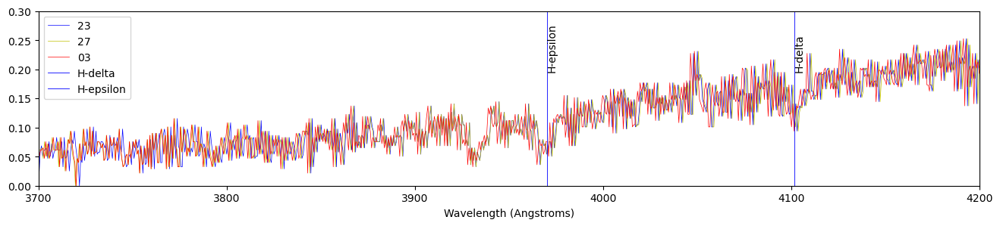

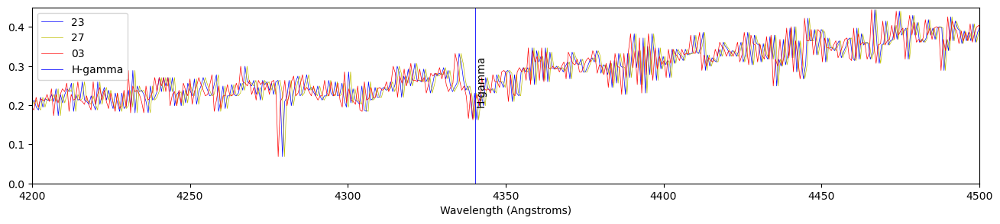

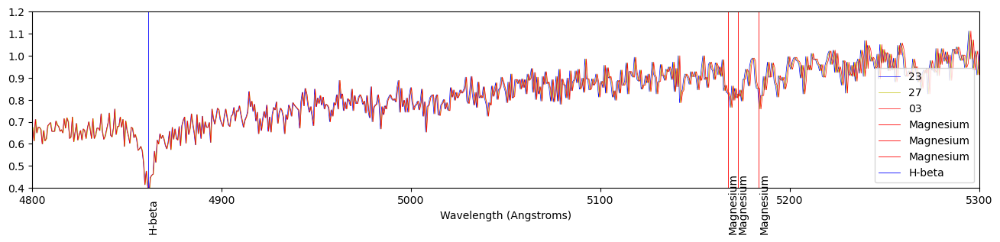

In [167]:
plt.figure(figsize = (16, 3))
plt.plot(x_waves_25_from_23, spectrum6_25, linewidth = 0.5, color = 'b', label='23')
plt.plot(x_waves_25_from_27, spectrum6_25, linewidth = 0.5, color = 'y', label='27')
plt.plot(x_waves_25_from_03, spectrum6_25, linewidth = 0.5, color = 'r', label='03')
plt.xlabel('Wavelength (Angstroms)')
plt.ylim(-0.1, 1.2)
lines(3700, 4200, 0.2)
plt.xlim(3700, 4200)
plt.ylim(0.0, 0.3)
plt.legend()

plt.figure(figsize = (16, 3))
plt.plot(x_waves_25_from_23, spectrum6_25, linewidth = 0.5, color = 'b', label='23')
plt.plot(x_waves_25_from_27, spectrum6_25, linewidth = 0.5, color = 'y', label='27')
plt.plot(x_waves_25_from_03, spectrum6_25, linewidth = 0.5, color = 'r', label='03')
plt.xlabel('Wavelength (Angstroms)')
plt.ylim(-0.1, 1.2)
lines(4200, 4500, 0.2)
plt.xlim(4200, 4500)
plt.ylim(0.0, 0.45)
plt.legend()

plt.figure(figsize = (16, 3))
plt.plot(x_waves_25_from_23, spectrum6_25, linewidth = 0.5, color = 'b', label='23')
plt.plot(x_waves_25_from_27, spectrum6_25, linewidth = 0.5, color = 'y', label='27')
plt.plot(x_waves_25_from_03, spectrum6_25, linewidth = 0.5, color = 'r', label='03')
plt.xlabel('Wavelength (Angstroms)')
plt.ylim(-0.1, 1.2)
lines(4800, 5300, 0.2)
plt.xlim(4800, 5300)
plt.ylim(0.4, 1.2)
plt.legend()

## Calculate Velocities

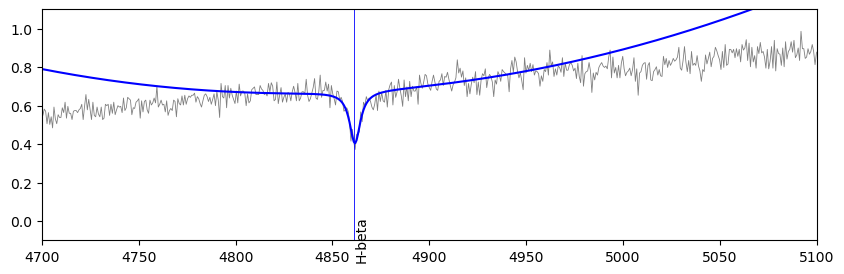

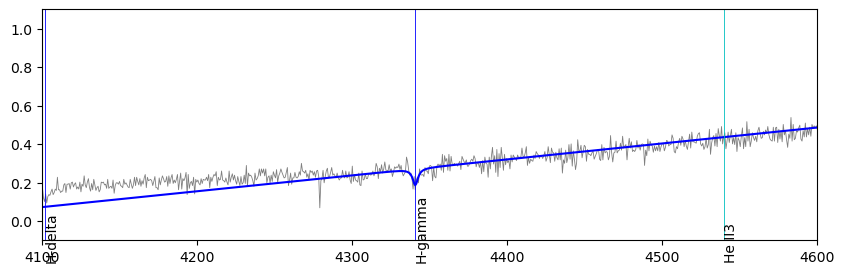

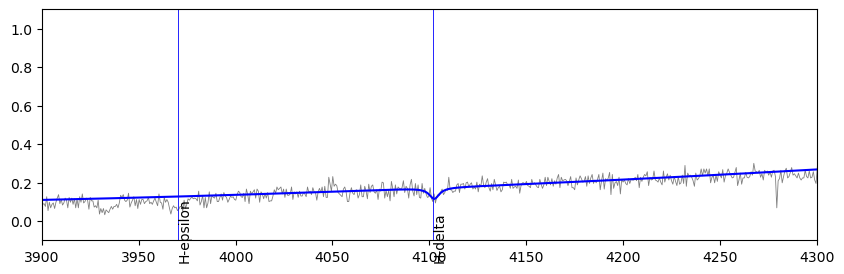

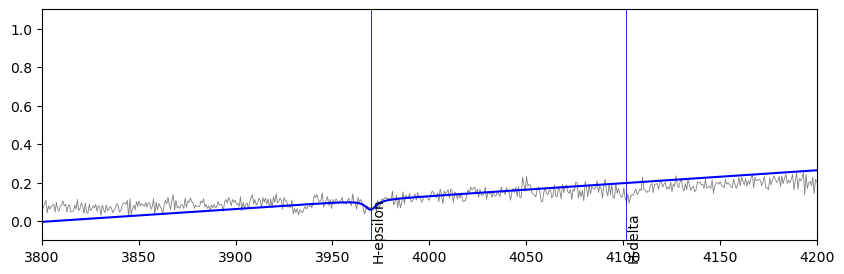

In [168]:
gcc6_25_23_mag =    fit_lorentzian_lin_no_arc(spectrum6_25, x_waves_25_from_23, 3020, 3080, poly4_params_aug23, params_pix_2523, magnesium, plot = False, xmin=5100, xmax=5300)
gcc6_25_23_hbeta =  fit_lorentzian_quad_no_arc(spectrum6_25, x_waves_25_from_23, 2500, 2700, poly4_params_aug23, params_pix_2523, h_beta, plot = True, xmin=4700, xmax=5100)
gcc6_25_23_hgamma = fit_lorentzian_lin_no_arc(spectrum6_25, x_waves_25_from_23, 1780, 1950, poly4_params_aug23, params_pix_2523, h_gamma, plot = True, xmin=4100, xmax=4600)
gcc6_25_23_hdelta = fit_lorentzian_quad_no_arc(spectrum6_25, x_waves_25_from_23, 1400, 1600, poly4_params_aug23, params_pix_2523, h_delta, plot = True, xmin=3900, xmax=4300) # 1200, 1700
gcc6_25_23_hepsilon = fit_lorentzian_lin_no_arc(spectrum6_25, x_waves_25_from_23, 1250, 1400, poly4_params_aug23, params_pix_2523, h_epsilon, plot = True, xmin=3800, xmax=4200)
popt_gcc6_25_23, covar_gcc6_25_23 = opt.curve_fit(const, np.linspace(0, 4, 5), [gcc6_25_23_hepsilon[0], gcc6_25_23_hdelta[0], gcc6_25_23_hgamma[0],
                                                                                gcc6_25_23_hbeta[0], gcc6_25_23_mag[0]],
                                            sigma = [gcc6_25_23_hepsilon[1], gcc6_25_23_hdelta[1], gcc6_25_23_hgamma[1],
                                                     gcc6_25_23_hbeta[1], gcc6_25_23_mag[1]])

gcc6_25_27_mag =    fit_lorentzian_lin_no_arc(spectrum6_25, x_waves_25_from_27, 3020, 3080, poly4_params_aug27, params_pix_2527, magnesium, plot = False, xmin=5000, xmax=5500)
gcc6_25_27_hbeta =  fit_lorentzian_quad_no_arc(spectrum6_25, x_waves_25_from_27, 2400, 2800, poly4_params_aug27, params_pix_2527, h_beta, plot = False, xmin=4700, xmax=5100)
gcc6_25_27_hgamma = fit_lorentzian_lin_no_arc(spectrum6_25, x_waves_25_from_27, 1780, 1950, poly4_params_aug27, params_pix_2527, h_gamma, plot = False, xmin=3900, xmax=4300)
gcc6_25_27_hdelta = fit_lorentzian_quad_no_arc(spectrum6_25, x_waves_25_from_27, 1400, 1600, poly4_params_aug27, params_pix_2527, h_delta, plot = False, xmin=4000, xmax=4300)
gcc6_25_27_hepsilon = fit_lorentzian_lin_no_arc(spectrum6_25, x_waves_25_from_27, 1250, 1400, poly4_params_aug27, params_pix_2527, h_epsilon, plot = False, xmin=3800, xmax=4200)
popt_gcc6_25_27, covar_gcc6_25_27 = opt.curve_fit(const, np.linspace(0, 4, 5), [gcc6_25_27_hepsilon[0], gcc3_25_27_hdelta[0], gcc3_25_27_hgamma[0],
                                                                                gcc6_25_27_hbeta[0], gcc6_25_27_mag[0]],
                                            sigma = [gcc6_25_27_hepsilon[1], gcc6_25_27_hdelta[1], gcc6_25_27_hgamma[1],
                                                     gcc6_25_27_hbeta[1], gcc6_25_27_mag[1]])

gcc6_25_03_mag =    fit_lorentzian_lin_no_arc(spectrum6_25, x_waves_25_from_03, 3020, 3080, poly4_params_oct03, params_pix_2503, magnesium, plot = False, xmin=5000, xmax=5500)
gcc6_25_03_hbeta =  fit_lorentzian_quad_no_arc(spectrum6_25, x_waves_25_from_03, 2400, 2800, poly4_params_oct03, params_pix_2503, h_beta, plot = False)
gcc6_25_03_hgamma = fit_lorentzian_lin_no_arc(spectrum6_25, x_waves_25_from_03, 1780, 1950, poly4_params_oct03, params_pix_2503, h_gamma, plot = False)
gcc6_25_03_hdelta = fit_lorentzian_quad_no_arc(spectrum6_25, x_waves_25_from_03, 1300, 1700, poly4_params_oct03, params_pix_2503, h_delta, plot = False, xmin=4000, xmax=4300)
gcc6_25_03_hepsilon = fit_lorentzian_lin_no_arc(spectrum6_25, x_waves_25_from_23, 1250, 1400, poly4_params_aug23, params_pix_2523, h_epsilon, plot = False, xmin=3800, xmax=4200)
popt_gcc6_25_03, covar_gcc6_25_03 = opt.curve_fit(const, np.linspace(0, 4, 5), [gcc6_25_03_hepsilon[0], gcc6_25_03_hdelta[0], gcc6_25_03_hgamma[0],
                                                                                gcc6_25_03_hbeta[0], gcc6_25_03_mag[0]],
                                            sigma = [gcc6_25_03_hepsilon[1], gcc6_25_03_hdelta[1], gcc6_25_03_hgamma[1],
                                                     gcc6_25_03_hbeta[1], gcc6_25_03_mag[1]])

## Print Velocities

In [169]:
print('H-epsilon:',   gcc6_25_23_hepsilon[0], '+-', gcc6_25_23_hepsilon[1])
print('H-delta:',     gcc6_25_23_hdelta[0], '+-',   gcc6_25_23_hdelta[1])
print('H-gamma:',     gcc6_25_23_hgamma[0], '+-',   gcc6_25_23_hgamma[1])
print('H-beta:',      gcc6_25_23_hbeta[0], '+-',    gcc6_25_23_hbeta[1])
print('Magnesium:',   gcc6_25_23_mag[0], '+-',      gcc6_25_23_mag[1])
print(popt_gcc6_25_23, '+-', np.sqrt(covar_gcc6_25_23[0]))
print('')
print('H-epsilon:',   gcc6_25_27_hepsilon[0], '+-', gcc6_25_27_hepsilon[1])
print('H-delta:',     gcc6_25_27_hdelta[0], '+-',   gcc6_25_27_hdelta[1])
print('H-gamma:',     gcc6_25_27_hgamma[0], '+-',   gcc6_25_27_hgamma[1])
print('H-beta:',      gcc6_25_27_hbeta[0], '+-',    gcc6_25_27_hbeta[1])
print('Magnesium:',   gcc6_25_27_mag[0], '+-',      gcc6_25_27_mag[1])
print(popt_gcc6_25_27, '+-', np.sqrt(covar_gcc6_25_27[0]))
print('')
print('H-epsilon:',   gcc6_25_03_hepsilon[0], '+-', gcc6_25_03_hepsilon[1])
print('H-delta:',     gcc6_25_03_hdelta[0], '+-',   gcc6_25_03_hdelta[1])
print('H-gamma:',     gcc6_25_03_hgamma[0], '+-',   gcc6_25_03_hgamma[1])
print('H-beta:',      gcc6_25_03_hbeta[0], '+-',    gcc6_25_03_hbeta[1])
print('Magnesium:',   gcc6_25_03_mag[0], '+-',      gcc6_25_03_mag[1])
print(popt_gcc6_25_03, '+-', np.sqrt(covar_gcc6_25_03[0]))

H-epsilon: -23.36035685275551 +- 61.039968834441154
H-delta: 59.1655363949618 +- 52.26048931744872
H-gamma: 32.62033430261029 +- 32.79677248793969
H-beta: 14.886922623151275 +- 16.166694352305974
Magnesium: 28.80585352736158 +- 17.077122330060227
[22.84237306] +- [6.54028081]

H-epsilon: -5.511463936665259 +- 61.3600896720785
H-delta: 104.48589249625351 +- 52.331131420047356
H-gamma: 72.48937480156651 +- 32.76511012450277
H-beta: 40.118698108309225 +- 18.469331586235196
Magnesium: 54.93847132102552 +- 17.074049538760143
[60.11969494] +- [17.13976941]

H-epsilon: -23.36035685275551 +- 61.039968834441154
H-delta: -59.67779211416235 +- 61.864291270381855
H-gamma: -53.89020162739573 +- 32.87197782111299
H-beta: 28.253816142011217 +- 18.51919759500574
Magnesium: 84.4705728206541 +- 17.110939414668913
[38.42023108] +- [24.67885536]


# Oct GC 1

In [170]:
zap_1_oct03 = zap_two(octdir, '03', ['b.0221', 'b.0223'], yearmonth = 2310, max_diff=20)

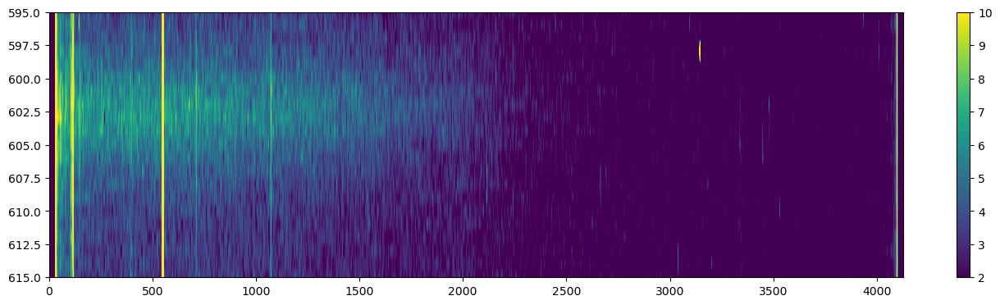

In [171]:
plot_limits_size(zap_1_oct03, min = 2, max = 10, ytop = 595, ybottom = 615)

(3900.0, 5300.0)

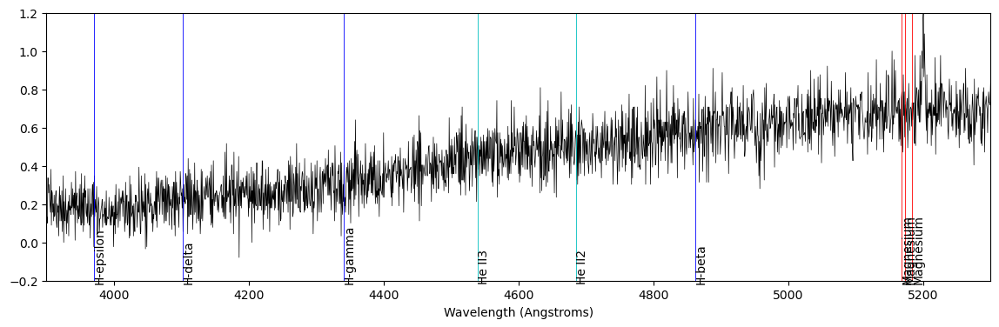

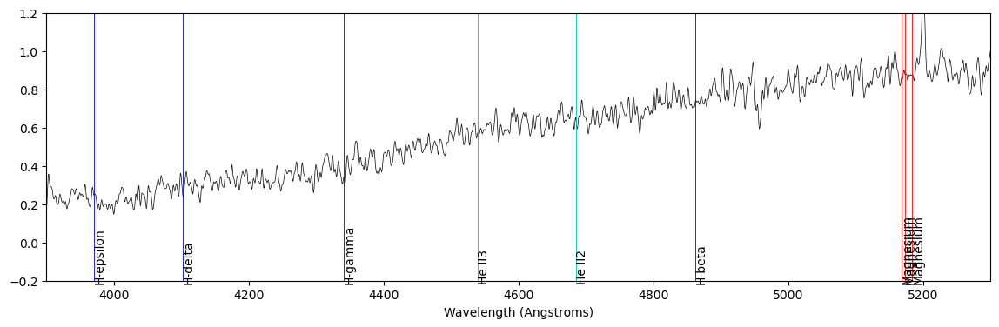

In [291]:
spectrum1_oct = grab_spectrum(np.flip(zap_1_oct03, 1), 599, 605)
spectrum1_oct = spectrum1_oct / spectrum1_oct[700: 3000].max()
x = cal_wave_4th_order(spectrum1_oct, poly4_params_oct03[0], poly4_params_oct03[1], poly4_params_oct03[2], poly4_params_oct03[3], poly4_params_oct03[4])
plt.figure(figsize = (14, 4))
plt.plot(x, spectrum1_oct / spectrum1_oct[700:3000].max(), linewidth = 0.5, color = 'k')
plt.ylim(-0.2, 1.2)
plt.xlabel('Wavelength (Angstroms)')
lines(3900, 5300)
plt.xlim(3900, 5300)

spectrum1_oct_smoothed = gauss_smooth(spectrum1_oct, 1.6)
plt.figure(figsize = (14, 4))
plt.plot(x, spectrum1_oct_smoothed / spectrum1_oct_smoothed[700:3000].max(), linewidth = 0.5, color = 'k')
plt.ylim(-0.2, 1.2)
plt.xlabel('Wavelength (Angstroms)')
lines(3900, 5300)
plt.xlim(3900, 5300)

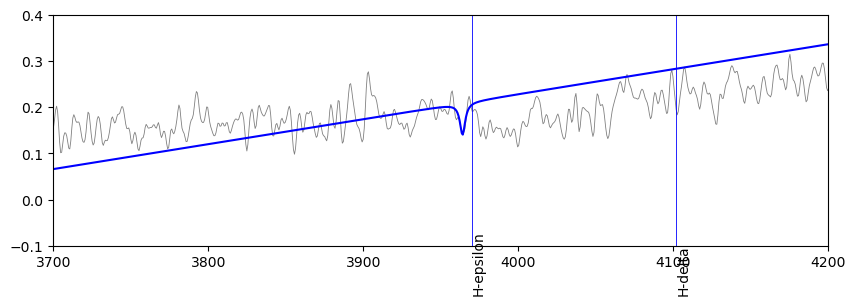

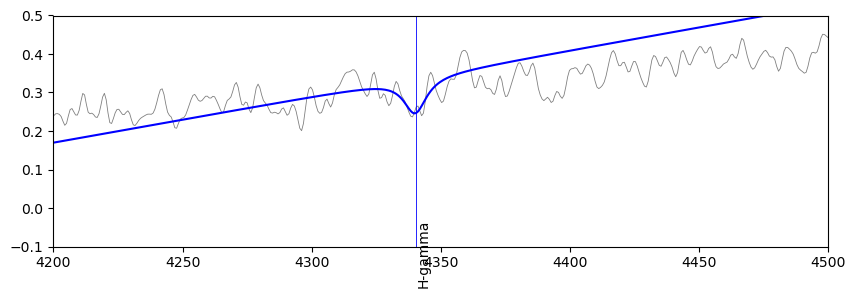

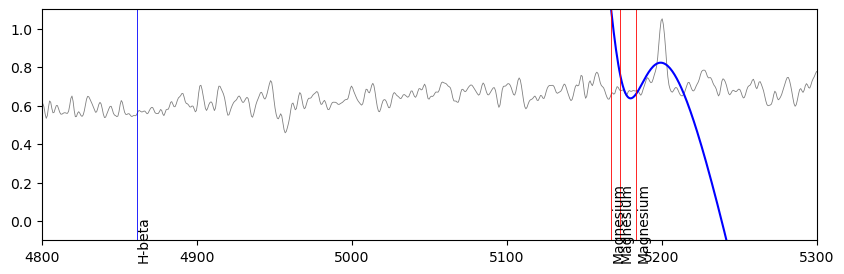

In [173]:
oct1_heps = fit_lorentzian_lin(spectrum1_oct_smoothed, x, 1300, 1330, poly4_params_oct03, h_epsilon, xmin = 3700, xmax = 4200, ymax = 0.4, plot = True)
# oct1_hdelta = fit_lorentzian_lin(spectrum1_oct_smoothed, x, 1480, 1540, poly4_params_oct03, h_delta, xmin = 4000, xmax = 4300, ymax = 0.4, plot = True)
oct1_hgamma = fit_lorentzian_lin(spectrum1_oct_smoothed, x, 1835, 1895, poly4_params_oct03, h_gamma, xmin = 4200, xmax = 4500, ymax = 0.5, plot = True)
# oct1_hbeta = fit_lorentzian_lin(spectrum1_oct_smoothed, x, 2500, 2700, poly4_params_oct03, h_beta, xmin = 4700, xmax = 5100, ymax = 1, plot = True)
oct1_mag = fit_lorentzian_lin(spectrum1_oct_smoothed, x, 3020, 3080, poly4_params_oct03, magnesium, xmin = 4800, xmax = 5300, ymax = 1.1, plot = True)

In [174]:
print('H-epsilon:', oct1_heps[0], '+-', oct1_heps[1])
# print('H-delta:', oct1_hdelta[0], '+-', oct1_hdelta[1])
print('H-gamma:', oct1_hgamma[0], '+-', oct1_hgamma[1])
# print('H-beta:', oct1_hbeta[0], '+-', oct1_hbeta[1])

# popt_oct1, covar_oct1 = opt.curve_fit(const, np.linspace(0, 3, 4), [oct1_heps[0], oct1_hdelta[0], oct1_hgamma[0], oct1_hbeta[0]], sigma = [oct1_heps[1], oct1_hdelta[1], oct1_hgamma[1], oct1_hbeta[1]])
# print(popt_oct1, '+-', np.sqrt(covar_oct1[0]))

H-epsilon: -465.1793592522531 +- 25.10253871659822
H-gamma: -33.03073500826659 +- 55.58997908507815


# Oct GC 2

In [175]:
grism2_oct03 = zap_two(octdir, '03', ['b.0232', 'b.0234'], yearmonth = 2310, max_diff=115)

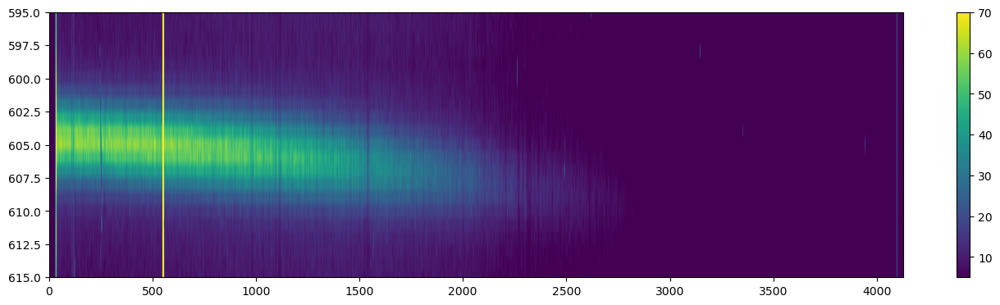

In [176]:
plot_limits_size(grism2_oct03, min = 5, max = 70, ytop = 595, ybottom = 615)

In [295]:
spectrum2_oct = grab_spectrum(np.flip(grism2_oct03, 1), 601, 611)
spectrum2_oct = spectrum2_oct / spectrum2_oct[700:3000].max()
x_gcc2_03 = cal_wave_4th_order(spectrum2_oct, poly4_params_oct03[0], poly4_params_oct03[1], poly4_params_oct03[2], poly4_params_oct03[3], poly4_params_oct03[4])

plt.figure(figsize = (14, 4))
# plt.plot(x, spectrum2_oct, linewidth = 0.5, color = 'k')
# plt.ylim(-0.2, 1.2)
# plt.xlabel('Wavelength (Angstroms)')
# lines(3900, 5300)
# plt.xlim(3900, 5300)

spectrum2_oct_smoothed = gauss_smooth(spectrum2_oct, 1.0)

# plt.figure(figsize = (14, 4))
# plt.plot(x, spectrum2_oct_smoothed / spectrum2_oct_smoothed[700:3000].max(), linewidth = 0.5, color = 'k')
# plt.ylim(-0.2, 1.2)
# plt.xlabel('Wavelength (Angstroms)')
# lines(3900, 5300)
# plt.xlim(3900, 5300)

# plt.axvline(3933.7)

<Figure size 1400x400 with 0 Axes>

In [178]:
green_params03_2, green_covar03_2 = opt.curve_fit(Lorentzian_lin, np.arange(3550, 3600), spectrum2_oct[3550: 3600], p0 = [0, 2, 3575, 0, 1])
# A, sigma, center, c, d
# print(green_params23_2, np.sqrt(green_covar23_2[2][2]))
green03_2_pixel = green_params03_2[2]
green_params03_2, green_covar03_2 = opt.curve_fit(Lorentzian_lin, np.arange(5565, 5585), spectrum2_oct[3565: 3585], p0 = [0, 2, 5575, 0, 1])
green03_2_wave = green_params03_2[2]
print(green_params03_2, np.sqrt(green_covar03_2[2][2]))

[-7.49780808e+00  2.53476179e+00  5.57682827e+03 -1.75034573e-02
  9.82694736e+01] 0.09506124128804382


In [179]:
print(calc_velo(green_params03_2[2], O_I))

-27.436316887130648


In [180]:
# plt.figure(figsize = (15, 3))
# plt.plot(x, spectrum2_oct, linewidth = 0.5, color = 'k')
# plt.plot(np.arange(5550, 5600), Lorentzian_lin(np.arange(5550, 5600), green_params03_2[0], green_params03_2[1], green_params03_2[2], green_params03_2[3], green_params03_2[4]), color = 'b')
# plt.xlabel('Wavelength (Angstroms)')
# plt.ylim(0, 9)
# # plt.xlim(3500, 3800)
# # lines(5300, 5700)
# plt.xlim(5550, 5600)

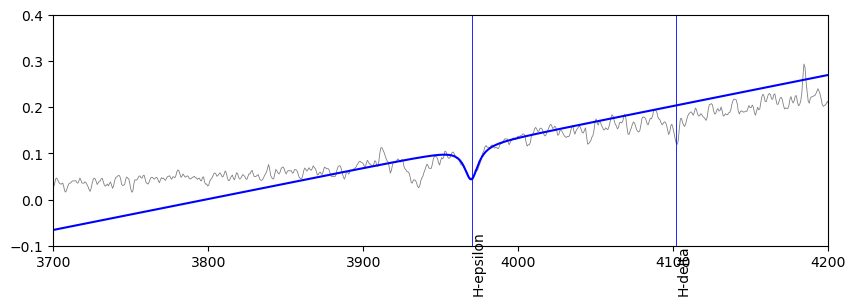

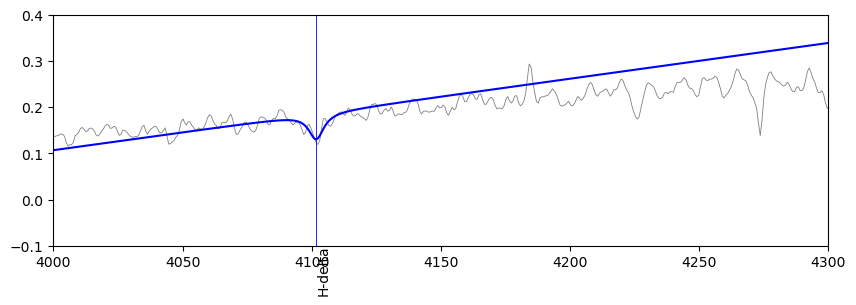

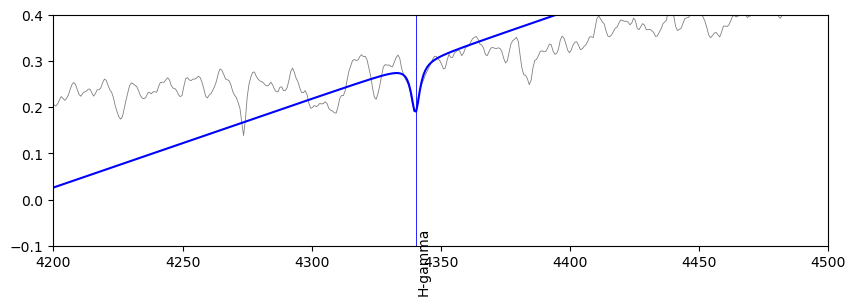

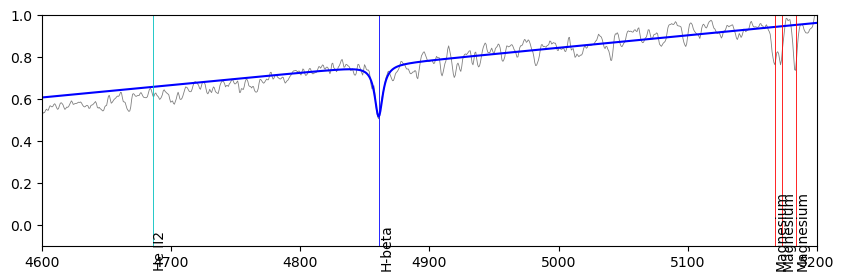

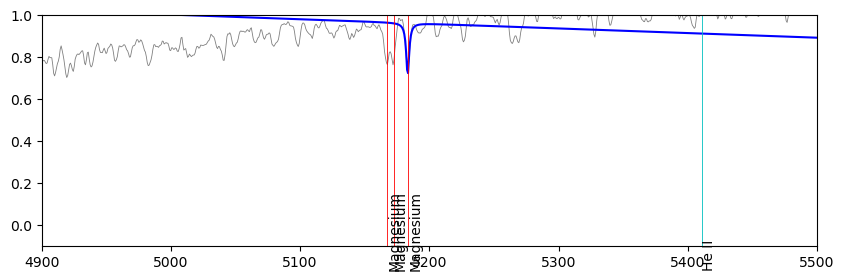

In [181]:
oct2_heps = fit_lorentzian_lin(spectrum2_oct_smoothed, x_gcc2_03, 1300, 1400, poly4_params_oct03, h_epsilon, xmin = 3700, xmax = 4200, ymax = 0.4, plot = True)
oct2_hdelta = fit_lorentzian_lin(spectrum2_oct_smoothed, x_gcc2_03, 1480, 1540, poly4_params_oct03, h_delta, xmin = 4000, xmax = 4300, ymax = 0.4, plot = True)
oct2_hgamma = fit_lorentzian_lin(spectrum2_oct_smoothed, x_gcc2_03, 1800, 1890, poly4_params_oct03, h_gamma, xmin = 4200, xmax = 4500, ymax = 0.4, plot = True)
oct2_hbeta = fit_lorentzian_lin(spectrum2_oct_smoothed, x_gcc2_03, 2500, 2800, poly4_params_oct03, h_beta, xmin = 4600, xmax = 5200, ymax = 1, plot = True)
oct2_mag = fit_lorentzian_lin(spectrum2_oct_smoothed, x_gcc2_03, 3020, 3080, poly4_params_oct03, magnesium, xmin = 4900, xmax = 5500, ymax = 1, plot = True)

In [182]:
print('H-epsilon:', oct2_heps[0], '+-', oct2_heps[1])
print('H-delta:', oct2_hdelta[0], '+-', oct2_hdelta[1])
print('H-gamma:', oct2_hgamma[0], '+-', oct2_hgamma[1])
print('H-beta:', oct2_hbeta[0], '+-', oct2_hbeta[1])
print('Magnesium:', oct2_mag[0], '+-', oct2_mag[1])

popt_oct2, covar_oct2 = opt.curve_fit(const, np.linspace(0, 4, 5), [oct2_heps[0], oct2_hdelta[0], oct2_hgamma[0], oct2_hbeta[0], oct2_mag[0]], sigma = [oct2_heps[1], oct2_hdelta[1], oct2_hgamma[1], oct2_hbeta[1], oct2_mag[1]])
print(popt_oct2, '+-', np.sqrt(covar_oct2[0]))

H-epsilon: -41.12707387999205 +- 16.655948018846747
H-delta: -0.45097728479751736 +- 27.194348765380894
H-gamma: -23.851563586169505 +- 23.091925805050884
H-beta: -34.838484632644224 +- 13.862015305495294
Magnesium: -21.183276654652765 +- 9.17500034334
[-26.19772237] +- [5.00607517]


In [183]:
# print(green03_2_pixel, green23_2_pixel)

In [184]:
# BD03_green_pix = green03_2_pixel
# BD03_green_wave = green03_2_wave

# BD23_green_pix = green23_2_pixel
# BD23_green_wave = green23_2_wave

# pix23 = [BD23_hdelta_pix, BD23_hgamma_pix, BD23_HeII2_pix, BD23_hbeta_pix, BD23_HeII_pix, BD23_green_pix]
# wave23 = [BD23_hdelta_wave, BD23_hgamma_wave, BD23_HeII2_wave, BD23_hbeta_wave, BD23_HeII_wave, BD23_green_wave]

# pix03 = [BD03_hdelta_pix, BD03_hgamma_pix, BD03_HeII2_pix, BD03_hbeta_pix, BD03_HeII_pix, BD03_green_pix]
# wave03 = [BD03_hdelta_wave, BD03_hgamma_wave, BD03_HeII2_wave, BD03_hbeta_wave, BD03_HeII_wave, BD03_green_wave]

# # Calculate the difference between the wavelengths of the calibration star absorption lines
# # on aug23 vs oct3, each after having been calibrated using their respective days' arcs
# diff_wave2303 = np.array(wave23) - np.array(wave03)

In [185]:
# plt.figure(figsize = (8, 4))
# plt.scatter(pix23, diff_wave2303)
# plt.plot(xpix23, delta_lambda2303)
# # plt.scatter(pix23, diff_wave2303)
# # plt.plot(xpix23, delta_lambda2303)
# plt.xlim(1400, 4000)
# plt.ylabel('Angstroms')
# plt.xlabel('Pixels')
# plt.title('Difference of absorption line wavelengths (23/03) vs pixel')

# Oct GC 3

In [186]:
zap_3_oct03 = zap_two(octdir, '03', ['b.0252', 'b.0253'], yearmonth = 2310, max_diff=50)

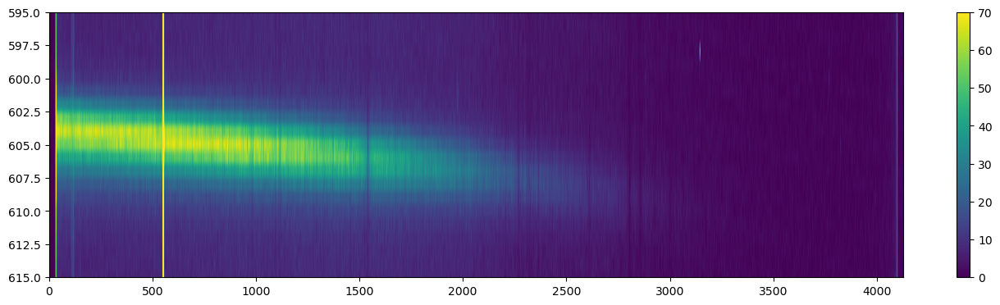

In [187]:
plot_limits_size(zap_3_oct03, min = 0, max = 70, ytop = 595, ybottom = 615)

In [188]:
spectrum3_oct = grab_spectrum(np.flip(zap_3_oct03, 1), 602, 610)
spectrum3_oct = spectrum3_oct / spectrum3_oct[700:3000].max()
x = cal_wave_4th_order(spectrum3_oct, poly4_params_oct03[0], poly4_params_oct03[1], poly4_params_oct03[2], poly4_params_oct03[3], poly4_params_oct03[4])
# plt.figure(figsize = (14, 4))
# plt.plot(x, spectrum3_oct, linewidth = 0.5, color = 'k')
# plt.ylim(-0.2, 1.2)
# plt.xlabel('Wavelength (Angstroms)')
# lines(xmin = 3500, xmax = 6000)
# plt.xlim(3500, 6000)

spectrum3_oct_smoothed = gauss_smooth(spectrum3_oct, 0.2)
# plt.figure(figsize = (14, 4))
# plt.plot(x, spectrum3_oct_smoothed / spectrum3_oct_smoothed[700:3000].max(), linewidth = 0.5, color = 'k')
# plt.ylim(-0.2, 1.2)
# plt.xlabel('Wavelength (Angstroms)')
# lines(3900, 5300)
# plt.xlim(3900, 5300)

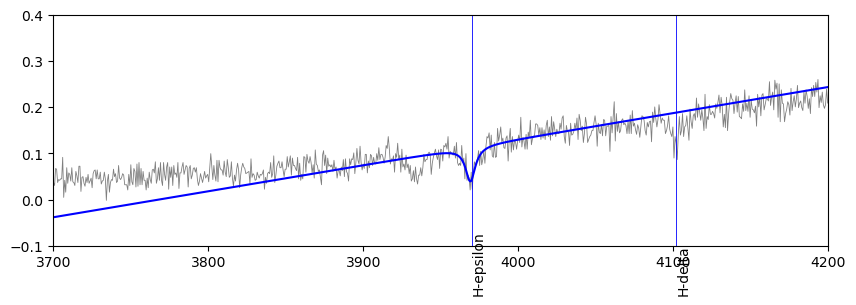

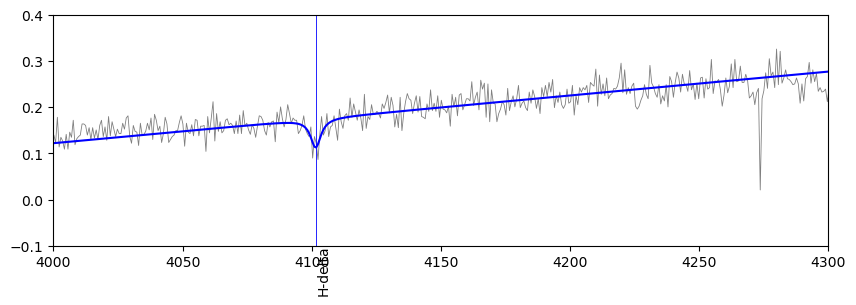

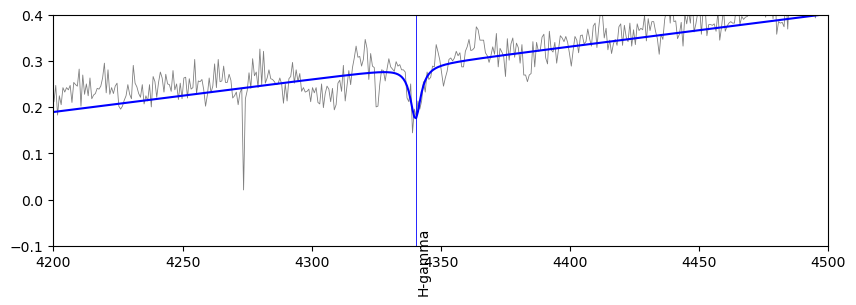

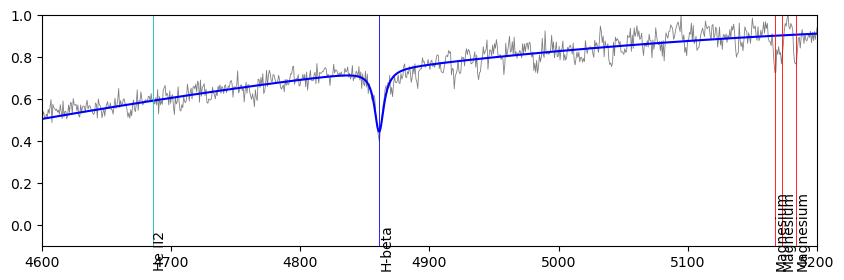

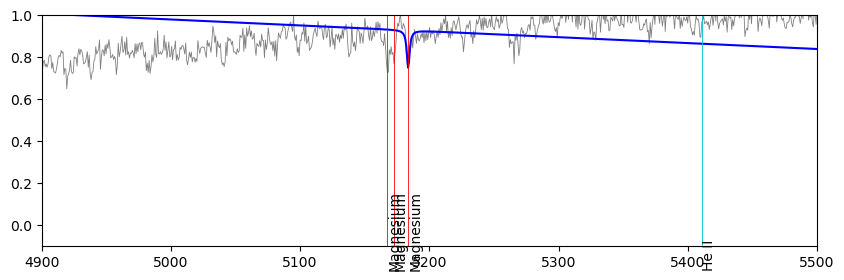

In [189]:
oct3_heps = fit_lorentzian_lin(spectrum3_oct_smoothed, x, 1200, 1400, poly4_params_oct03, h_epsilon, xmin = 3700, xmax = 4200, ymax = 0.4, plot = True)
oct3_hdelta = fit_lorentzian_lin(spectrum3_oct_smoothed, x, 1480, 1540, poly4_params_oct03, h_delta, xmin = 4000, xmax = 4300, ymax = 0.4, plot = True)
oct3_hgamma = fit_lorentzian_lin(spectrum3_oct_smoothed, x, 1840, 1880, poly4_params_oct03, h_gamma, xmin = 4200, xmax = 4500, ymax = 0.4, plot = True)
oct3_hbeta = fit_lorentzian_quad(spectrum3_oct_smoothed, x, 2400, 2800, poly4_params_oct03, h_beta, xmin = 4600, xmax = 5200, ymax = 1, plot = True)
oct3_mag = fit_lorentzian_lin(spectrum3_oct_smoothed, x, 3020, 3080, poly4_params_oct03, magnesium, xmin = 4900, xmax = 5500, ymax = 1, plot = True)

In [190]:
print('H-epsilon:', oct3_heps[0], '+-', oct3_heps[1])
print('H-delta:', oct3_hdelta[0], '+-', oct3_hdelta[1])
print('H-gamma:', oct3_hgamma[0], '+-', oct3_hgamma[1])
print('H-beta:', oct3_hbeta[0], '+-', oct3_hbeta[1])
print('Magnesium:', oct3_mag[0], '+-', oct3_mag[1])

popt_oct3, covar_oct3 = opt.curve_fit(const, np.linspace(0, 4, 5), [oct3_heps[0], oct3_hdelta[0], oct3_hgamma[0], oct3_hbeta[0], oct3_mag[0]], sigma = [oct3_heps[1], oct3_hdelta[1], oct3_hgamma[1], oct3_hbeta[1], oct3_mag[1]])
print(popt_oct3, '+-', np.sqrt(covar_oct3[0]))

H-epsilon: -81.21752528602727 +- 39.00336075642906
H-delta: -16.673481166029397 +- 34.5769143912599
H-gamma: -23.1240373191155 +- 24.725111963292235
H-beta: -13.13751226557602 +- 15.487485522376819
Magnesium: 3.187249168780645 +- 12.789596304623267
[-10.47162795] +- [9.41374934]


# Oct GC 4

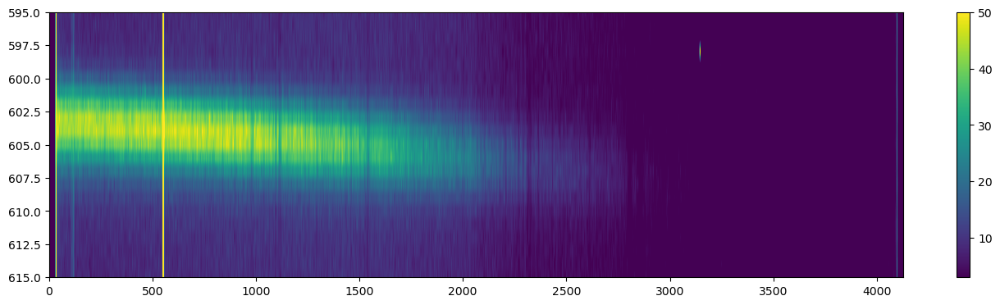

In [191]:
# zap_4_oct03 = zap_two(octdir, '03', ['b.0256', 'b.0257', 'b.0258'], yearmonth = 2310, max_diff=50)
zap_4_oct03 = zap_median(octdir, '03', ['b.0256', 'b.0257', 'b.0258'], yearmonth = 2310)
plot_limits_size(zap_4_oct03, min = 3, max = 50, ytop = 595, ybottom = 615)

In [192]:
spectrum4_oct = grab_spectrum(np.flip(zap_4_oct03, 1), 601, 607)
spectrum4_oct = spectrum4_oct / spectrum4_oct[700:3000].max()
x = cal_wave_4th_order(spectrum4_oct, poly4_params_oct03[0], poly4_params_oct03[1], poly4_params_oct03[2], poly4_params_oct03[3], poly4_params_oct03[4])
# plt.figure(figsize = (14, 4))
# plt.plot(x, spectrum4_oct, linewidth = 0.5, color = 'k')
# plt.ylim(-0.2, 1.2)
# plt.xlabel('Wavelength (Angstroms)')
# lines()
# plt.xlim(3500, 6000)

spectrum4_oct_smoothed = gauss_smooth(spectrum4_oct, 1.0)
# plt.figure(figsize = (14, 4))
# plt.plot(x, spectrum3_oct_smoothed / spectrum3_oct_smoothed[700:3000].max(), linewidth = 0.5, color = 'k')
# plt.ylim(-0.2, 1.2)
# plt.xlabel('Wavelength (Angstroms)')
# lines(3900, 5300)
# plt.xlim(3900, 5300)

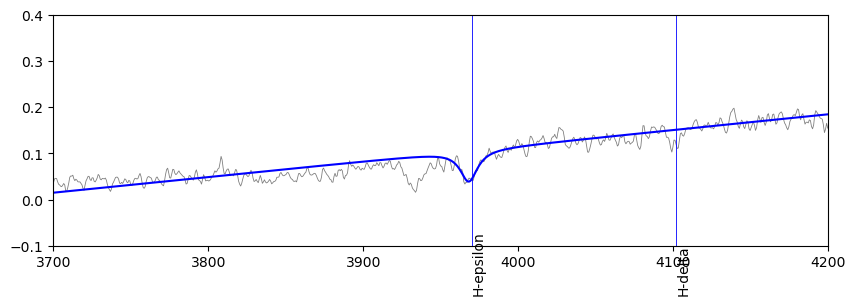

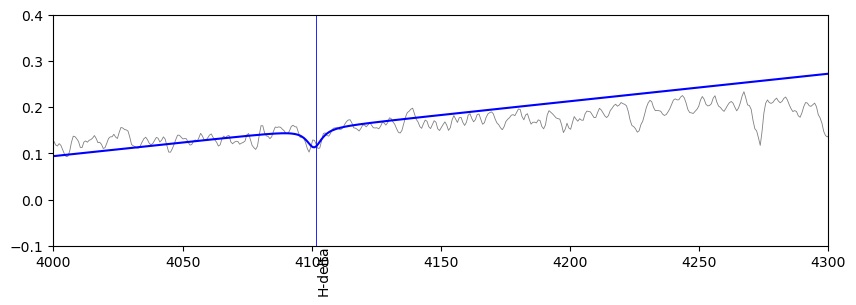

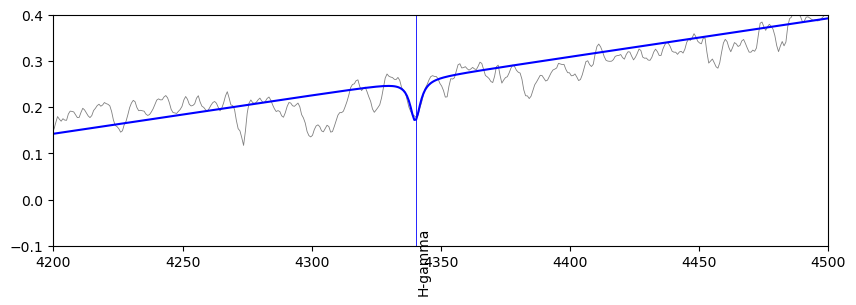

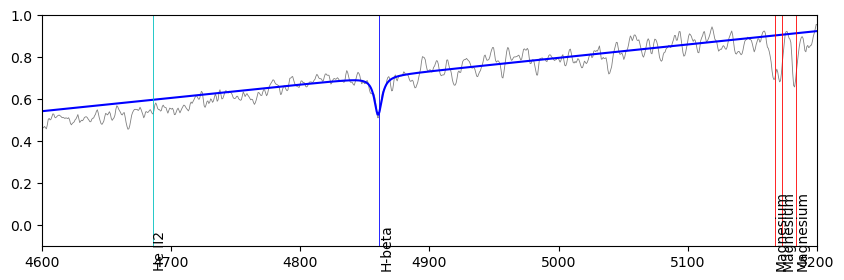

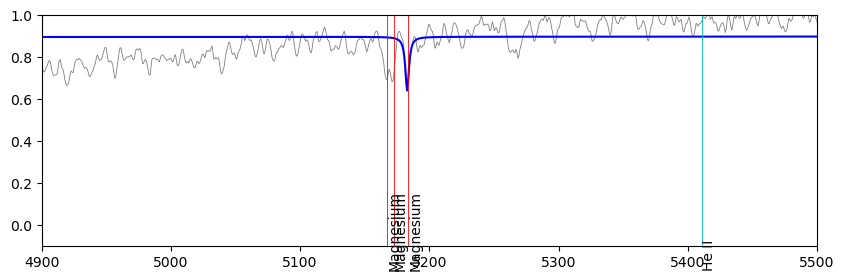

In [193]:
# plot_pix(spectrum4_oct)
oct4_heps = fit_lorentzian_lin(spectrum4_oct_smoothed, x, 1300, 1450, poly4_params_oct03, h_epsilon, xmin = 3700, xmax = 4200, ymax = 0.4, plot = True)
oct4_hdelta = fit_lorentzian_lin(spectrum4_oct_smoothed, x, 1480, 1550, poly4_params_oct03, h_delta, xmin = 4000, xmax = 4300, ymax = 0.4, plot = True)
oct4_hgamma = fit_lorentzian_lin(spectrum4_oct_smoothed, x, 1840, 1890, poly4_params_oct03, h_gamma, xmin = 4200, xmax = 4500, ymax = 0.4, plot = True)
oct4_hbeta = fit_lorentzian_lin(spectrum4_oct_smoothed, x, 2550, 2650, poly4_params_oct03, h_beta, xmin = 4600, xmax = 5200, ymax = 1, plot = True)
oct4_mag = fit_lorentzian_lin(spectrum4_oct_smoothed, x, 3020, 3080, poly4_params_oct03, magnesium, xmin = 4900, xmax = 5500, ymax = 1, plot = True)

In [194]:
print('H-epsilon:', oct4_heps[0], '+-', oct4_heps[1])
print('H-delta:', oct4_hdelta[0], '+-', oct4_hdelta[1])
print('H-gamma:', oct4_hgamma[0], '+-', oct4_hgamma[1])
print('H-beta:', oct4_hbeta[0], '+-', oct4_hbeta[1])
print('H-beta:', oct4_mag[0], '+-', oct4_mag[1])

popt_oct4, covar_oct4 = opt.curve_fit(const, np.linspace(0, 4, 5), [oct4_heps[0], oct4_hdelta[0], oct4_hgamma[0], oct4_hbeta[0], oct4_mag[0]], sigma = [oct4_heps[1], oct4_hdelta[1], oct4_hgamma[1], oct4_hbeta[1], oct4_mag[1]])
print(popt_oct4, '+-', np.sqrt(covar_oct4[0]))

H-epsilon: -159.68536576842936 +- 32.95432810285843
H-delta: -60.571495171370174 +- 36.92581885255975
H-gamma: -30.881001907546228 +- 22.070507045078486
H-beta: -62.82772360251337 +- 16.917131836067984
H-beta: -45.05369241158193 +- 10.013514041557132
[-53.78450189] +- [13.48032971]


# Oct GC 5

In [195]:
zap_5_oct03 = zap_median(octdir, '03', ['b.0261', 'b.0262', 'b.0263'], yearmonth = 2310)
# plot_limits_size(zap_5_oct03, min = 5, max = 50, ytop = 595, ybottom = 615)

In [196]:
spectrum5_oct = grab_spectrum(np.flip(zap_5_oct03, 1), 600, 607)
spectrum5_oct = spectrum5_oct / spectrum5_oct[700:3000].max()
x = cal_wave_4th_order(spectrum5_oct, poly4_params_oct03[0], poly4_params_oct03[1], poly4_params_oct03[2], poly4_params_oct03[3], poly4_params_oct03[4])
# plt.figure(figsize = (14, 4))
# plt.plot(x, spectrum5_oct, linewidth = 0.5, color = 'k')
# plt.ylim(-0.2, 1.2)
# plt.xlabel('Wavelength (Angstroms)')
# lines(3800, 5500)
# plt.xlim(3800, 5500)

spectrum5_oct_smoothed = gauss_smooth(spectrum5_oct, 1.0)
# plt.figure(figsize = (14, 4))
# plt.plot(x, spectrum3_oct_smoothed / spectrum3_oct_smoothed[700:3000].max(), linewidth = 0.5, color = 'k')
# plt.ylim(-0.2, 1.2)
# plt.xlabel('Wavelength (Angstroms)')
# lines(3900, 5300)
# plt.xlim(3900, 5300)

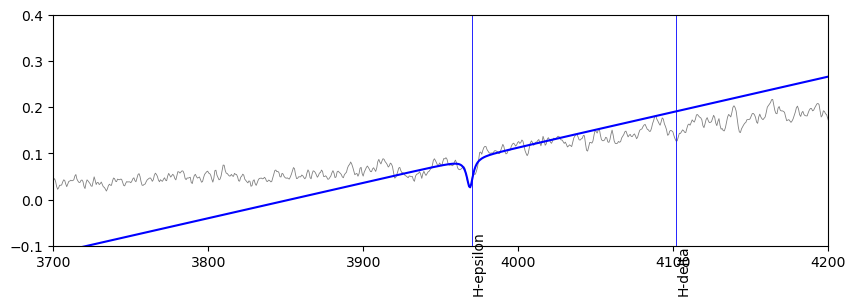

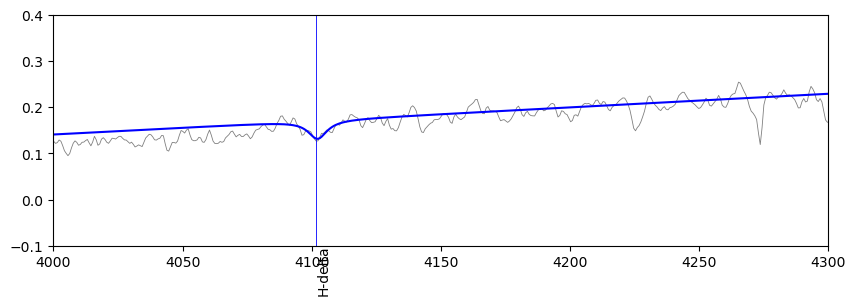

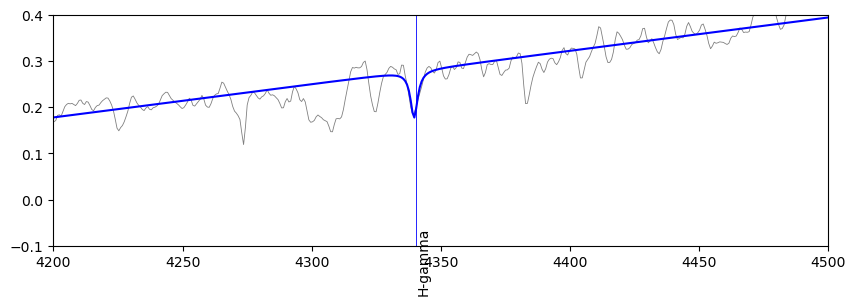

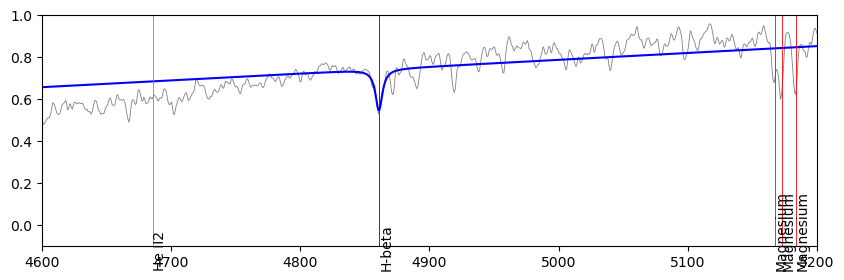

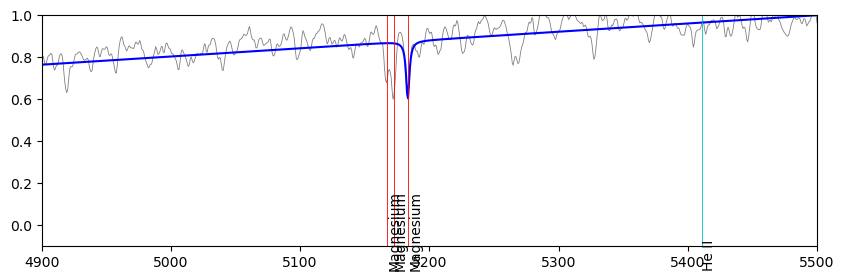

In [197]:
oct5_heps = fit_lorentzian_lin(spectrum5_oct_smoothed, x, 1270, 1420, poly4_params_oct03, h_epsilon, xmin = 3700, xmax = 4200, ymax = 0.4, plot = True)
oct5_hdelta = fit_lorentzian_lin(spectrum5_oct_smoothed, x, 1490, 1550, poly4_params_oct03, h_delta, xmin = 4000, xmax = 4300, ymax = 0.4, plot = True)
oct5_hgamma = fit_lorentzian_lin(spectrum5_oct_smoothed, x, 1840, 1890, poly4_params_oct03, h_gamma, xmin = 4200, xmax = 4500, ymax = 0.4, plot = True)
oct5_hbeta = fit_lorentzian_lin(spectrum5_oct_smoothed, x, 2550, 2650, poly4_params_oct03, h_beta, xmin = 4600, xmax = 5200, ymax = 1, plot = True)
oct5_mag = fit_lorentzian_lin(spectrum5_oct_smoothed, x, 3020, 3080, poly4_params_oct03, magnesium, xmin = 4900, xmax = 5500, ymax = 1, plot = True)

In [198]:
print('H-epsilon:', oct5_heps[0], '+-', oct5_heps[1])
print('H-delta:', oct5_hdelta[0], '+-', oct5_hdelta[1])
print('H-gamma:', oct5_hgamma[0], '+-', oct5_hgamma[1])
print('H-beta:', oct5_hbeta[0], '+-', oct5_hbeta[1])
print('Magnesium:', oct5_mag[0], '+-', oct5_mag[1])

popt_oct5, covar_oct5 = opt.curve_fit(const, np.linspace(0, 4, 5), [oct5_heps[0], oct5_hdelta[0], oct5_hgamma[0], oct5_hbeta[0]], sigma = [oct5_heps[1], oct5_hdelta[1], oct5_hgamma[1], oct5_hbeta[1]])
print(popt_oct5, '+-', np.sqrt(covar_oct5[0]))

H-epsilon: -106.88114146159164 +- 17.251504971092835
H-delta: 38.249590476359586 +- 34.46076000285822
H-gamma: -61.148167285710805 +- 13.806473427236822
H-beta: -25.880407573594663 +- 20.556697954893618
Magnesium: -18.412137724520825 +- 10.812317730011149
[-60.00604866] +- [22.7070161]


# Oct GC 6

In [199]:
zap_6_oct03 = zap_two(octdir, '03', ['b.0228', 'b.0229'], yearmonth = 2310, max_diff=40)

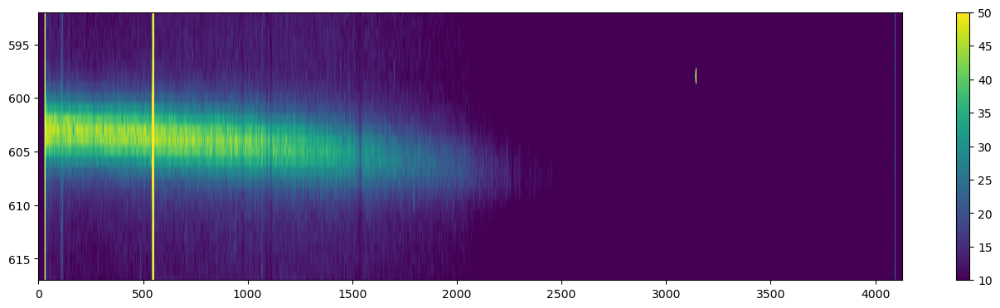

In [200]:
plot_limits_size(zap_6_oct03, min = 10, max = 50, ytop = 592, ybottom = 617)

In [201]:
spectrum6_oct = grab_spectrum(np.flip(zap_6_oct03, 1), 599, 609)
spectrum6_oct = spectrum6_oct / spectrum6_oct[700:3000].max()
x = cal_wave_4th_order(spectrum6_oct, poly4_params_oct03[0], poly4_params_oct03[1], poly4_params_oct03[2], poly4_params_oct03[3], poly4_params_oct03[4])
# plt.figure(figsize = (14, 4))
# plt.plot(x, spectrum6_oct, linewidth = 0.5, color = 'k')
# plt.ylim(0, 1.2)
# plt.xlabel('Wavelength (Angstroms)')
# lines(3900, 5600)
# plt.xlim(3900, 5600)

spectrum6_oct_smoothed = gauss_smooth(spectrum6_oct, 1.0)
# plt.figure(figsize = (14, 4))
# plt.plot(x, spectrum3_oct_smoothed / spectrum3_oct_smoothed[700:3000].max(), linewidth = 0.5, color = 'k')
# plt.ylim(-0.2, 1.2)
# plt.xlabel('Wavelength (Angstroms)')
# lines(3900, 5300)
# plt.xlim(3900, 5300)

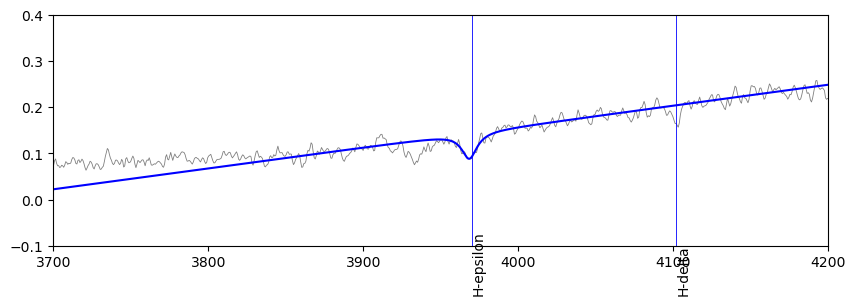

In [202]:
oct6_heps = fit_lorentzian_lin(spectrum6_oct_smoothed, x, 1300, 1420, poly4_params_oct03, h_epsilon, xmin = 3700, xmax = 4200, ymax = 0.4, plot = True)
oct6_hdelta = fit_lorentzian_lin(spectrum6_oct_smoothed, x, 1490, 1550, poly4_params_oct03, h_delta, xmin = 4000, xmax = 4300, ymax = 0.4, plot = False)
oct6_hgamma = fit_lorentzian_lin(spectrum6_oct_smoothed, x, 1840, 1920, poly4_params_oct03, h_gamma, xmin = 4200, xmax = 4500, ymax = 0.5, plot = False)
oct6_hbeta = fit_lorentzian_quad(spectrum6_oct_smoothed, x, 2400, 2800, poly4_params_oct03, h_beta, xmin = 4600, xmax = 5200, ymax = 1, plot = False)
oct6_mag = fit_lorentzian_lin(spectrum6_oct_smoothed, x, 3020, 3080, poly4_params_oct03, magnesium, xmin = 4900, xmax = 5500, ymax = 1, plot = False)

In [203]:
print('H-epsilon:', oct6_heps[0], '+-', oct6_heps[1])
print('H-delta:', oct6_hdelta[0], '+-', oct6_hdelta[1])
print('H-gamma:', oct6_hgamma[0], '+-', oct6_hgamma[1])
print('H-beta:', oct6_hbeta[0], '+-', oct6_hbeta[1])
print('Magnesium:', oct6_mag[0], '+-', oct6_mag[1])

popt_oct6, covar_oct6 = opt.curve_fit(const, np.linspace(0, 4, 5), [oct6_heps[0], oct6_hdelta[0], oct6_hgamma[0], oct6_hbeta[0], oct6_mag[0]], sigma = [oct6_heps[1], oct6_hdelta[1], oct6_hgamma[1], oct6_hbeta[1], oct6_mag[1]])
print(popt_oct6, '+-', np.sqrt(covar_oct6[0]))

H-epsilon: -134.80171248594587 +- 27.03146078091334
H-delta: 21.546676146507306 +- 19.661494683325596
H-gamma: -1.9200234385527202 +- 17.18197157127651
H-beta: -3.3207789308793223 +- 13.505248495191001
Magnesium: 17.716603871319446 +- 14.162802283998637
[-3.65684708] +- [19.63591032]


# Oct GC 7

In [204]:
zap_7_oct03 = zap_two(octdir, '06', ['b.0540', 'b.0541'], yearmonth = 2310, max_diff=30)

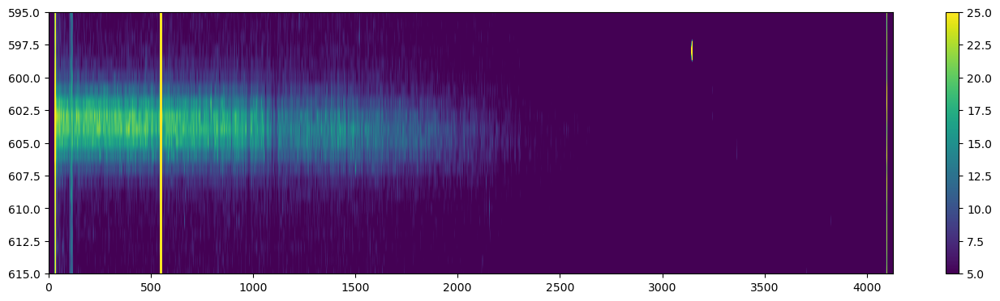

In [205]:
plot_limits_size(zap_7_oct03, min = 5, max = 25, ytop = 595, ybottom = 615)

In [206]:
spectrum7_oct = grab_spectrum(np.flip(zap_7_oct03, 1), 600, 607)
spectrum7_oct = spectrum7_oct / spectrum7_oct[700:3000].max()
x = cal_wave_4th_order(spectrum7_oct, poly4_params_oct06[0], poly4_params_oct06[1], poly4_params_oct06[2], poly4_params_oct06[3], poly4_params_oct06[4])
# plt.figure(figsize = (14, 4))
# plt.plot(x, spectrum7_oct, linewidth = 0.5, color = 'k')
# plt.ylim(-0.2, 1.2)
# plt.xlabel('Wavelength (Angstroms)')
# # lines()
# # plt.xlim(3500, 6000)
# lines(5000, 5500)
# plt.xlim(5000, 5500)

spectrum7_oct_smoothed = gauss_smooth(spectrum7_oct, 1.0)
# plt.figure(figsize = (14, 4))
# plt.plot(x, spectrum3_oct_smoothed / spectrum3_oct_smoothed[700:3000].max(), linewidth = 0.5, color = 'k')
# plt.ylim(-0.2, 1.2)
# plt.xlabel('Wavelength (Angstroms)')
# lines(3900, 5300)
# plt.xlim(3900, 5300)

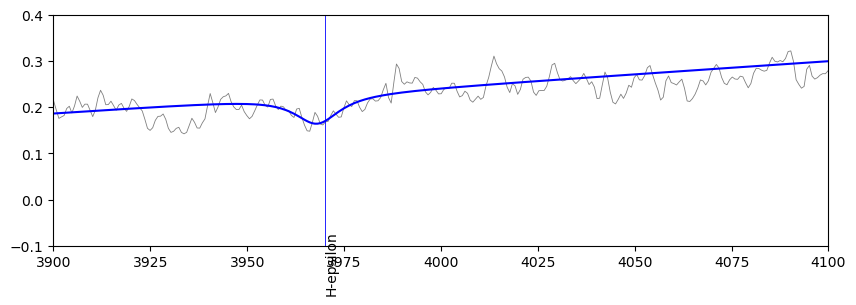

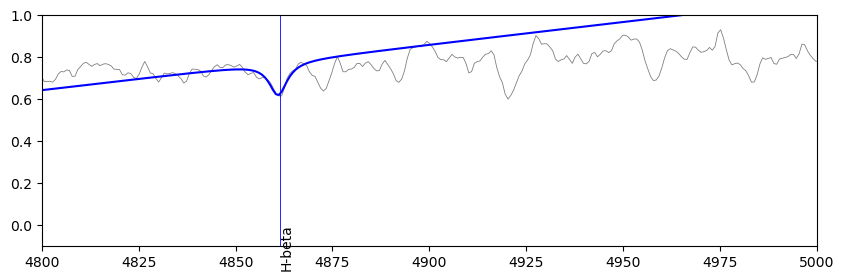

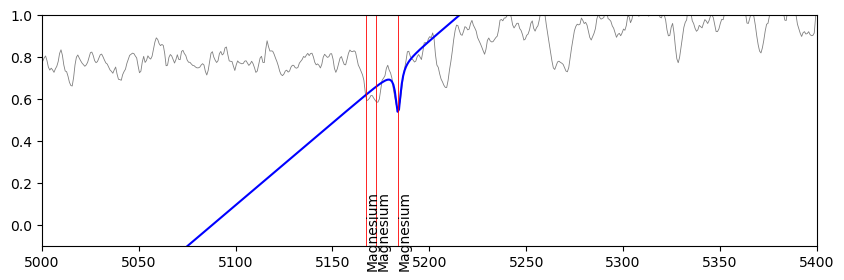

In [207]:
oct7_heps = fit_lorentzian_lin(spectrum7_oct_smoothed, x, 1280, 1380, poly4_params_oct06, h_epsilon, xmin = 3900, xmax = 4100, ymax = 0.4, plot = True)
# oct7_hdelta = fit_lorentzian_lin(spectrum7_oct_smoothed, x, 1460, 1540, poly4_params_oct06, h_delta, xmin = 4000, xmax = 4300, ymax = 0.4, plot = True)
# oct7_hgamma = fit_lorentzian_lin(spectrum7_oct_smoothed, x, 1820, 1870, poly4_params_oct06, h_gamma, xmin = 4200, xmax = 4500, ymax = 0.7, plot = True)
oct7_hbeta = fit_lorentzian_lin(spectrum7_oct_smoothed, x, 2550, 2600, poly4_params_oct06, h_beta, xmin = 4800, xmax = 5000, ymax = 1, plot = True)
oct7_mag = fit_lorentzian_lin(spectrum7_oct_smoothed, x, 3020, 3060, poly4_params_oct06, magnesium, xmin = 5000, xmax = 5400, ymax = 1, plot = True)

In [208]:
print('H-epsilon:', oct7_heps[0], '+-', oct7_heps[1])
# print('H-delta:', oct7_hdelta[0], '+-', oct7_hdelta[1])
# print('H-gamma:', oct7_hgamma[0], '+-', oct7_hgamma[1])
print('H-beta:', oct7_hbeta[0], '+-', oct7_hbeta[1])
print('Magnesium:', oct7_mag[0], '+-', oct7_hbeta[1])

popt_oct7, covar_oct7 = opt.curve_fit(const, np.linspace(0, 2, 3), [oct7_heps[0], oct7_hbeta[0], oct7_mag[0]], sigma = [oct7_heps[1], oct7_hbeta[1], oct7_mag[1]])
print(popt_oct7, '+-', np.sqrt(covar_oct7[0]))

H-epsilon: -153.54674808853906 +- 55.871063202531424
H-beta: -23.928844351741652 +- 12.827984509875263
Magnesium: 18.272317041207817 +- 12.827984509875263
[-4.32927151] +- [21.91629424]


# Cross correlate with Arcturus

In [308]:
# test_arcturus = np.genfromtxt(arcturus_dir + 'ab3000.dat')
# start_index = np.where(test_arcturus[:, 0] == 3000)

# wv_test = test_arcturus[:, 0]
# sum_test = test_arcturus[:, 3]
# wint_test = test_arcturus[:, 6]

In [309]:
# start = 4000
# end = 5000
# step = 0.02

# wv_array = np.zeros(int((end - start) / step))
# summer_array = np.zeros(int((end - start) / step))
# winter_array = np.zeros(int((end - start) / step))

# increment = 25

# entry_begin = 0
# entry_end = 0
# for file_wave in np.arange(start, end, increment):    
#     full_np_array = np.genfromtxt(arcturus_dir + 'ab' 
#                                   + str(file_wave) + '.dat')
#     wvs = full_np_array[:, 0]
#     summer = full_np_array[:, 3]
#     winter = full_np_array[:, 6]

#     start_index = np.where(wvs == file_wave)[0][0]
#     end_index = np.where(wvs == file_wave + increment)[0][0]

#     num_entries = (end_index - start_index)

#     entry_end += int(num_entries)

#     wv_array[entry_begin:entry_end] = wvs[start_index:end_index]
#     summer_array[entry_begin:entry_end] = summer[start_index:end_index]
#     winter_array[entry_begin:entry_end] = winter[start_index:end_index]

#     entry_begin += int(num_entries)

In [310]:
# plt.figure(figsize=(16, 8))

# plt.plot(wv_array, winter_array, color='k', linewidth=0.5)
# # plt.xlim(4000, 4200)

# Cross correlate with template

## Import and first attempt

In [320]:
# reading in files
glob_template_fit = pwd + '/data/fglotemp.fits'
kstar_template_fit = pwd + '/data/m31_k_temp.fits'

spectrum_glob = fits.getdata(glob_template_fit, ext=0).astype(np.float64)
spectrum_glob = spectrum_glob / spectrum_glob.max()

spectrum_kstar = fits.getdata(kstar_template_fit, ext=0).astype(np.float64)
spectrum_kstar = spectrum_kstar# / spectrum_kstar.max() * abs(spectrum_kstar.min())

# wavestart = 3701.8201	waveend = 7503.6894	 waveperpixel = 0.9280
x_glob = np.arange(3701.8201, 7503.6894 - 1, 0.9280)
# x_glob = np.arange(3639.4821, 7180.5998, 0.8791)
# wavestart = 3700.0000	waveend = 7000.0000	waveperpixel = 0.8252
x_kstar = np.arange(3700.0, 7000.0, 0.8252)

In [321]:
print(len(x_glob))

4096


In [296]:
left = 1000
right = 3500
# left = 1400
# right = 2800
# select only on the central part of the spectra with the most prominent lines
wavelengths_03 = cal_wave_4th_order_range(np.linspace(left, right, right - left + 1), poly4_params_oct03[0], poly4_params_oct03[1], poly4_params_oct03[2], poly4_params_oct03[3], poly4_params_oct03[4])
l = np.where(x_gcc2_03 == wavelengths_03[0])[0][0]
r = np.where(x_gcc2_03 == wavelengths_03[-1])[0][0]

spec_test = spectrum2_oct + np.full(len(spectrum2_oct), 1)

# plt.figure(figsize = (14, 3))
# a, b = opt.curve_fit(poly4_model, x_gcc2_03[l:r], spec_test[left:right])
a, b = opt.curve_fit(poly5_model, x_gcc2_03[l:r], spec_test[left:right])
# plt.plot(x_gcc2_03[l:r], spec_test[left:right], color = 'k', alpha = 0.8, label = 'Our Spectrum')
# plt.plot(x_gcc2_03[l:r], poly4_model(x_gcc2_03[l:r], a[0], a[1], a[2], a[3], a[4]), color = 'b', alpha = 0.8, label = 'Fit to Our Spectrum')
# # plt.ylim(-0.1, 1.1)
# # plt.xlim(4000, 5000)
# plt.legend()

In [297]:
flat2oct = spec_test[left:right+1] / poly5_model(x_gcc2_03[l:r+1], a[0], a[1], a[2], a[3], a[4], a[5])
# flat2oct = spec_test[left:right+1] / poly4_model(x_gcc2_03[l:r+1], a[0], a[1], a[2], a[3], a[4])
# plt.figure(figsize = (14, 4))
# plt.plot(x_gcc2_03[l:r+1], flat2oct, label='Our spectrum')
# # plt.plot(BD253x, BD253y, label='Drilling')
# plt.legend()
# plt.ylim(0, 1.1)

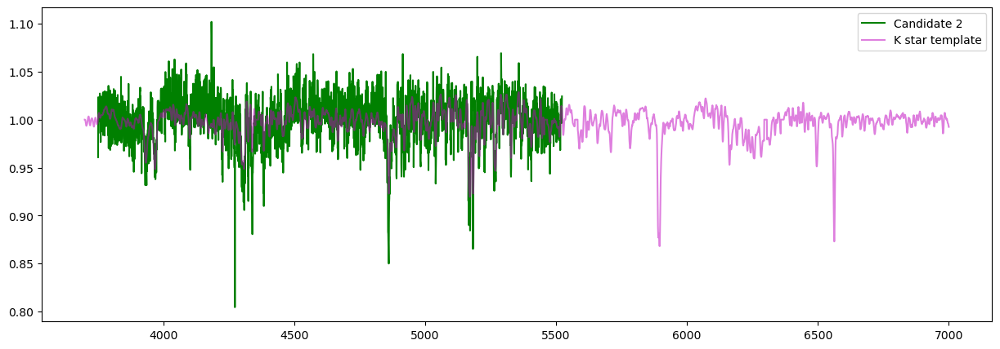

In [325]:
plt.figure(figsize=(15, 5))
# plt.plot(x_gcc2_03, spectrum2_oct_smoothed)
plt.plot(x_gcc2_03[l:r+1], flat2oct, color='green', label='Candidate 2')
# plt.plot(x_glob, spectrum_glob, color='b', label='GC template')
plt.plot(x_kstar, spectrum_kstar + 1, color='m', label='K star template', alpha=0.5)

# plt.ylim(0.85, 1.1)
# plt.xlim(4500, 5500)
plt.legend()
# plt.xlim(3800, 5500)
# lines(3800, 5500, labely=0.2)
# plt.axvline(3933.7) # k-line of singly ionized calcium

# plt.xlim(5000, 5500)
# lines(5000, 5500)

Text(0, 0.5, 'Chi_squared')

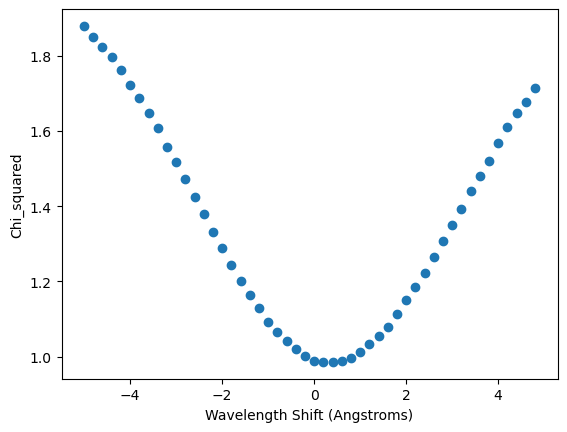

In [299]:
test_chi = calc_chi_squared(flat2oct, x_gcc2_03[l:r+1], spectrum_kstar + 1, x_kstar, startleft=-5, startright=5, step=0.2)
plt.scatter(test_chi[0], test_chi[1])
plt.xlabel('Wavelength Shift (Angstroms)')
plt.ylabel('Chi_squared')

In [300]:
shift = test_chi[0][np.where(test_chi[1] == min(test_chi[1]))[0][0]]
print(shift)
print(calc_velo(shift + h_beta, h_beta))

0.4000000000000048
24.667358351931043


Text(0, 0.5, 'Chi_squared')

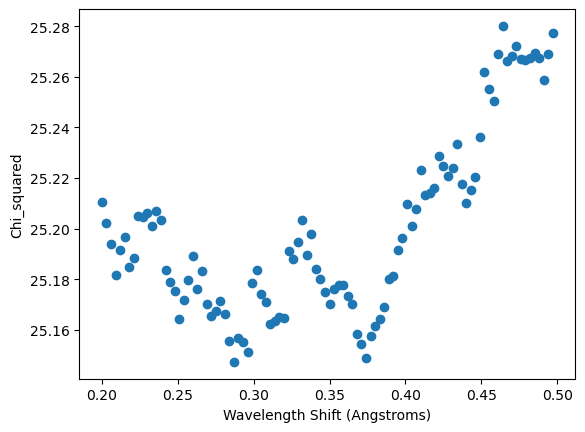

In [221]:
test_chi = calc_chi_squared(flat2oct, x_gcc2_03[l:r+1], spectrum_kstar + 1, x_kstar, startleft=0.2, startright=0.5, step=0.003)
plt.scatter(test_chi[0], test_chi[1])
plt.xlabel('Wavelength Shift (Angstroms)')
plt.ylabel('Chi_squared')

In [222]:
shift = test_chi[0][np.where(test_chi[1] == min(test_chi[1]))[0][0]]
print(shift)
print(calc_velo(shift + h_beta, h_beta))

0.2870000000000001
17.698829617555738


## Calculate velocities for all spectra

In [301]:
left = 1000
right = 3500

x_23 = cal_wave_4th_order(spectrum2_oct, poly4_params_aug23[0], poly4_params_aug23[1], poly4_params_aug23[2], poly4_params_aug23[3], poly4_params_aug23[4])
x_03 = cal_wave_4th_order(spectrum2_oct, poly4_params_oct03[0], poly4_params_oct03[1], poly4_params_oct03[2], poly4_params_oct03[3], poly4_params_oct03[4])
x_06 = cal_wave_4th_order(spectrum2_oct, poly4_params_oct06[0], poly4_params_oct06[1], poly4_params_oct06[2], poly4_params_oct06[3], poly4_params_oct06[4])

wavelengths_23 = cal_wave_4th_order_range(np.linspace(left, right, right - left + 1), poly4_params_aug23[0], poly4_params_aug23[1], poly4_params_aug23[2], poly4_params_aug23[3], poly4_params_aug23[4])
wavelengths_03 = cal_wave_4th_order_range(np.linspace(left, right, right - left + 1), poly4_params_oct03[0], poly4_params_oct03[1], poly4_params_oct03[2], poly4_params_oct03[3], poly4_params_oct03[4])
wavelengths_06 = cal_wave_4th_order_range(np.linspace(left, right, right - left + 1), poly4_params_oct06[0], poly4_params_oct06[1], poly4_params_oct06[2], poly4_params_oct06[3], poly4_params_oct06[4])

left_wave_23 = np.where(x_23 == wavelengths_23[0])[0][0]
right_wave_23 = np.where(x_23 == wavelengths_23[-1])[0][0]
left_wave_03 = np.where(x_03 == wavelengths_03[0])[0][0]
right_wave_03 = np.where(x_03 == wavelengths_03[-1])[0][0]
left_wave_06 = np.where(x_06 == wavelengths_06[0])[0][0]
right_wave_06 = np.where(x_06 == wavelengths_06[-1])[0][0]


spec1_oct03 = spectrum1_oct + np.full(len(spectrum1_oct), 1)
spec2_oct03 = spectrum2_oct + np.full(len(spectrum2_oct), 1)
spec3_oct03 = spectrum3_oct + np.full(len(spectrum3_oct), 1)
spec4_oct03 = spectrum4_oct + np.full(len(spectrum4_oct), 1)
spec5_oct03 = spectrum5_oct + np.full(len(spectrum5_oct), 1)
spec6_oct03 = spectrum6_oct + np.full(len(spectrum6_oct), 1)

psmth1_oct03, covsmth1_oct03 = opt.curve_fit(poly5_model, x_03[left_wave_03:right_wave_03], spec1_oct03[left:right])
psmth2_oct03, covsmth2_oct03 = opt.curve_fit(poly5_model, x_03[left_wave_03:right_wave_03], spec2_oct03[left:right])
psmth3_oct03, covsmth3_oct03 = opt.curve_fit(poly5_model, x_03[left_wave_03:right_wave_03], spec3_oct03[left:right])
psmth4_oct03, covsmth4_oct03 = opt.curve_fit(poly5_model, x_03[left_wave_03:right_wave_03], spec4_oct03[left:right])
psmth5_oct03, covsmth5_oct03 = opt.curve_fit(poly5_model, x_03[left_wave_03:right_wave_03], spec5_oct03[left:right])
psmth6_oct03, covsmth6_oct03 = opt.curve_fit(poly5_model, x_03[left_wave_03:right_wave_03], spec6_oct03[left:right])

flat1_oct03 = spec1_oct03[left:right] / poly5_model(x_03[left_wave_03:right_wave_03], psmth1_oct03[0], psmth1_oct03[1], psmth1_oct03[2], psmth1_oct03[3], psmth1_oct03[4], psmth1_oct03[5])
flat2_oct03 = spec2_oct03[left:right] / poly5_model(x_03[left_wave_03:right_wave_03], psmth2_oct03[0], psmth2_oct03[1], psmth2_oct03[2], psmth2_oct03[3], psmth2_oct03[4], psmth2_oct03[5])
flat3_oct03 = spec3_oct03[left:right] / poly5_model(x_03[left_wave_03:right_wave_03], psmth3_oct03[0], psmth3_oct03[1], psmth3_oct03[2], psmth3_oct03[3], psmth3_oct03[4], psmth3_oct03[5])
flat4_oct03 = spec4_oct03[left:right] / poly5_model(x_03[left_wave_03:right_wave_03], psmth4_oct03[0], psmth4_oct03[1], psmth4_oct03[2], psmth4_oct03[3], psmth4_oct03[4], psmth4_oct03[5])
flat5_oct03 = spec5_oct03[left:right] / poly5_model(x_03[left_wave_03:right_wave_03], psmth5_oct03[0], psmth5_oct03[1], psmth5_oct03[2], psmth5_oct03[3], psmth5_oct03[4], psmth5_oct03[5])
flat6_oct03 = spec6_oct03[left:right] / poly5_model(x_03[left_wave_03:right_wave_03], psmth6_oct03[0], psmth6_oct03[1], psmth6_oct03[2], psmth6_oct03[3], psmth6_oct03[4], psmth6_oct03[5])

-1.1399999999999975
-70.30197130315692


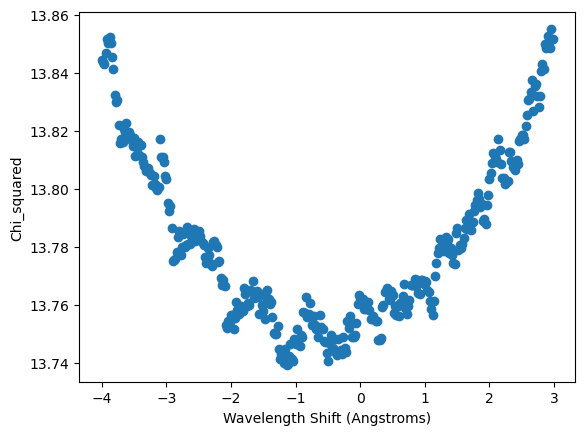

In [302]:
chi_1_oct03 = calc_chi_squared(flat1_oct03, x_03[left_wave_03:right_wave_03], spectrum_kstar + 1, x_kstar, startleft=-4, startright=3, step=0.02)
chi_2_oct03 = calc_chi_squared(flat2_oct03, x_03[left_wave_03:right_wave_03], spectrum_kstar + 1, x_kstar, startleft=-4, startright=3, step=0.02)
chi_3_oct03 = calc_chi_squared(flat3_oct03, x_03[left_wave_03:right_wave_03], spectrum_kstar + 1, x_kstar, startleft=-4, startright=3, step=0.02)
chi_4_oct03 = calc_chi_squared(flat4_oct03, x_03[left_wave_03:right_wave_03], spectrum_kstar + 1, x_kstar, startleft=-4, startright=3, step=0.02)
chi_5_oct03 = calc_chi_squared(flat5_oct03, x_03[left_wave_03:right_wave_03], spectrum_kstar + 1, x_kstar, startleft=-4, startright=3, step=0.02)
chi_6_oct03 = calc_chi_squared(flat6_oct03, x_03[left_wave_03:right_wave_03], spectrum_kstar + 1, x_kstar, startleft=-4, startright=3, step=0.02)

plt.scatter(chi_1_oct03[0], chi_1_oct03[1])
plt.xlabel('Wavelength Shift (Angstroms)')
plt.ylabel('Chi_squared')
shift = chi_1_oct03[0][np.where(chi_1_oct03[1] == min(chi_1_oct03[1]))[0][0]]
print(shift)
print(calc_velo(shift + h_beta, h_beta))

0.32000000000000384
19.733886681531775


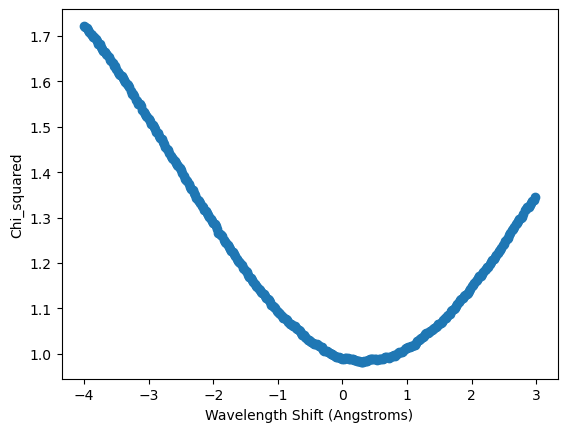

In [303]:
plt.scatter(chi_2_oct03[0], chi_2_oct03[1])
plt.xlabel('Wavelength Shift (Angstroms)')
plt.ylabel('Chi_squared')
shift = chi_2_oct03[0][np.where(chi_2_oct03[1] == min(chi_2_oct03[1]))[0][0]]
print(shift)
print(calc_velo(shift + h_beta, h_beta))

0.12000000000000366
7.4002075055989005


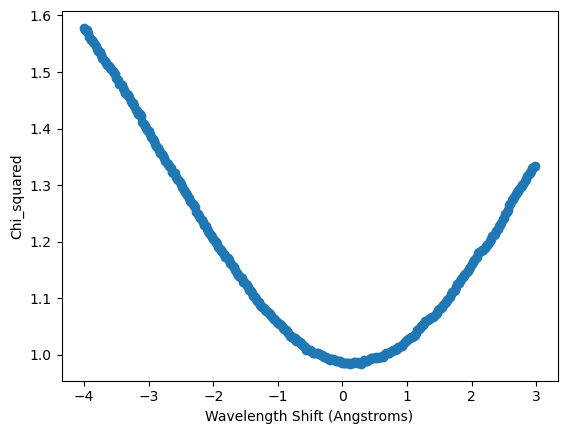

In [304]:
plt.scatter(chi_3_oct03[0], chi_3_oct03[1])
plt.xlabel('Wavelength Shift (Angstroms)')
plt.ylabel('Chi_squared')
shift = chi_3_oct03[0][np.where(chi_3_oct03[1] == min(chi_3_oct03[1]))[0][0]]
print(shift)
print(calc_velo(shift + h_beta, h_beta))

0.6400000000000041
39.46777336312884


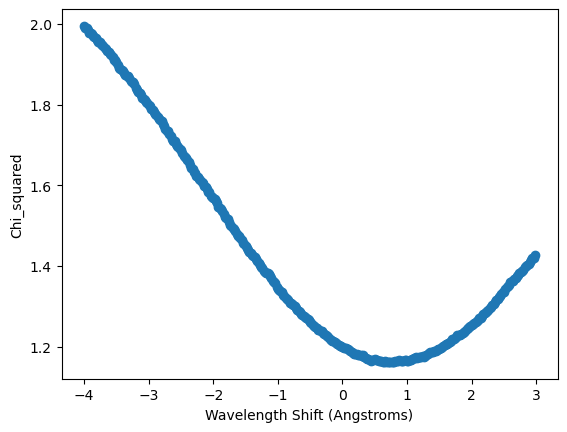

In [305]:
plt.scatter(chi_4_oct03[0], chi_4_oct03[1])
plt.xlabel('Wavelength Shift (Angstroms)')
plt.ylabel('Chi_squared')
shift = chi_4_oct03[0][np.where(chi_4_oct03[1] == min(chi_4_oct03[1]))[0][0]]
print(shift)
print(calc_velo(shift + h_beta, h_beta))

0.34000000000000385
20.967254599164235


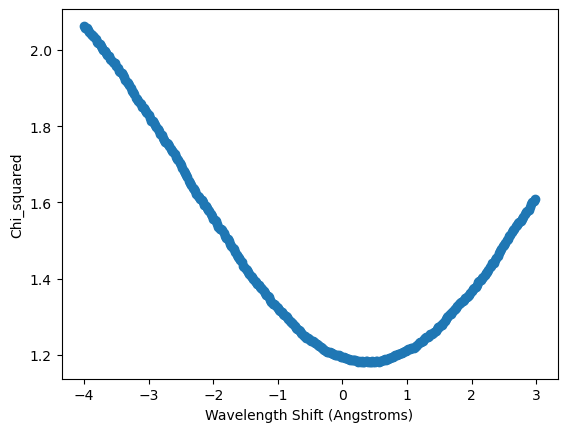

In [306]:
plt.scatter(chi_5_oct03[0], chi_5_oct03[1])
plt.xlabel('Wavelength Shift (Angstroms)')
plt.ylabel('Chi_squared')
shift = chi_5_oct03[0][np.where(chi_5_oct03[1] == min(chi_5_oct03[1]))[0][0]]
print(shift)
print(calc_velo(shift + h_beta, h_beta))

-0.07999999999999652
-4.933471670399266


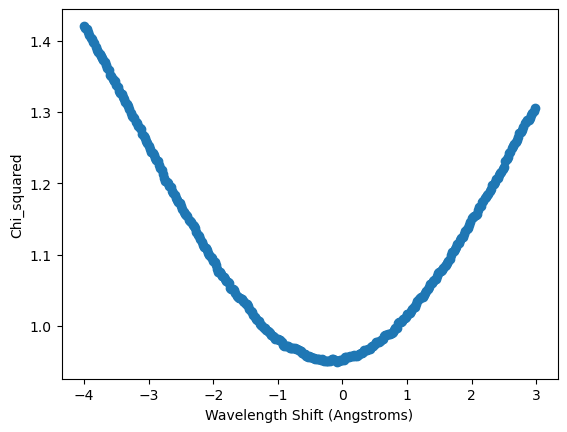

In [307]:
plt.scatter(chi_6_oct03[0], chi_6_oct03[1])
plt.xlabel('Wavelength Shift (Angstroms)')
plt.ylabel('Chi_squared')
shift = chi_6_oct03[0][np.where(chi_6_oct03[1] == min(chi_6_oct03[1]))[0][0]]
print(shift)
print(calc_velo(shift + h_beta, h_beta))

## Check if template spectrum is not red/blueshifted

# Green Checks

In [230]:
green_params06_7, green_covar06_7 = opt.curve_fit(Lorentzian_lin, np.arange(3550, 3600), spectrum7_oct[3550: 3600], p0 = [0, 2, 3575, 0, 1])
# print(green_params23_2, np.sqrt(green_covar23_2[2][2]))
green06_7_pixel = green_params06_7[2]
green_params06_7, green_covar06_7 = opt.curve_fit(Lorentzian_lin, np.arange(5560, 5590), spectrum7_oct[3560: 3590], p0 = [0, 2, 5577, 0, 1])
green06_7_wave = green_params06_7[2]
# print(green_params06_7, np.sqrt(green_covar06_7[2][2]))
print(calc_velo(green06_7_wave, O_I), '+-', calc_velo_err_lmfit(np.sqrt(green_covar06_7[2][2]), O_I))

82.59595323207603 +- 7.39079478539211


(5500.0, 5700.0)

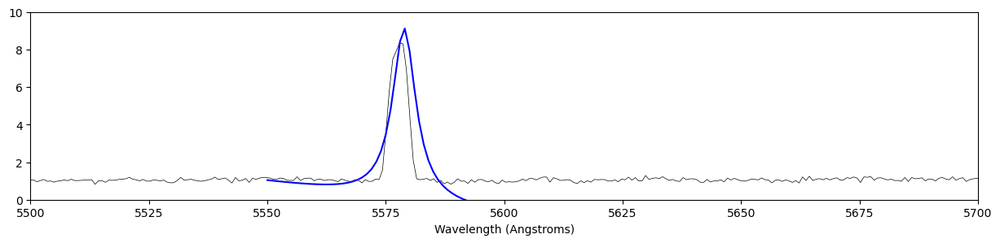

In [231]:
plt.figure(figsize = (15, 3))
plt.plot(x, spectrum7_oct, linewidth = 0.5, color = 'k')
plt.plot(np.arange(5550, 5600), Lorentzian_lin(np.arange(5550, 5600), green_params06_7[0], green_params06_7[1], green_params06_7[2], green_params06_7[3], green_params06_7[4]), color = 'b')
plt.xlabel('Wavelength (Angstroms)')
plt.ylim(0, 10)
plt.xlim(5500, 5700)

In [232]:
green_params23_1, green_covar23_1 = opt.curve_fit(Lorentzian_lin, np.arange(3550, 3600), spectrum1[3550: 3600], p0 = [0, 2, 3575, 0, 1])
# print(green_params23_2, np.sqrt(green_covar23_2[2][2]))
green23_1_pixel = green_params23_1[2]
green_params23_1, green_covar23_1 = opt.curve_fit(Lorentzian_lin, np.arange(5565, 5585), spectrum1[3565: 3585], p0 = [0, 2, 5575, 0, 1])
green23_1_wave = green_params23_1[2]
# print(green_params23_1, np.sqrt(green_covar23_1[2][2]))
print(calc_velo(green23_1_wave, O_I), '+-', calc_velo_err_lmfit(np.sqrt(green_covar23_1[2][2]), O_I))

NameError: name 'spectrum1' is not defined

In [ ]:
green_params23_BD, green_covar23_BD = opt.curve_fit(Lorentzian_lin, np.arange(3550, 3600), BD28_23_spectrum[3550: 3600], p0 = [0, 2, 3575, 0, 1])
# print(green_params23_2, np.sqrt(green_covar23_2[2][2]))
green23_BD_pixel = green_params23_BD[2]
green_params23_BD, green_covar23_BD = opt.curve_fit(Lorentzian_lin, np.arange(5565, 5585), BD28_23_spectrum[3565: 3585], p0 = [0, 2, 5575, 0, 1])
green23_BD_wave = green_params23_BD[2]
# print(green_params23_1, np.sqrt(green_covar23_1[2][2]))
print(calc_velo(green23_BD_wave, O_I), '+-', calc_velo_err_lmfit(np.sqrt(green_covar23_BD[2][2]), O_I))

-46.2084521146796 +- 17.886604413898667


In [ ]:
green_params03_BD, green_covar03_BD = opt.curve_fit(Lorentzian_lin, np.arange(3550, 3600), BD28_03_spectrum[3550: 3600], p0 = [0, 2, 3575, 0, 1])
# print(green_params27_BD, np.sqrt(green_covar27_BD[2][2]))
green03_BD_pixel = green_params03_BD[2]
green_params03_BD, green_covar03_BD = opt.curve_fit(Lorentzian_lin, np.arange(5565, 5585), BD28_03_spectrum[3565: 3585], p0 = [0, 2, 5575, 0, 1])
green03_BD_wave = green_params03_BD[2]
# print(green_params03_BD, np.sqrt(green_covar03_BD[2][2]))
print(calc_velo(green03_BD_wave, O_I), '+-', calc_velo_err_lmfit(np.sqrt(green_covar03_BD[2][2]), O_I))

71.94102075362659 +- 18.263500521314516


In [ ]:
green_params27_BD, green_covar27_BD = opt.curve_fit(Lorentzian_lin, np.arange(3550, 3600), BD28_27_spectrum[3550: 3600], p0 = [0, 2, 3575, 0, 1])
# print(green_params27_BD, np.sqrt(green_covar27_BD[2][2]))
green27_BD_pixel = green_params27_BD[2]
green_params27_BD, green_covar27_BD = opt.curve_fit(Lorentzian_lin, np.arange(5565, 5585), BD28_27_spectrum[3565: 3585], p0 = [0, 2, 5575, 0, 1])
green27_BD_wave = green_params27_BD[2]
# print(green_params27_BD, np.sqrt(green_covar23_1[2][2]))
print(calc_velo(green27_BD_wave, O_I), '+-', calc_velo_err_lmfit(np.sqrt(green_covar27_BD[2][2]), O_I))

17.786555462067433 +- 13.927981273822374


In [ ]:
# green_params06_G191, green_covar06_G191 = opt.curve_fit(Lorentzian_lin, np.arange(3550, 3600), G191_06_spectrum[3550: 3600], p0 = [0, 2, 3575, 0, 1])
# print(green_params27_BD, np.sqrt(green_covar27_BD[2][2]))
# green06_G191_pixel = green_params06_G191[2]
# green_params06_G191, green_covar06_G191 = opt.curve_fit(Lorentzian_lin, np.arange(5560, 5590), G191_06_spectrum[3560: 3590], p0 = [0, 2, 5577, 0, 1])
green_params06_G191, green_covar06_G191 = opt.curve_fit(Lorentzian_lin, np.arange(5572, 5585), G191_06_spectrum[3572: 3585], p0 = [0, 2, 5577, 0, 1])
green06_G191_wave = green_params06_G191[2]
# print(green_params27_BD, np.sqrt(green_covar23_1[2][2]))
print(calc_velo(green06_G191_wave, O_I), '+-', calc_velo_err_lmfit(np.sqrt(green_covar06_G191[2][2]), O_I))

101.7321024200906 +- 17.996566890856915


(5500.0, 5700.0)

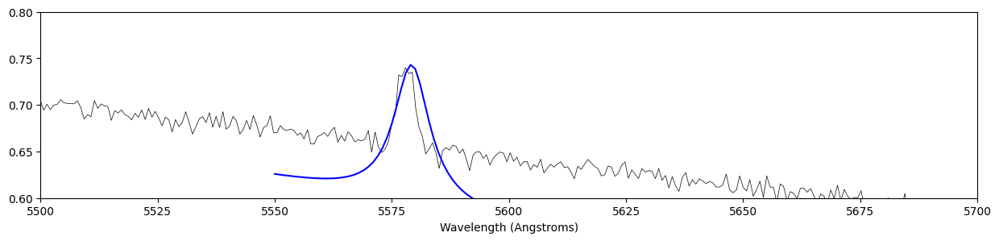

In [ ]:
plt.figure(figsize = (15, 3))
plt.plot(x, G191_06_spectrum, linewidth = 0.5, color = 'k')
plt.plot(np.arange(5550, 5600), Lorentzian_lin(np.arange(5550, 5600), green_params06_G191[0], green_params06_G191[1], green_params06_G191[2], green_params06_G191[3], green_params06_G191[4]), color = 'b')
plt.xlabel('Wavelength (Angstroms)')
plt.ylim(0.6, 0.8)
plt.xlim(5500, 5700)

# Misc.

In [ ]:
print('H-epsilon:', aug1_heps[0], '+-',     aug1_heps[1])
print('H-delta:',   aug1_hdelta[0], '+-',   aug1_hdelta[1])
print('H-gamma:',   aug1_hgamma[0], '+-',   aug1_hgamma[1])
print('H-beta:',    aug1_hbeta[0], '+-',    aug1_hbeta[1])

# print('H-epsilon:', aug2_heps[0], '+-', aug2_heps[1])
# print('H-delta:', aug2_hdelta[0], '+-', aug2_hdelta[1])
# print('H-gamma:', aug2_hgamma[0], '+-', aug2_hgamma[1])
# print('H-beta:', aug2_hbeta[0], '+-', aug2_hbeta[1])
print('')
print('H-epsilon:', oct4_heps[0], '+-',     oct4_heps[1])
print('H-delta:',   oct4_hdelta[0], '+-',   oct4_hdelta[1])
print('H-gamma:',   oct4_hgamma[0], '+-',   oct4_hgamma[1])
print('H-beta:',    oct4_hbeta[0], '+-',    oct4_hbeta[1])
print('')
print('H-epsilon:', oct3_heps[0], '+-',     oct3_heps[1])
print('H-delta:',   oct3_hdelta[0], '+-',   oct3_hdelta[1])
print('H-gamma:',   oct3_hgamma[0], '+-',   oct3_hgamma[1])
print('H-beta:',    oct3_hbeta[0], '+-',    oct3_hbeta[1])
print('')
print('H-epsilon:', oct5_heps[0], '+-',     oct5_heps[1])
print('H-delta:',   oct5_hdelta[0], '+-',   oct5_hdelta[1])
print('H-gamma:',   oct5_hgamma[0], '+-',   oct5_hgamma[1])
print('H-beta:',    oct5_hbeta[0], '+-',    oct5_hbeta[1])


H-epsilon: 1009.8842076263251 +- 1600.1074616667997
H-delta: 60.15329513952347 +- 63.43368538754986
H-gamma: 196.51048175673154 +- 20.823603747886896
H-beta: -411.1337716619587 +- 52.71508673219303

H-epsilon: -159.68536576842936 +- 32.95432810285843
H-delta: -60.571495171370174 +- 36.92581885255975
H-gamma: -30.881001907546228 +- 22.070507045078486
H-beta: -62.82772360251337 +- 16.917131836067984

H-epsilon: -81.21752528602727 +- 39.00336075642906
H-delta: -16.673481166029397 +- 34.5769143912599
H-gamma: -23.1240373191155 +- 24.725111963292235
H-beta: -13.13751226557602 +- 15.487485522376819

H-epsilon: -106.88114146159164 +- 17.251504971092835
H-delta: 38.249590476359586 +- 34.46076000285822
H-gamma: -61.148167285710805 +- 13.806473427236822
H-beta: -25.880407573594663 +- 20.556697954893618
